# 標本平均と不偏分散の分布

* 黒木玄
* 2022-02-08

$
\newcommand\var{\operatorname{var}}
\newcommand\cov{\operatorname{cov}}
$

$X$, $X_1,X_2,\ldots,X_n$ を平均 $\mu$, 分散 $\sigma^2$, 歪度 $\kappa_3$, 尖度 $\kappa_4$ を持つ分布の独立同分布確率変数列であるとする:

$$
\begin{aligned}
&
E[X] = \mu, \quad
E[(X - \mu)^2] = E[X^2] - \mu^2 = \sigma^2, 
\\ &
E\left[\left(\frac{X-\mu}{\sigma}\right)^3\right] = \kappa_3, \quad
E\left[\left(\frac{X-\mu}{\sigma}\right)^4\right] = \kappa_4 + 3.
\end{aligned}
$$

尖度 $\kappa_4$ の定義は正規分布で $0$ になるように定義してある.  そのように定義しておくと,

$$
\log E\left[\exp\left(t\left(\frac{X - \mu}{\sigma}\right)\right)\right] =
\frac{t^2}{2!} + \kappa_3\frac{t^3}{3!} + \kappa_4\frac{t^4}{4!} + O(t^5)
$$

が成立する点も都合がよい(正規分布や中心極限定理の解析と相性がよい).

$X_1,X_2,\ldots,X_n$ の標本平均と不偏分散を次のように書くことにする:

$$
\bar{X} = \frac{1}{n}\sum_{i=1}^n X_i, \quad
S^2 = \frac{1}{n-1}\sum_{i=1}^n (X_i - \bar{X})^2.
$$

さらに, 確率変数 $Z$, $R^2$, $T$ を次のように定める:

$$
Z = \frac{\bar{X}-\mu}{\sqrt{\sigma^2/n}}, \quad
R^2 = \frac{S^2}{\sigma^2}, \quad
T = \frac{\bar{X}-\mu}{\sqrt{S^2/n}} = \frac{Z}{R}.
$$

このとき,

$$
T^2 = \frac{Z^2}{R^2} = \frac{(\bar{X} - \mu)^2}{S^2/n}.
$$

これらの分布の例を計算したい.

In [46]:
using LinearAlgebra
using Distributions
using StatsPlots
default(fmt=:png, titlefontsize=8, legendfontsize=7, guidefontsize=8, tickfontsize=6)
using Random
using KernelDensity
using QuadGK
using StatsBase
using DataFrames

rd(x; digits=4) = round(x; digits)
safediv(x, y) = y == 0 ? y : x/y

myskewness(dist::UnivariateDistribution) = skewness(dist)
myskewness(dist::MixtureModel) = _myskewness(dist)
function _myskewness(dist)
    μ, σ = mean(dist), std(dist)
    f(x) = ((x - μ)/σ)^3 * pdf(dist, x)
    quadgk(f, extrema(dist)...)[1]
end

mykurtosis(dist::UnivariateDistribution) = kurtosis(dist)
mykurtosis(dist::MixtureModel) = _mykurtosis(dist)
function _mykurtosis(dist)
    μ, σ = mean(dist), std(dist)
    f(x) = ((x - μ)/σ)^4 * pdf(dist, x)
    quadgk(f, extrema(dist)...)[1] - 3
end

function myskewness(X)
    n = length(X)
    X̄ = mean(X)
    S = std(X)
    M = n/((n-1)*(n-2))*sum(x -> (x - X̄)^3, X)
    M/S^3
end

name(dist::UnivariateDistribution) = replace(string(dist), r"\{.*\}"=>"")
name(dist::MixtureModel) = _name(dist)
function _name(dist::MixtureModel)
    c = components(dist)
    p = probs(dist)
    s = string(p[1]) * name(c[1])
    for i in 2:length(p)
        s = s * "+" * string(p[i]) * name(c[i])
    end
    s
end

_name (generic function with 1 method)

## 規格化された標本平均と不偏分散の分散共分散

中心極限定理によって, $n$ が十分に大きなとき, $Z$ は標準正規分布に近似的に従い, ゆえに $Z^2$ は自由度 $1$ のχ²分布に近似的に従う.

$n$ が大きなとき, $(Z, R^2)$ や $(Z^2, R^2)$ は２変量正規分布に近似的に従う. より詳しくは, 以下が成立している:

$$
\begin{aligned}
&
E[Z] = 0, \quad
E[R^2] = 1,
\\ &
\var(Z) = 1, \quad
\cov(Z, R^2) = \frac{\kappa_3}{\sqrt{n}}, \quad
\var(R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1}.
\end{aligned}
$$
さらに,

$$
\begin{aligned}
&
E[Z^2] = 1, \quad
E[R^2] = 1,
\\ &
\var(Z^2) = \frac{\kappa_4}{n} + 2, \quad
\cov(Z^2, R^2) = \frac{\kappa_4}{n}, \quad
\var(R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1}.
\end{aligned}
$$

このとき, $(Z, R^2)$ の分散共分散行列が非負値であることより, 

$$
0 \le \var(Z)\var(R^2) - \cov(Z, R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1} - \frac{\kappa_3^2}{n}
$$

となることがわかるので, 歪度 $\kappa_3$ と尖度 $\kappa_4$ について

$$
\kappa_4 \ge \kappa_3^2 - 2
$$

という不等式が成立していなければいけないことがわかる. 

In [2]:
meanZ() = 0.0
meanR2() = 1.0
varZ() = 1.0
covZR2(κ₃, n) = κ₃/√n
varR2(κ₄, n) = κ₄/n + 2/(n-1)
meanZ2() = 1.0
varZ2(κ₄, n) = κ₄/n + 2
covZ2R2(κ₄, n) = κ₄/n

covZ2R2 (generic function with 1 method)

In [3]:
function calcZR2(;
        dist = Gamma(5, 1),
        n = 20,
        L = 10^6,
    )
    μ, σ = mean(dist), std(dist)
    Z = Vector{Float64}(undef, L)
    R² = similar(Z)
    # K3 = similar(Z)
    # K4 = similar(Z)
    # MK3 = similar(Z)
    tmp = [Vector{Float64}(undef, n) for i in 1:Threads.nthreads()]
    Threads.@threads for i in 1:L
        X = rand!(dist, tmp[Threads.threadid()])
        X̄ = mean(X)
        S² = var(X)
        Z[i] = √n * (X̄ - μ) / σ
        R²[i] = S²/σ^2
        # K3[i] = skewness(X)
        # K4[i] = kurtosis(X)
        # MK3[i] = myskewness(X)
    end
    Z² = @. Z^2
    T = @. Z / √(R²)
    T² = @. Z² / R²
    κ₃ = myskewness(dist)
    κ₄ = mykurtosis(dist)
    #(; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, K3, K4, MK3)
    (; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄)
end

calcZR2 (generic function with 1 method)

In [4]:
function testZR2(;
        dist = Gamma(5, 1),
        n = 20,
        L = 10^6,
    )
    #(; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, K3, K4, MK3) = calcZR2(; dist, n, L)
    (; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄) = calcZR2(; dist, n, L)
    #@show κ₃, mean(K3), std(K3), mean(MK3), std(MK3)
    #@show κ₄, mean(K4), std(K4)
    name = ["E[Z]", "E[R²]", "var(Z)", "cov(Z, R²)", "var(R²)", "E[Z²]", "var(Z²)", "cov(Z², R²)"]
    simulation = [mean(Z), mean(R²), var(Z), cov(Z, R²), var(R²), mean(Z²), var(Z²), cov(Z², R²)]
    exactvalue = [meanZ(), meanR2(), varZ(), covZR2(κ₃, n), varR2(κ₄, n), meanZ2(), varZ2(κ₄, n), covZ2R2(κ₄, n)]
    difference = simulation - exactvalue
    df = DataFrame(; name, simulation, exactvalue, difference)
end

testZR2 (generic function with 1 method)

In [5]:
@time testZR2(; dist = Gamma(2,1), n = 10)

  0.522930 seconds (701.95 k allocations: 106.686 MiB, 5.25% gc time, 80.05% compilation time)


,name,simulation,exactvalue,difference
,String,Float64,Float64,Float64
1,E[Z],0.000117841,0.0,0.000117841
2,E[R²],1.00022,1.0,0.00021762
3,var(Z),1.00002,1.0,1.67914e-5
4,"cov(Z, R²)",0.44768,0.447214,0.000465988
5,var(R²),0.523592,0.522222,0.00136936
6,E[Z²],1.00002,1.0,1.58053e-5
7,var(Z²),2.28943,2.3,-0.0105666
8,"cov(Z², R²)",0.299866,0.3,-0.00013441


In [6]:
@time testZR2(; dist = Gamma(5, 1), n = 5)

  0.070913 seconds (128 allocations: 68.676 MiB, 13.13% gc time)


,name,simulation,exactvalue,difference
,String,Float64,Float64,Float64
1,E[Z],0.000397325,0.0,0.000397325
2,E[R²],0.999949,1.0,-5.05012e-5
3,var(Z),1.00258,1.0,0.00258075
4,"cov(Z, R²)",0.401135,0.4,0.00113495
5,var(R²),0.740358,0.74,0.000358465
6,E[Z²],1.00258,1.0,0.0025799
7,var(Z²),2.27028,2.24,0.0302811
8,"cov(Z², R²)",0.243478,0.24,0.00347816


In [7]:
@time testZR2(; dist = TDist(6), n = 5)

  0.142272 seconds (151.20 k allocations: 76.644 MiB, 8.55% gc time, 42.04% compilation time)


,name,simulation,exactvalue,difference
,String,Float64,Float64,Float64
1,E[Z],0.000353636,0.0,0.000353636
2,E[R²],0.99891,1.0,-0.0010905
3,var(Z),1.00144,1.0,0.0014397
4,"cov(Z, R²)",0.00108382,0.0,0.00108382
5,var(R²),1.08443,1.1,-0.0155666
6,E[Z²],1.00144,1.0,0.00143882
7,var(Z²),2.61451,2.6,0.0145099
8,"cov(Z², R²)",0.595957,0.6,-0.0040428


In [8]:
@time testZR2(; dist = Bernoulli(0.4), n = 5)

  0.088625 seconds (35.74 k allocations: 70.523 MiB, 12.49% gc time, 44.32% compilation time)


,name,simulation,exactvalue,difference
,String,Float64,Float64,Float64
1,E[Z],0.00146972,0.0,0.00146972
2,E[R²],1.00106,1.0,0.00106458
3,var(Z),0.997082,1.0,-0.00291783
4,"cov(Z, R²)",0.181739,0.182574,-0.000835138
5,var(R²),0.13274,0.133333,-0.000593535
6,E[Z²],0.997083,1.0,-0.00291667
7,var(Z²),1.6275,1.63333,-0.0058291
8,"cov(Z², R²)",-0.365055,-0.366667,0.00161177


In [9]:
@time testZR2(; dist = Beta(0.1, 0.2), n = 5)

  0.225295 seconds (6.28 M allocations: 220.989 MiB, 3.57% gc time, 49.70% compilation time)


,name,simulation,exactvalue,difference
,String,Float64,Float64,Float64
1,E[Z],-0.00107061,0.0,-0.00107061
2,E[R²],0.999372,1.0,-0.000627798
3,var(Z),1.00083,1.0,0.000831264
4,"cov(Z, R²)",0.313368,0.313526,-0.000158192
5,var(R²),0.239236,0.23913,0.000105074
6,E[Z²],1.00083,1.0,0.00083141
7,var(Z²),1.74249,1.73913,0.00335761
8,"cov(Z², R²)",-0.261685,-0.26087,-0.000815552


## R²で条件付けられたZの条件付き分布

$R^2 = r^2$ で条件付けらえた $Z$ の条件付き確率分布は平均と分散がそれぞれ

$$
\mu(r^2) = 
\frac{\cov(Z, R^2)}{\var(R^2)} \log r^2,
\quad
\sigma^2(r^2) =
(r^2)^{\dfrac{\cov(Z^2, R^2)}{\var(R^2)}}
\left(\var(Z) - \frac{\cov(Z, R^2)^2}{\var(R^2)}\right)
$$

の正規分布に近似的に従うことを数値的に確認しよう. ここで,

$$
\begin{aligned}
&
\frac{\cov(Z, R^2)}{\var(R^2)} = \frac{{\kappa_3}/{\sqrt{n}}}{{\kappa_4}/{n} + {2}/{(n-1)}},
\\ &
\frac{\cov(Z^2, R^2)}{\var(R^2)} = \frac{{\kappa_4}/{n}}{{\kappa_4}/{n} + {2}/{(n-1)}},
\\ &
\var(Z) - \frac{\cov(Z, R^2)^2}{\var(R^2)} = 1 - \frac{\kappa_3^2/n}{{\kappa_4}/{n} + {2}/{(n-1)}}.
\end{aligned}
$$

In [10]:
mu(κ₃, κ₄, n, r²) = covZR2(κ₃, n)/varR2(κ₄, n) * log(r²) 
sigma2(κ₃, κ₄, n, r²) = (r²)^(covZ2R2(κ₄, n)/varR2(κ₄, n)) * (varZ() - covZR2(κ₃, n)^2/varR2(κ₄, n))

sigma2 (generic function with 1 method)

In [45]:
function conditioned_quantile(Z, p, Y, y; δ = std(Y)/min(25, length(X) ÷ 100))
    m = @. y - δ ≤ Y < y + δ
    !any(m) && return NaN
    quantile(Z[m], p)
end

function conditioned_mean(Z, Y, y; δ = std(Y)/min(25, length(X) ÷ 100))
    m = @. y - δ ≤ Y < y + δ
    !any(m) && return NaN
    mean(Z[m])
end

function conditioned_kde(X, Y; Yspan = (0.001, 0.999), δ = std(Y)/min(25, length(X) ÷ 100))
    weights = similar(X)
    for y in range((quantile.(Ref(Y), Yspan) .+ (-4δ, 4δ))...; step = 2δ)
        m = @. y - δ ≤ Y < y + δ
        weights[m] .= any(m) ? 1/count(m) : 0.0
    end
    kde((X, Y); weights)
end

function conditioned_ik(X, Y; Yspan = (0.001, 0.9999), δ = std(Y)/min(25, length(X) ÷ 100))
    InterpKDE(conditioned_kde(X, Y; Yspan, δ))
end

conditioned_ik (generic function with 1 method)

In [77]:
λ, v = eigen(Symmetric(Σ))

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
2-element Vector{Float64}:
 0.9999999999999999
 3.5
vectors:
2×2 Matrix{Float64}:
 -0.894427  0.447214
  0.447214  0.894427

In [86]:
diagm(λ)

2×2 Matrix{Float64}:
 1.0  0.0
 0.0  3.5

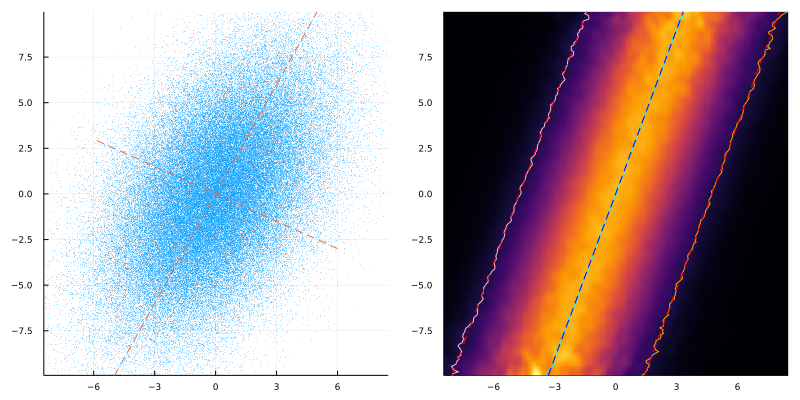

In [115]:
L = 10^6
scattermax = 10^5

Σ = 5*[
    1.5 1.0
    1.0 3.0
]
XY = rand(MvNormal(zeros(2), Σ), L)
X = XY[1, :]
Y = XY[2, :]

Xspan = (0.001, 0.999)
Yspan = (0.005, 0.995)
Xrange = quantile.(Ref(X), Xspan)
Yrange = quantile.(Ref(Y), Yspan)
xs = range(Xrange..., 200)
ys = range(Yrange..., 200)

λ, v = eigen(Symmetric(Σ))
c = 3.0

P = plot(; xlim = Xrange, ylim = Yrange)
scatter!(X[1:min(end, scattermax)], Y[1:min(end, scattermax)]; alpha=0.3, msw=0, ms=1, label="")
plot!(c*√λ[1]*[-v[1,1], v[1,1]], c*√λ[1]*[-v[2,1], v[2,1]]; label="", c=2, ls=:dash)
plot!(c*√λ[2]*[-v[1,2], v[1,2]], c*√λ[2]*[-v[2,2], v[2,2]]; label="", c=2, ls=:dash)

cik = conditioned_ik(X, Y; Yspan)
conddist(y) = Normal(Σ[1,2]/Σ[2,2] * y, √(Σ[1,1] - Σ[1,2]^2/Σ[2,2]))

cm = conditioned_mean.(Ref(X), Ref(Y), ys)
cq025 = conditioned_quantile.(Ref(X), 0.025, Ref(Y), ys)
cq975 = conditioned_quantile.(Ref(X), 0.975, Ref(Y), ys)

Q = plot(; colorbar=false)
heatmap!(xs, ys, (x, y) -> pdf(cik, x, y); size=(400, 250))
plot!(cm, ys; label="", c=:cyan)
plot!(cq025, ys; label="", c=:pink)
plot!(cq975, ys; label="", c=:orange)
plot!((y -> mean(conddist(y))).(ys), ys; label="", c=:blue, ls=:dash)
plot!((y -> quantile(conddist(y), 0.025)).(ys), ys; label="", c=:red, ls=:dashdot)
plot!((y -> quantile(conddist(y), 0.975)).(ys), ys; label="", c=:red, ls=:dash)
plot!(; xlim=extrema(xs), ylim=extrema(ys))

plot(P, Q; size=(800, 400))

In [116]:
function _plotZ(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, Zspan, R2span, legend, scattermax; kwargs...)
    r² = range(quantile.(Ref(R²), R2span)..., 200)
    z = range(quantile.(Ref(Z), Zspan)..., 200)
    
    R2lim = quantile.(Ref(R²), R2span)
    Zlim = quantile.(Ref(Z), Zspan)
    Σ = [
        varZ()        covZR2(κ₃, n)
        covZR2(κ₃, n) varR2(κ₄, n)
    ] |> Symmetric
    λ, v = eigen(Σ)
    c = 2.5

    P = plot(; xlabel="Z = √n(X̄ - μ)/σ", ylabel="R² = S²/σ²", xlim=Zlim, ylim=R2lim)
    scatter!(Z[1:min(end, scattermax)], R²[1:min(end, scattermax)]; alpha=0.3, msw=0, ms=1, label="")
    vline!([0]; label="", ls=:dot, c=:black)
    hline!([1]; label="", ls=:dot, c=:black)
    plot!(c*√λ[1]*[-v[1,1], v[1,1]], ones(2) + c*√λ[1]*[-v[2,1], v[2,1]]; label="", c=2, ls=:dash)
    plot!(c*√λ[2]*[-v[1,2], v[1,2]], ones(2) + c*√λ[2]*[-v[2,2], v[2,2]]; label="", c=2, ls=:dash)
    title!(name(dist) * ", n=$n")

    cikZ = conditioned_ik(Z, R²; Yspan = R2span)
    cm = conditioned_mean.(Ref(Z), Ref(R²), r²)
    cq025 = conditioned_quantile.(Ref(Z), 0.025, Ref(R²), r²)
    cq975 = conditioned_quantile.(Ref(Z), 0.975, Ref(R²), r²)
    normal(r²) = Normal(mu(κ₃, κ₄, n, r²), √sigma2(κ₃, κ₄, n, r²))
    CM = mu.(κ₃, κ₄, n, r²)
    CQ025 = (r² -> quantile(normal(r²), 0.025)).(r²)
    CQ975 = (r² -> quantile(normal(r²), 0.975)).(r²)

    Q = plot(; colorbar=false, legend)
    heatmap!(z, r², (z, r²) -> pdf(cikZ, z, r²))
    hline!([1]; label="", c=:white, ls=:dot)
    vline!([0]; label="", c=:white, ls=:dot)
    plot!(cm, r²; label="mean", c=:cyan)
    plot!(cq025, r²; label="2.5%", c=:pink)
    plot!(cq975, r²; label="97.5%", c=:orange)
    plot!(CM, r²; label="", c=:blue, ls=:dash)
    plot!(CQ025, r²; label="", c=:red, ls=:dashdot)
    plot!(CQ975, r²; label="", c=:red, ls=:dash)
    plot!(; xlabel="Z", ylabel="R²")
    plot!(; xlim=extrema(z), ylim=extrema(r²))
    title!("$(name(dist)), n=$n")
    plot!(; kwargs...)
    
    P, Q
end

function plotZ(;
        dist = Gamma(2, 1),
        n = 160,
        L = 10^6,
        Zspan = (0.001, 0.999),
        R2span = (0.001, 0.999),
        legend = :topleft,
        scattermax = 10^5,
        kwargs...
    )
    (; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄) = calcZR2(; dist, n, L)
    P, Q = _plotZ(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, Zspan, R2span, legend, scattermax; kwargs...)
    plot(P, Q; size=(1000, 350), bottommargin=3Plots.mm, leftmargin=3Plots.mm)
    plot!(; kwargs...)
end

function plotZiter(;
        dist = Gamma(2, 1),
        n = (10, 40, 160),
        L = 10^6,
        Zspan = (0.001, 0.999),
        R2span = (0.001, 0.999),
        legend = :topleft,
        scattermax = 10^5,
        distxlim = nothing, 
        distylim = nothing, 
        kwargs...
    )
    println("skewness = ", myskewness(dist))
    println("kurtosis = ", mykurtosis(dist))
    flush(stdout)
    if isnothing(distxlim)
        plot(dist; label="", title=name(dist), ylim=distylim)
    else
        plot(x -> pdf(dist, x), distxlim...; label="", title=name(dist), xlim=distxlim, ylim=distylim)
    end
    plot!(; size=(500, 350)) |> display
    for n in n
        plotZ(; dist, n, L, Zspan, R2span, legend, scattermax, kwargs...) |> display
    end
end

plotZiter (generic function with 1 method)

skewness = 0.0
kurtosis = -1.2


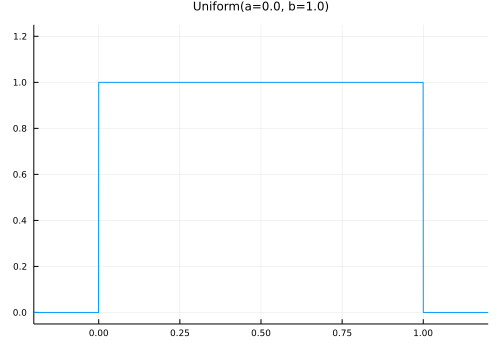

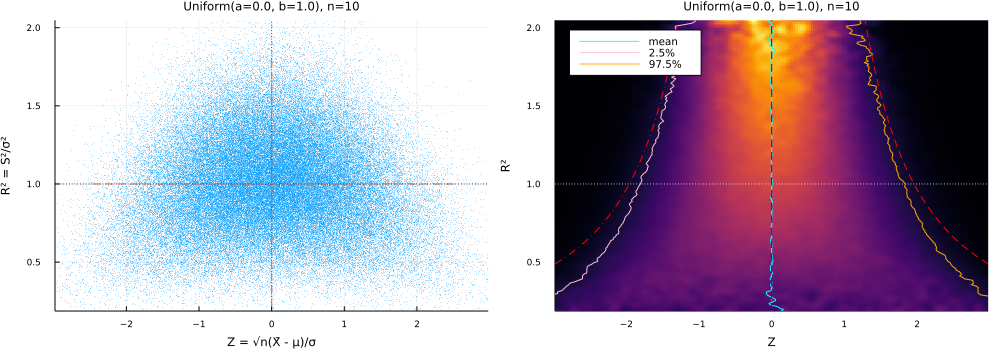

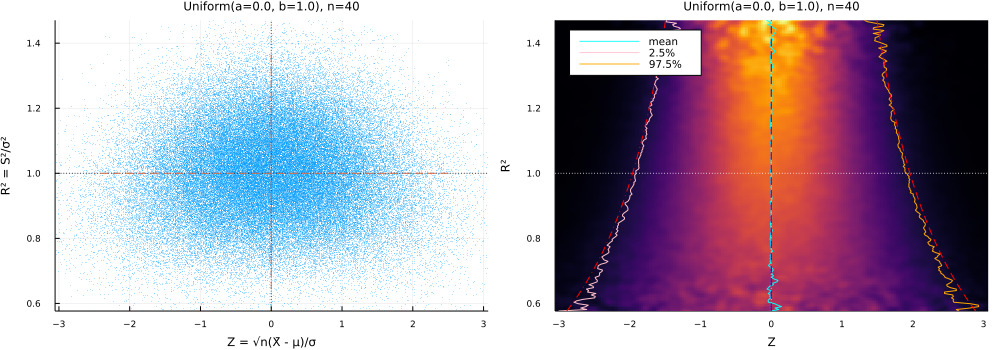

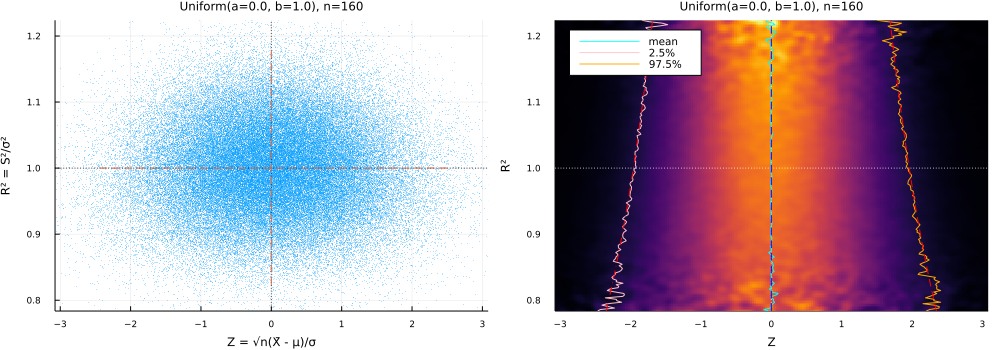

In [117]:
plotZiter(; dist = Uniform(), distxlim=(-0.2, 1.2), distylim=(-0.05, 1.25))

skewness = 0.0
kurtosis = -1.7647058823529413


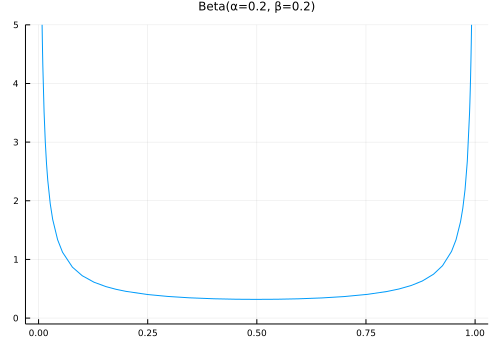

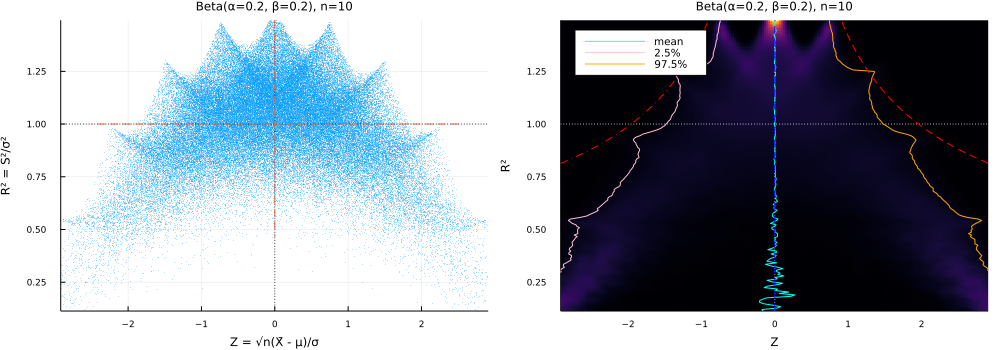

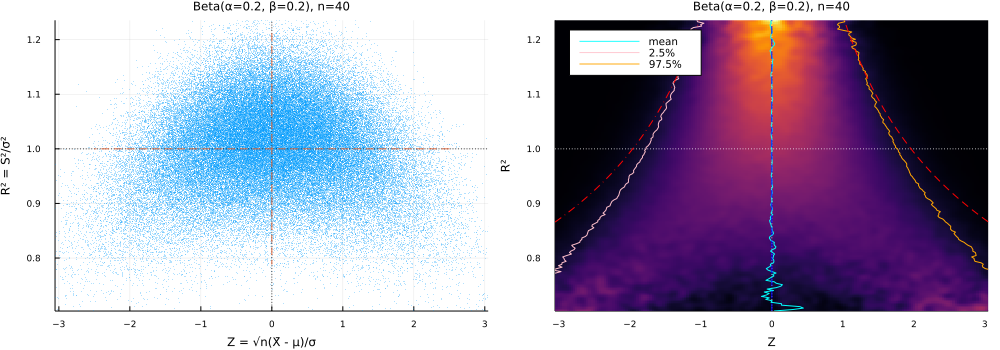

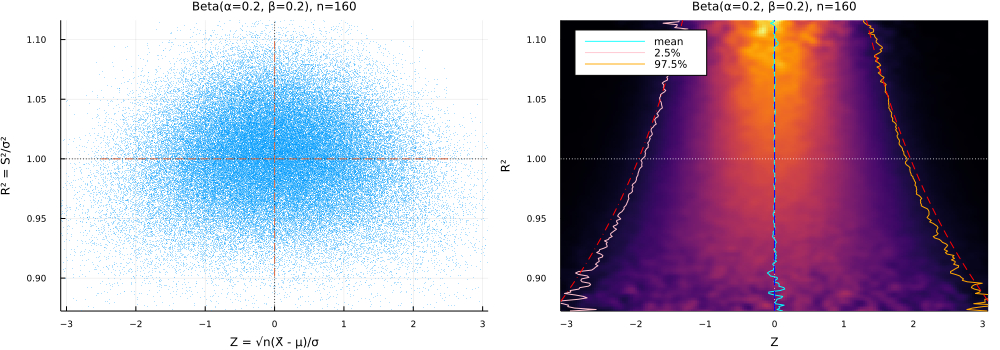

In [118]:
plotZiter(; dist = Beta(0.2, 0.2), distylim=(-0.1, 5))

skewness = 0.0
kurtosis = 3.0


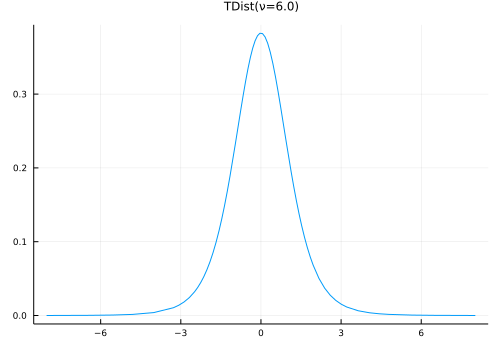

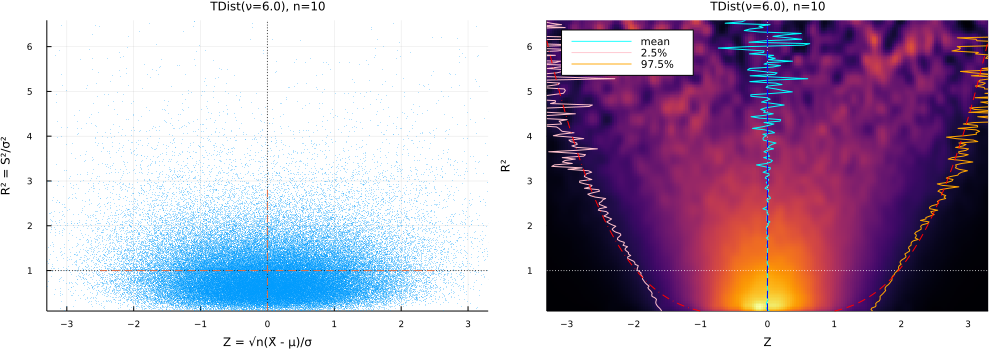

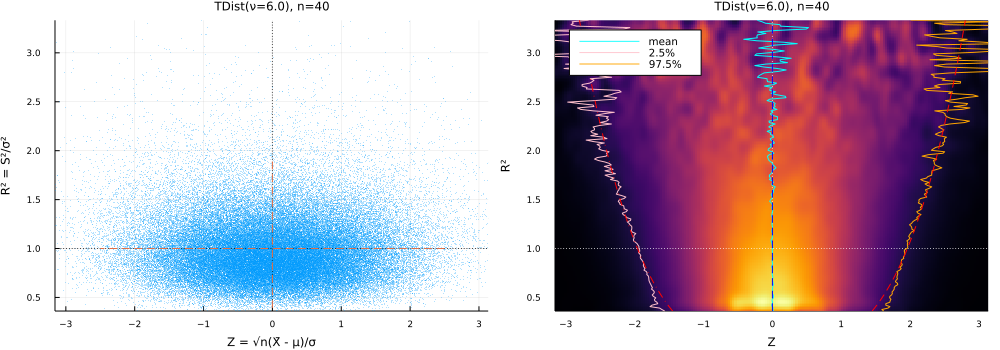

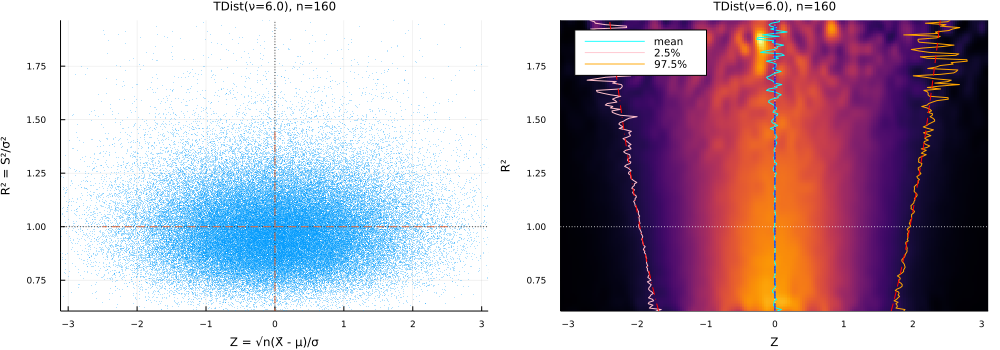

In [119]:
plotZiter(; dist = TDist(6))

skewness = 1.414213562373095
kurtosis = 3.0


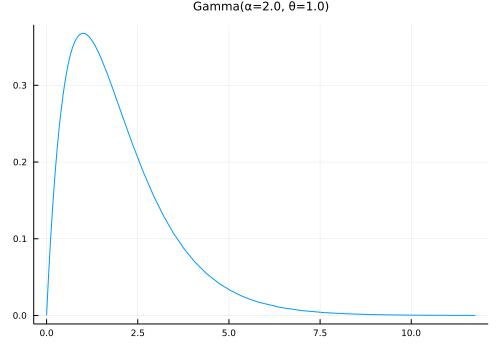

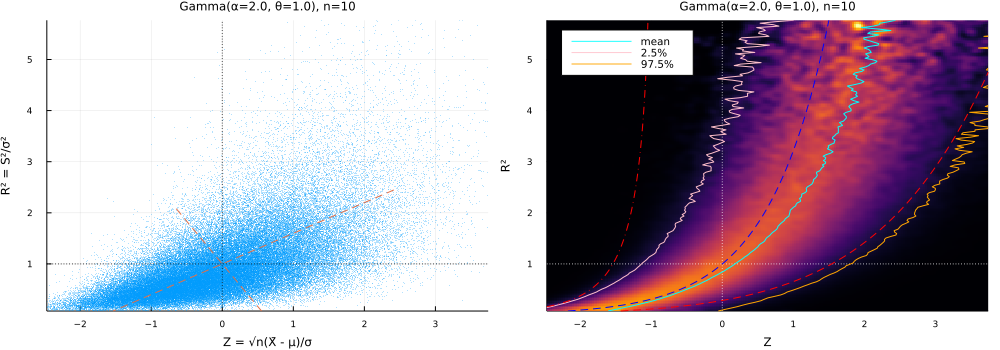

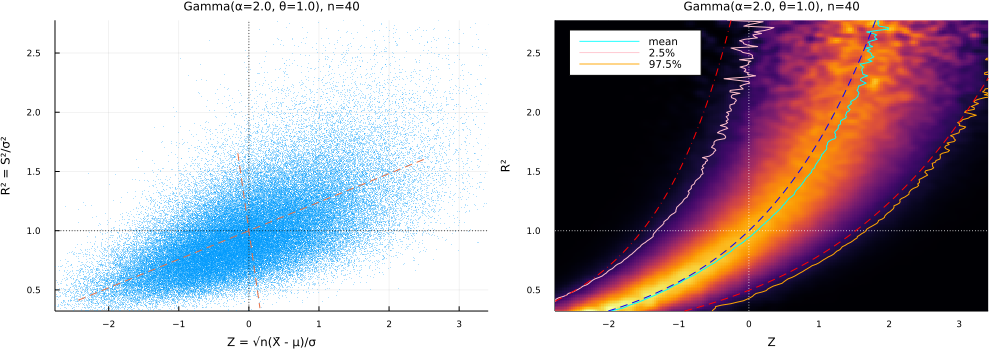

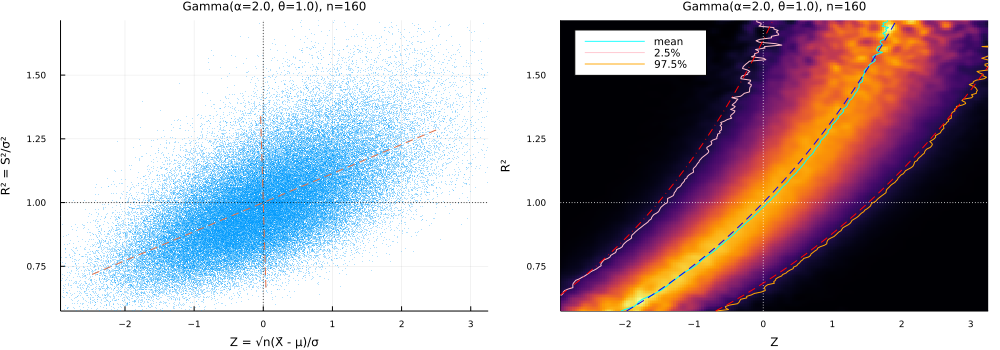

In [120]:
plotZiter(; dist = Gamma(2, 1))

skewness = 2.0
kurtosis = 6.0


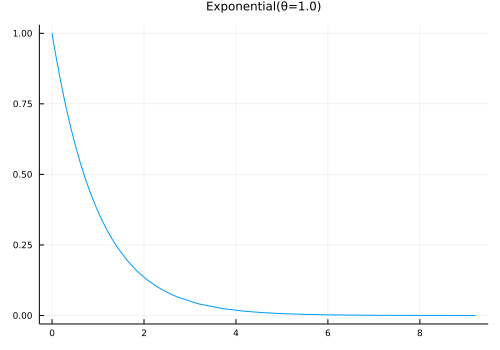

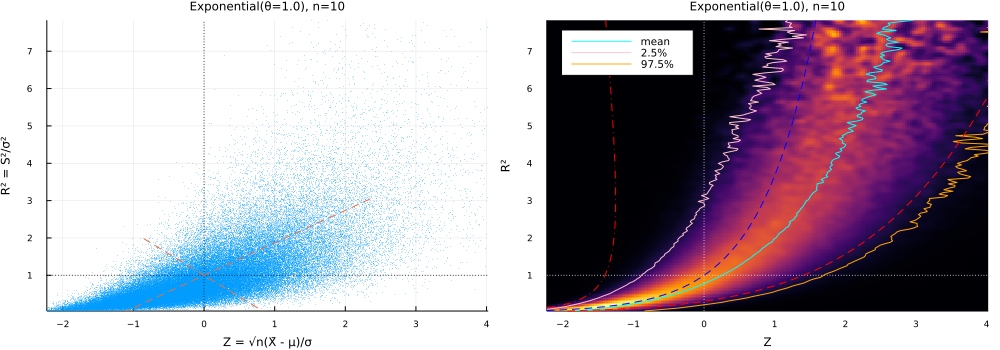

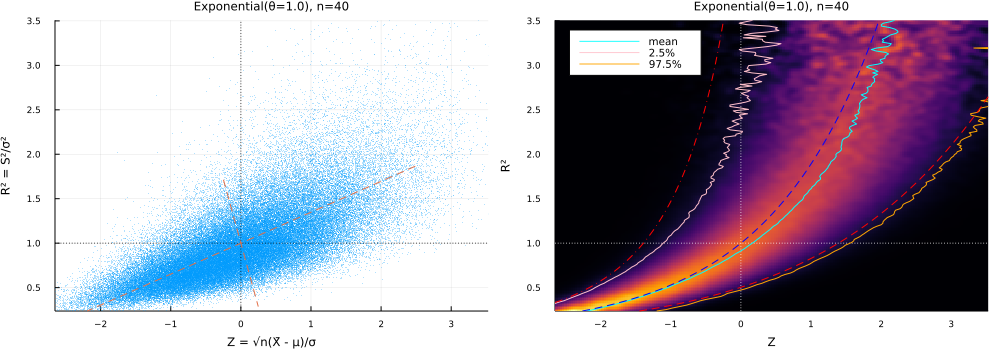

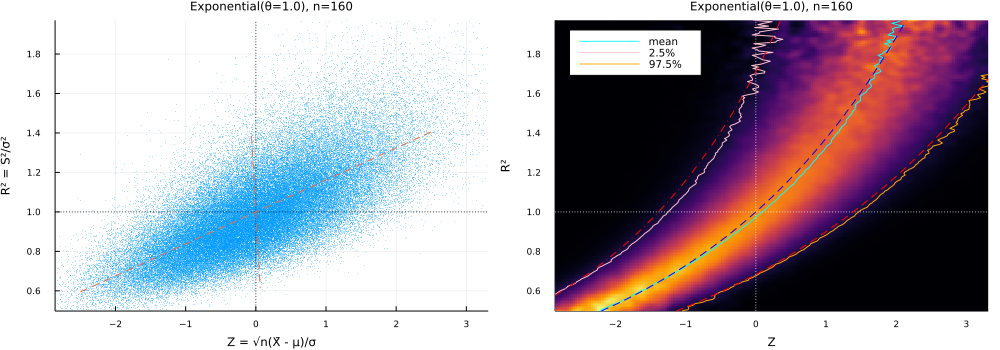

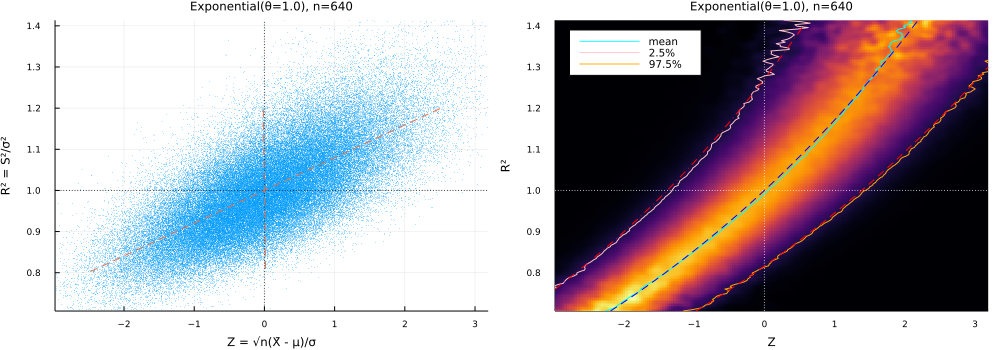

In [121]:
plotZiter(; dist = Exponential(), n = (10, 40, 160, 640))

skewness = 3.1005186785961634
kurtosis = 10.272211720261621


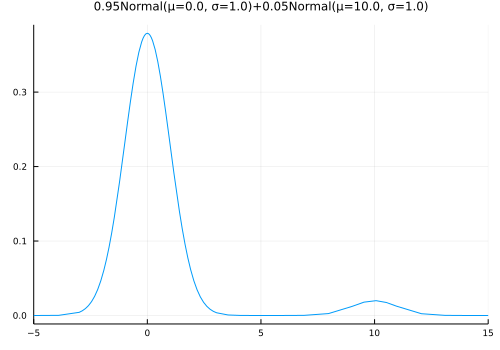

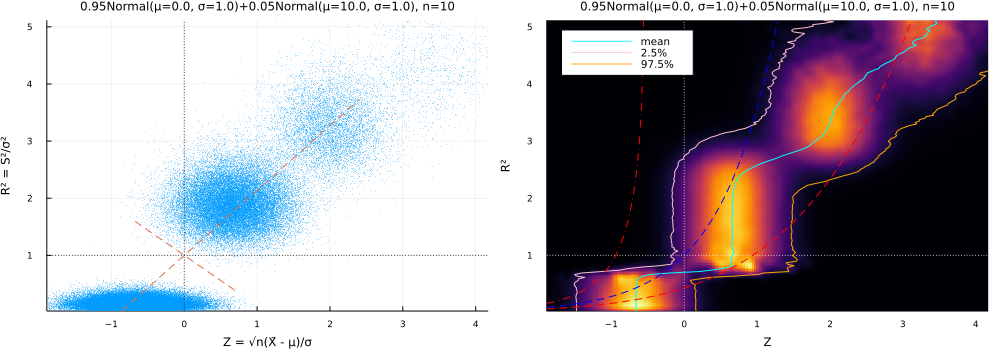

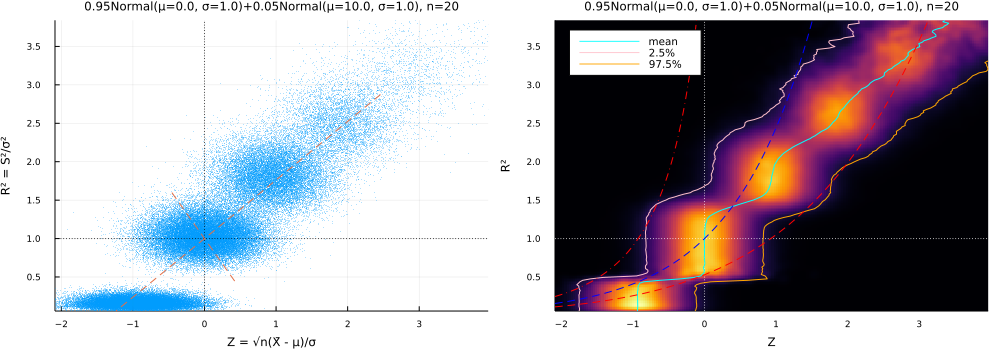

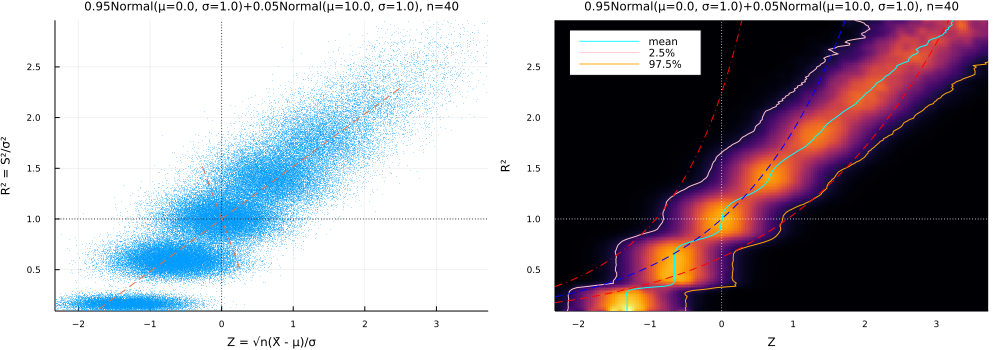

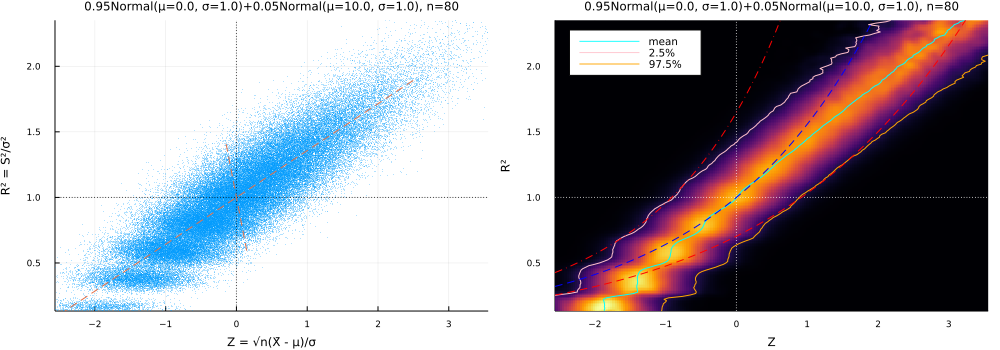

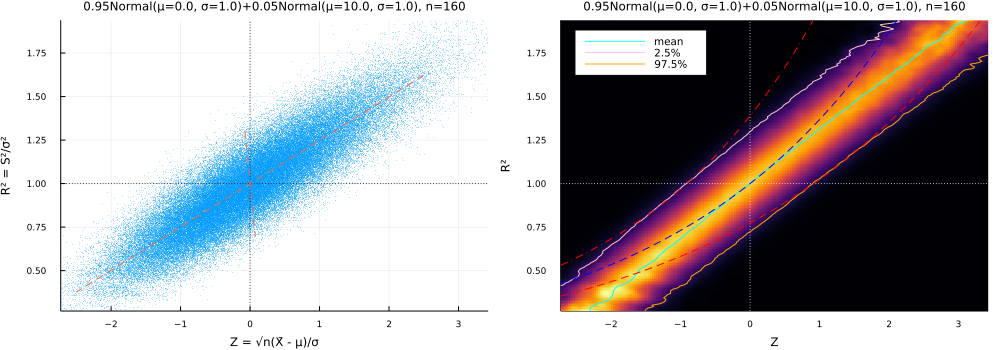

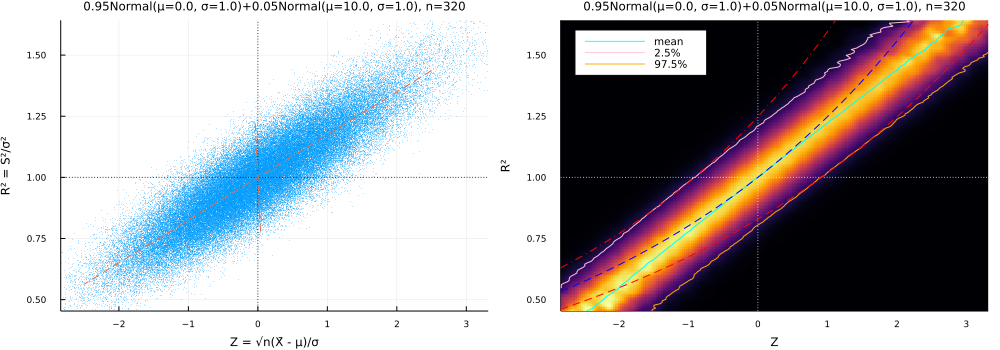

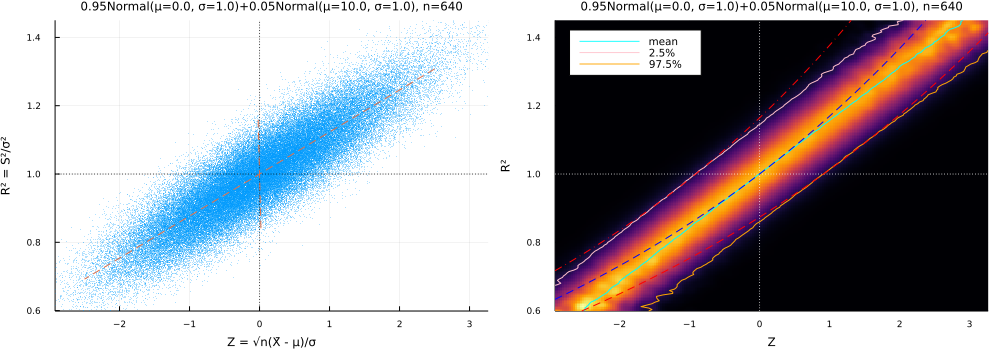

In [122]:
plotZiter(; dist = MixtureModel([Normal(), Normal(10, 1)], [0.95, 0.05]), n = (10, 20, 40, 80, 160, 320, 640), distxlim=(-5, 15))

skewness = 6.184877138632554
kurtosis = 110.9363921763115


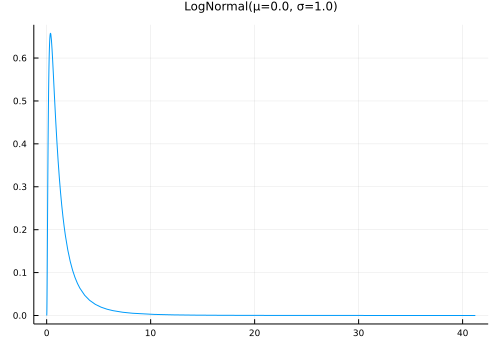

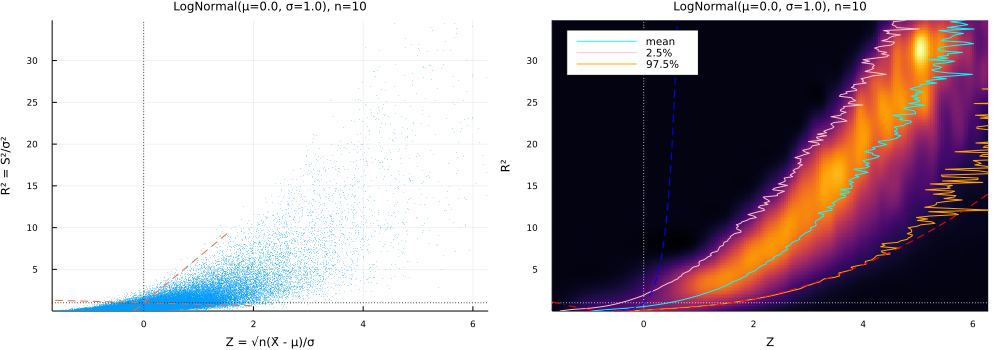

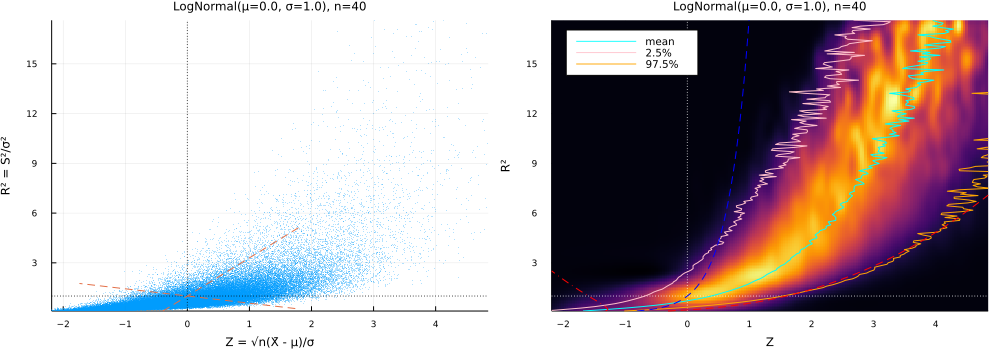

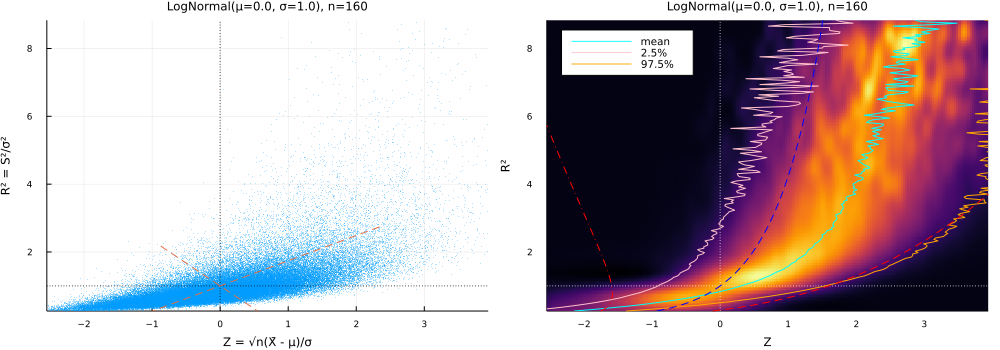

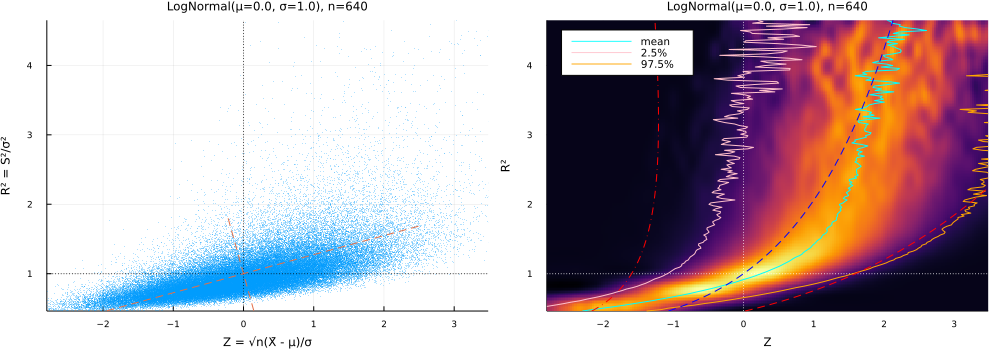

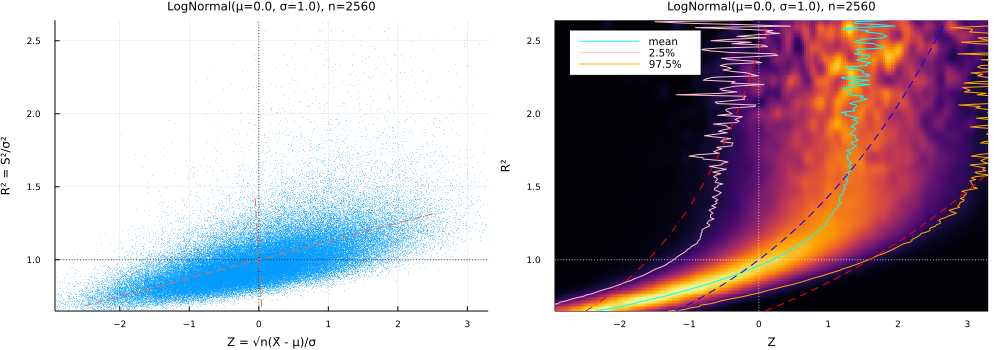

In [123]:
plotZiter(; dist = LogNormal(), n = (10, 40, 160, 640, 2560))

## 前節の近似分布から作った擬似t分布と実際のT統計量の分布の比較

$\var(R^2)$ を $\theta$ と書く:

$$
\theta = \var(R^2) = \frac{\kappa_4}{n} + \frac{2}{n-1}.
$$

$E[R^2]=1$ なので, $R^2$ と同じ平均と分散を持つガンマ分布は $\operatorname{Gamma}(1/\theta, \theta)$ になる.  $\kappa_4=0$ のときのそのガンマ分布 $\operatorname{Gamma}((n-1)/2, 2/(n-1))$ は自由度 $n-1$ のχ²分布 $\operatorname{Gamma}((n-1)/2, 2)$ の $n-1$ 分の1に一致することに注意せよ.

このガンマ分布の $r^2$ に関する密度函数を使って, 平均と分散がそれぞれ

$$
\mu(r^2) = 
\frac{\cov(Z, R^2)}{\var(R^2)} \log r^2,
\quad
\sigma^2(r^2) =
(r^2)^{\dfrac{\cov(Z^2, R^2)}{\var(R^2)}}
\left(\var(Z) - \frac{\cov(Z, R^2)^2}{\var(R^2)}\right)
$$

の正規分布を積分して得られる分布を擬似t分布と呼ぶことにする. ただし, その密度函数の独立変数 $z$ には $z = rt$ を代入する. 

その擬似t分布とt分布とT統計量の分布を比較してみよう.

In [49]:
function pdfpseudot(κ₃, κ₄, n, t)
    θ = varR2(κ₄, n)
    gamma = Gamma(1/θ, θ)
    f(r²) = pdf(gamma, r²)
    normal(r²) = Normal(mu(κ₃, κ₄, n, r²), √sigma2(κ₃, κ₄, n, r²))
    g(z, r²) = pdf(normal(r²), z)
    F(r²) = f(r²) * g(√r² * t, r²) * √r²
    quadgk(F, 0, Inf)[1]
end

function cdfpseudot(κ₃, κ₄, n, t)
    θ = varR2(κ₄, n)
    gamma = Gamma(1/θ, θ)
    f(r²) = pdf(gamma, r²)
    normal(r²) = Normal(mu(κ₃, κ₄, n, r²), √sigma2(κ₃, κ₄, n, r²))
    g(z, r²) = cdf(normal(r²), z)
    F(r²) = f(r²) * g(√r² * t, r²)
    quadgk(F, 0, Inf)[1]
end

function plotpseudot(; κ₃ = 1.0, κ₄ = 1.0, n = 40)
    P = plot(t -> pdfpseudot(κ₃, κ₄, n, t), -6, 6; label="pseudo-t")
    plot!(t -> pdf(TDist(n-1), t), -6, 6; label="t($(n - 1))", ls=:dash)
    title!("κ₃=$(rd(κ₃)), κ₄=$(rd(κ₄)), n=$n")
    plot!(; xlabel="t", ylabel="probability density")
    
    Q = plot(t -> cdfpseudot(κ₃, κ₄, n, -t) + 1 - cdfpseudot(κ₃, κ₄, n, t), 1, 6; label="pseudo-t")
    plot!(t -> 2ccdf(TDist(n-1), t), 1, 6; label="t($(n - 1))", ls=:dash)
    plot!(; xtick=-10:0.5:10, ytick=0:0.05:1)
    title!("P-value")
    plot!(; xlabel="|t| = abs(t)", ylabel="probability")
    
    plot(P, Q; size=(1000, 350), bottommargin=3Plots.mm, leftmargin=3Plots.mm)
end

function plotpseudot_iter(; κ₃ = 1.0, κ₄ = 1.0, n = (10, 40, 160))
    for n in n
        plotpseudot(; κ₃, κ₄, n) |> display
    end
end

plotpseudot_iter (generic function with 1 method)

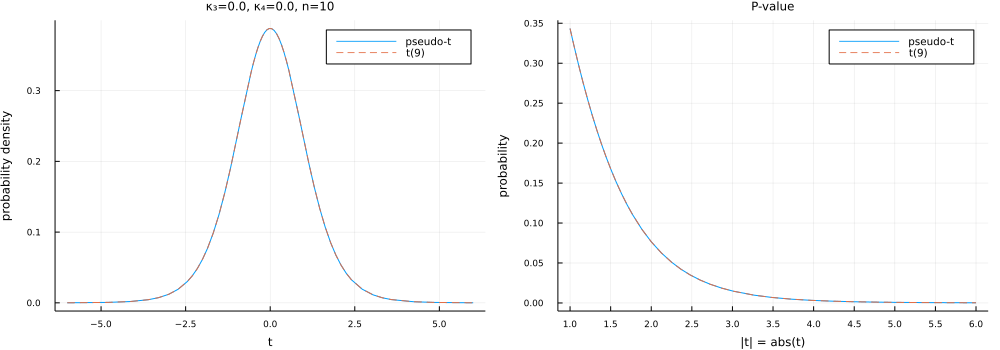

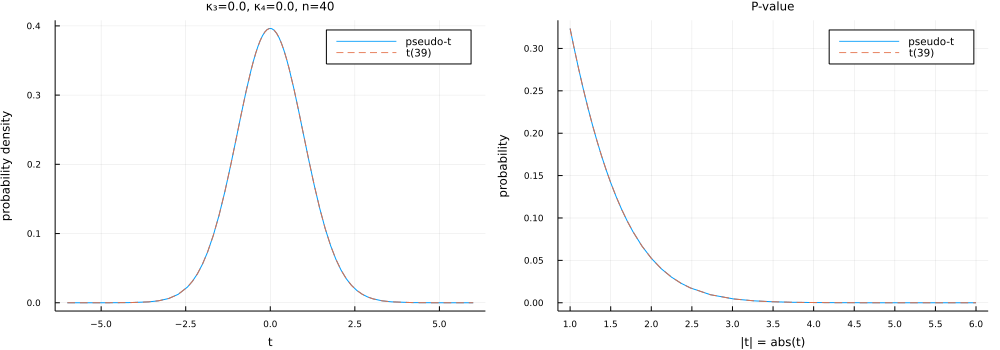

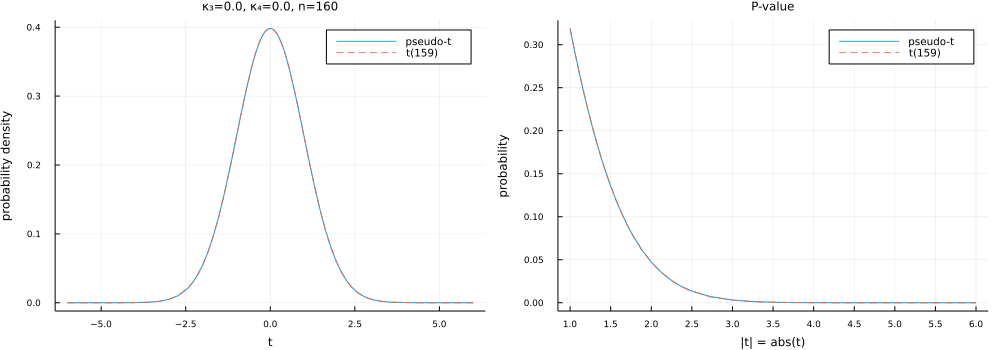

In [50]:
plotpseudot_iter(; κ₃ = 0.0, κ₄ = 0.0)

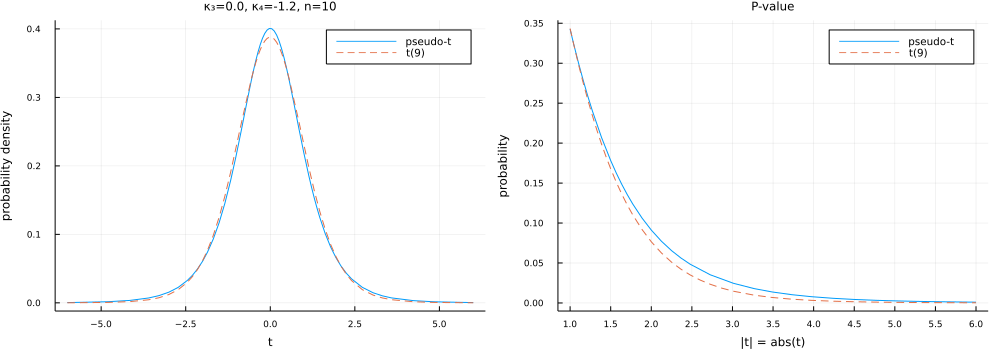

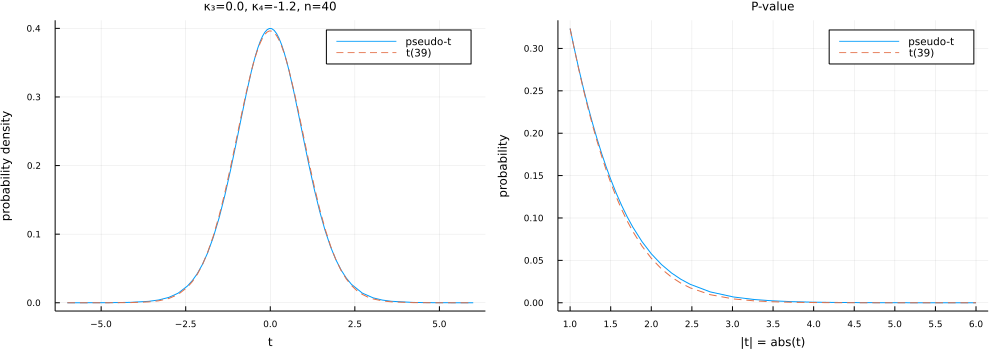

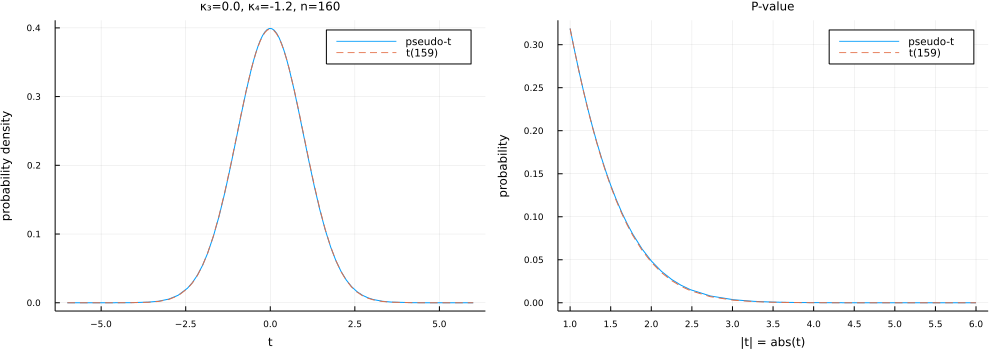

In [54]:
plotpseudot_iter(; κ₃ = 0.0, κ₄ = -1.2)

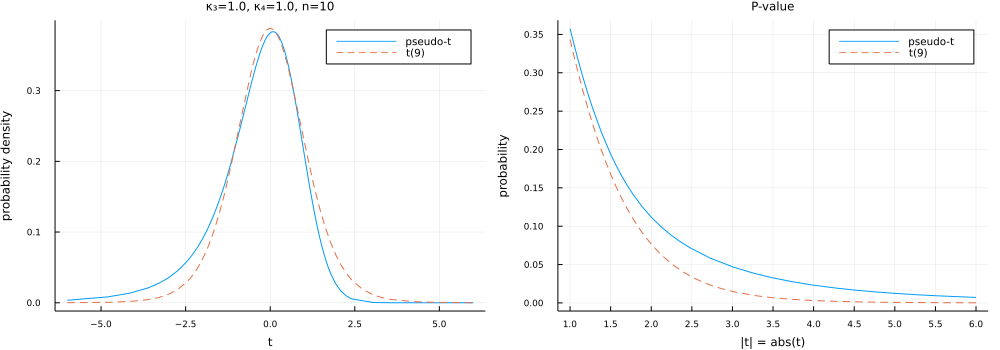

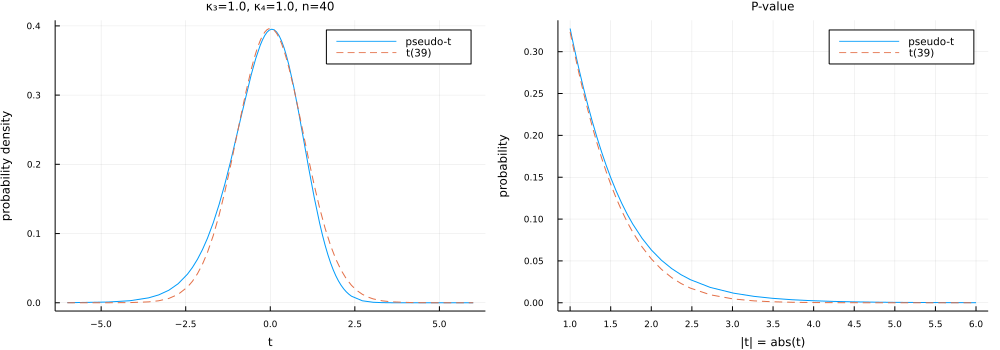

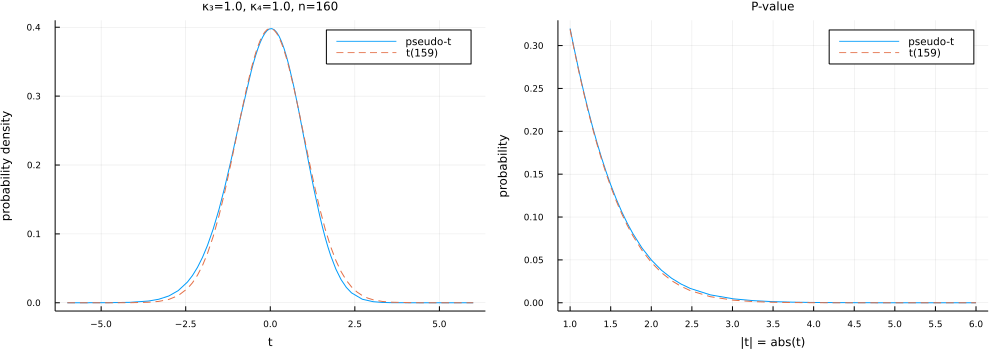

In [55]:
plotpseudot_iter(; κ₃ = 1.0, κ₄ = 1.0)

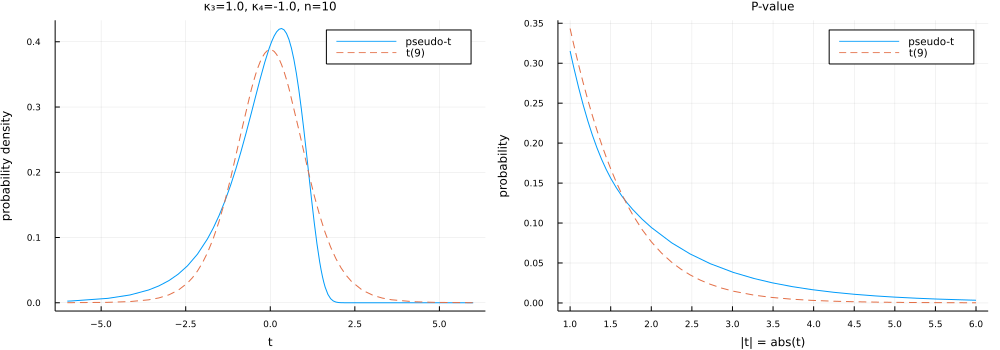

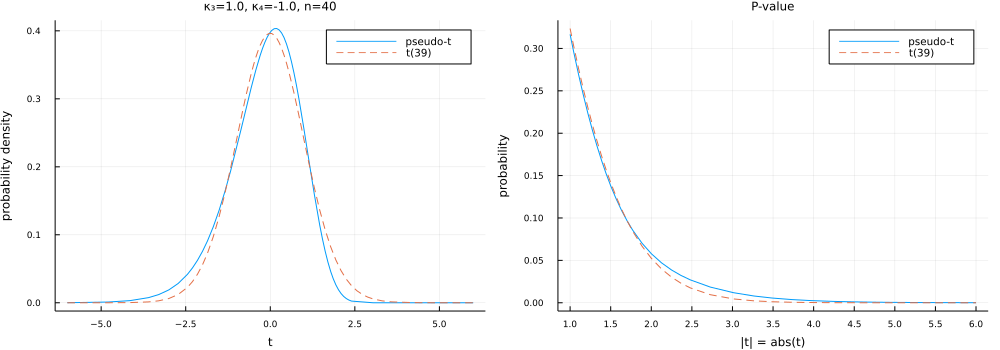

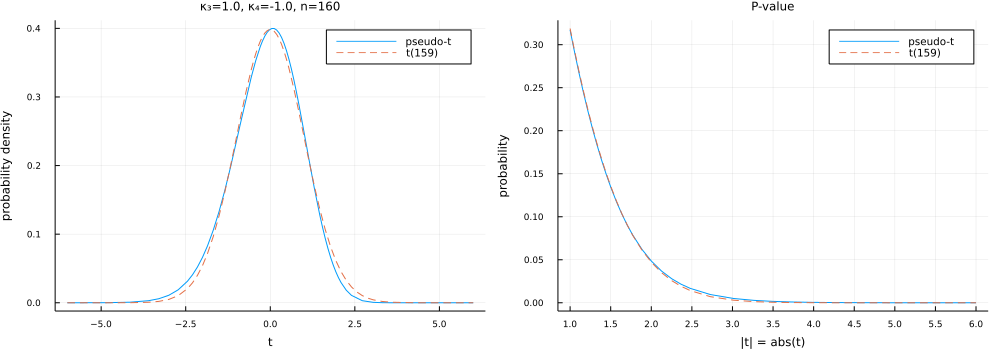

In [56]:
plotpseudot_iter(; κ₃ = 1.0, κ₄ = -1.0)

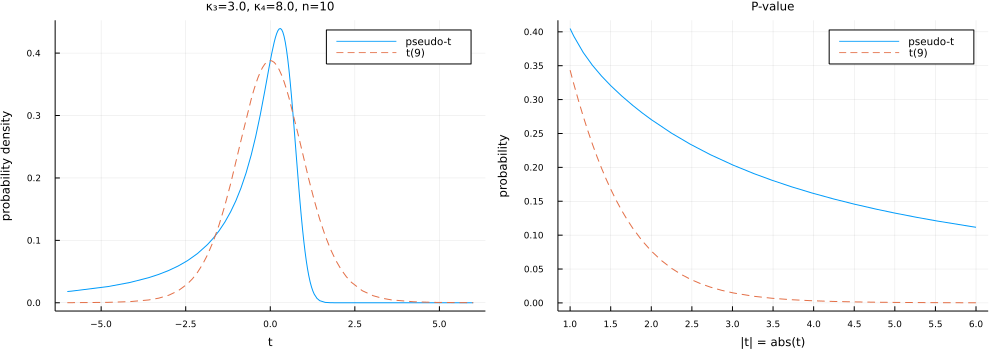

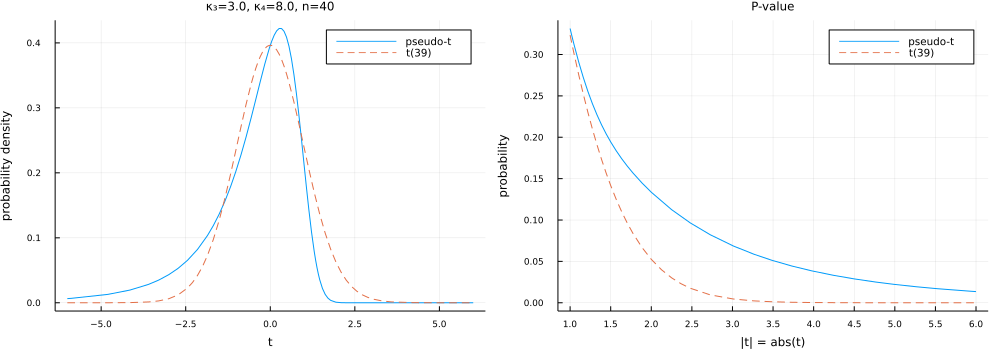

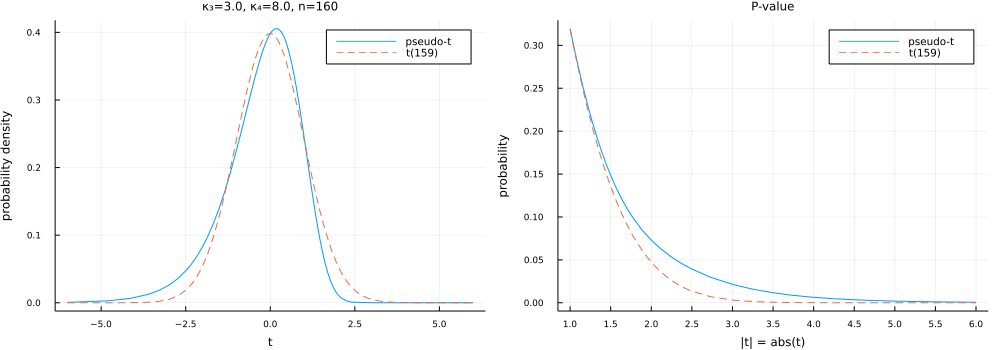

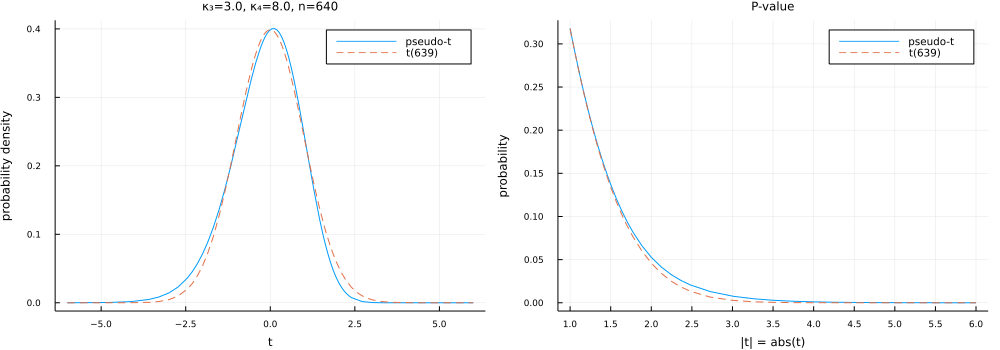

In [57]:
plotpseudot_iter(; κ₃ = 3.0, κ₄ = 8.0, n = (10, 40, 160, 640))

In [27]:
function _plotT(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, pdfTrange, pvalTrange; kwargs...)
    ikT = InterpKDE(kde(T))
    
    t = range(pdfTrange..., 200)
    P = plot(;)
    plot!(t, t -> pdf(ikT, t); label="T")
    plot!(t, t -> pdf(TDist(n-1), t); label="t($(n - 1))", ls=:dash)
    plot!(t, t -> pdfpseudot(κ₃, κ₄, n, t); label="pseudo-t", ls=:dashdot)
    title!(name(dist) * ", n=$n")
    plot!(; xlabel="t", ylabel="probability density")
    
    Q = plot()
    plot!(t -> ecdf(T)(-t) + 1 - ecdf(T)(t), pvalTrange...; label="T")
    plot!(t -> cdf(TDist(n-1), -t) + ccdf(TDist(n-1), t), pvalTrange...; label="t($(n - 1))", ls=:dash)
    plot!(t -> cdfpseudot(κ₃, κ₄, n, -t) + 1 - cdfpseudot(κ₃, κ₄, n, t), pvalTrange...; label="pseudo-t", ls=:dashdot)
    plot!(; xtick=-10:0.5:10, ytick=0:0.05:1)
    title!("P-value     (κ₃=$(rd(κ₃)), κ₄=$(rd(κ₄)))")
    plot!(; xlabel="|t| = abs(t)", ylabel="probability")
    
    P, Q
end

function plotT(;
        dist = Gamma(2, 1),
        n = 160,
        L = 10^6,
        pdfTrange = (-6, 6),
        pvalTrange = (1, 6),
        kwargs...
    )
    (; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄) = calcZR2(; dist, n, L)
    P, Q = _plotT(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, pdfTrange, pvalTrange; kwargs...)
    plot(P, Q; size=(1000, 350), bottommargin=3Plots.mm, leftmargin=3Plots.mm)
    plot!(; kwargs...)
end

function plotTiter(;
        dist = Gamma(2, 1),
        n = (10, 40, 160),
        L = 10^6,
        pdfTrange = (-6, 6),
        pvalTrange = (1, 6),
        kwargs...
    )
    for n in n
        plotT(; dist, n, L, pdfTrange, pvalTrange, kwargs...) |> display
    end
end

plotTiter (generic function with 1 method)

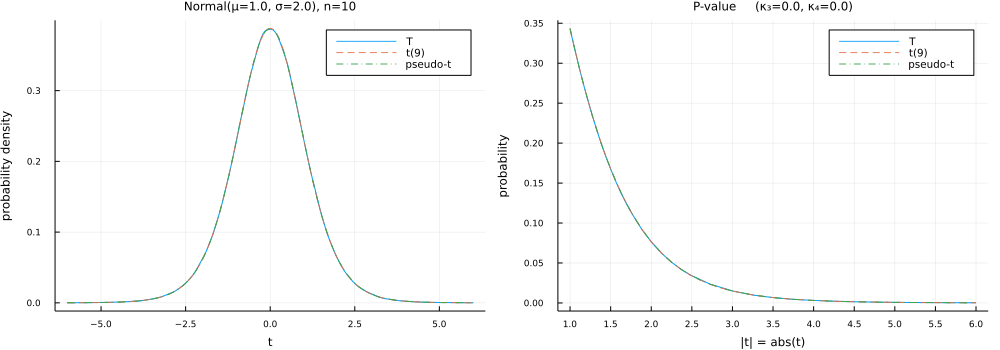

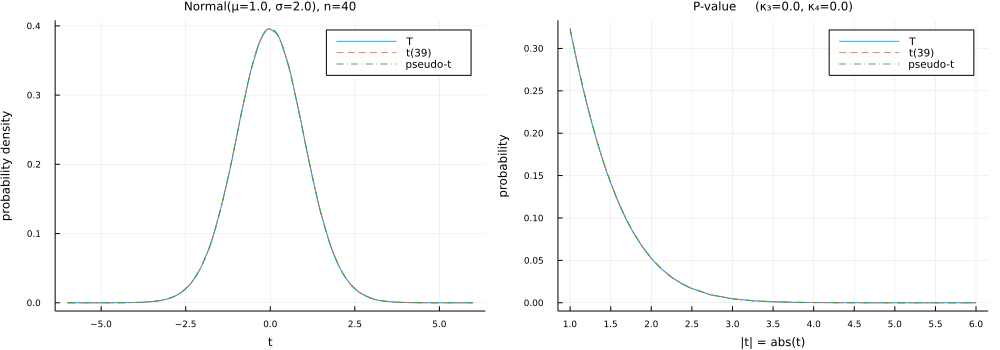

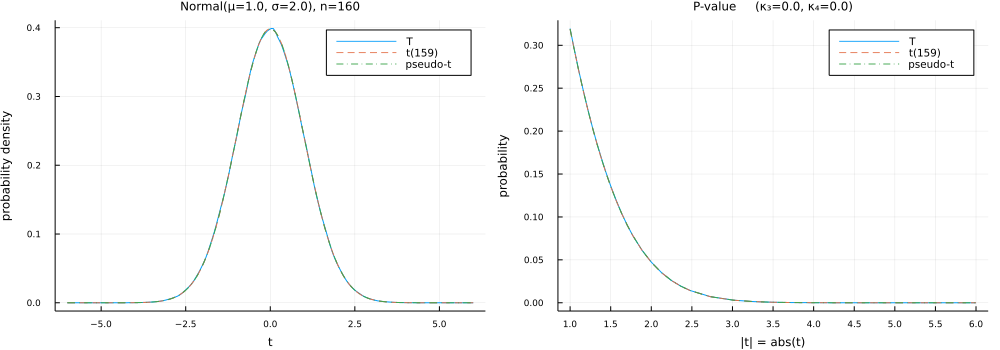

In [28]:
plotTiter(; dist = Normal(1, 2))

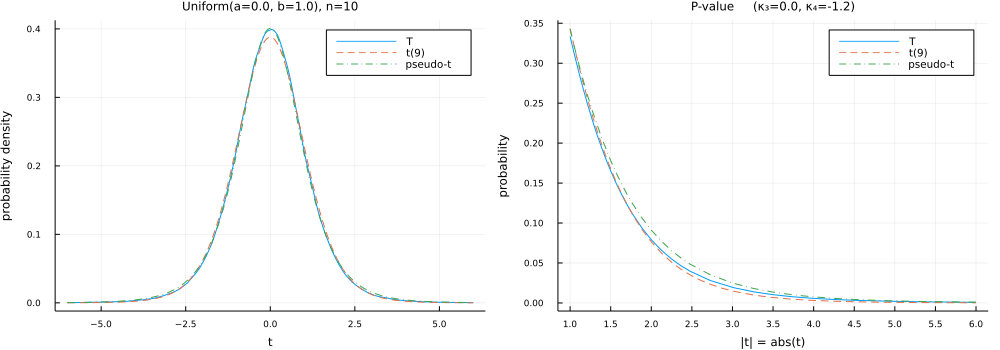

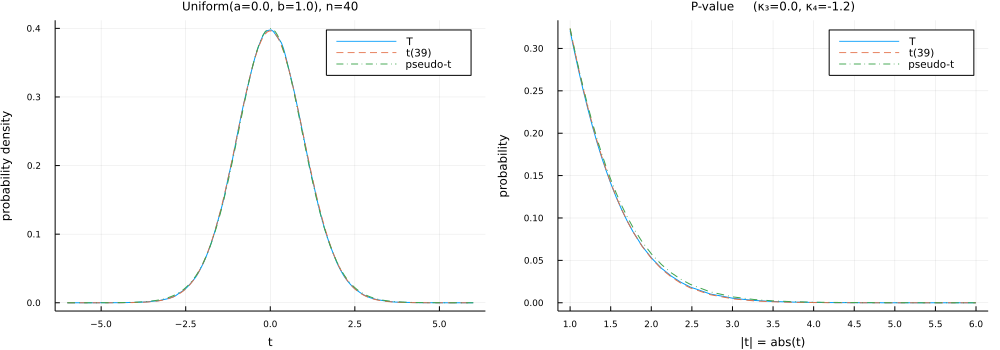

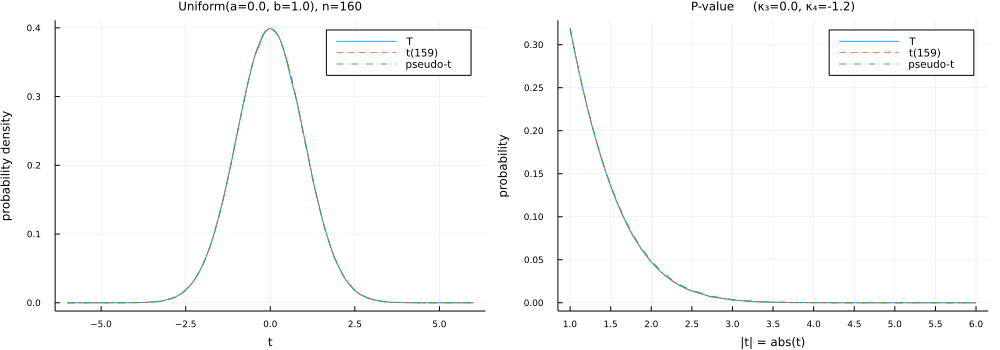

In [29]:
plotTiter(; dist = Uniform())

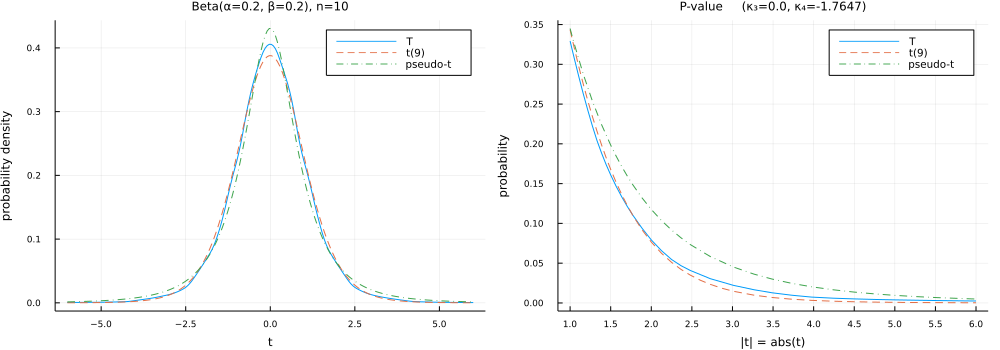

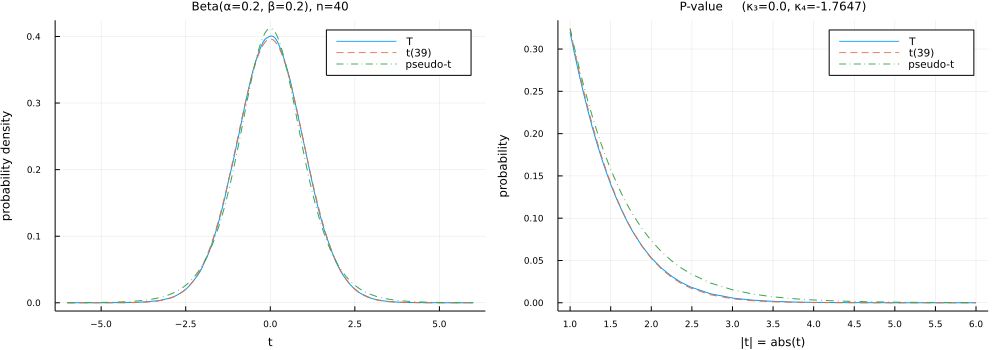

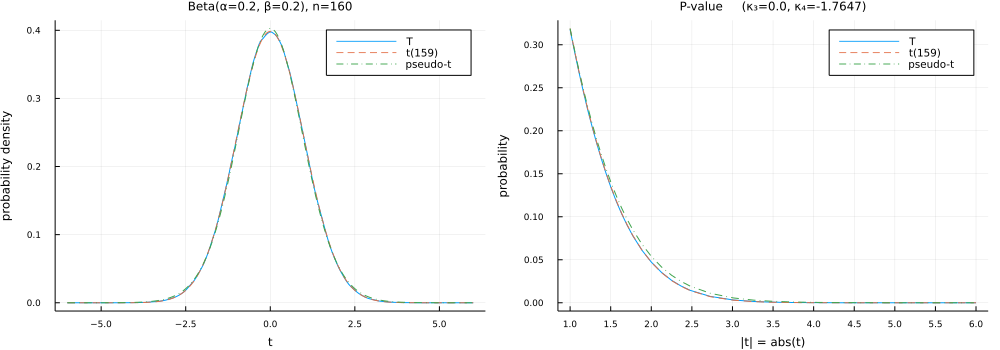

In [30]:
plotTiter(; dist = Beta(0.2, 0.2))

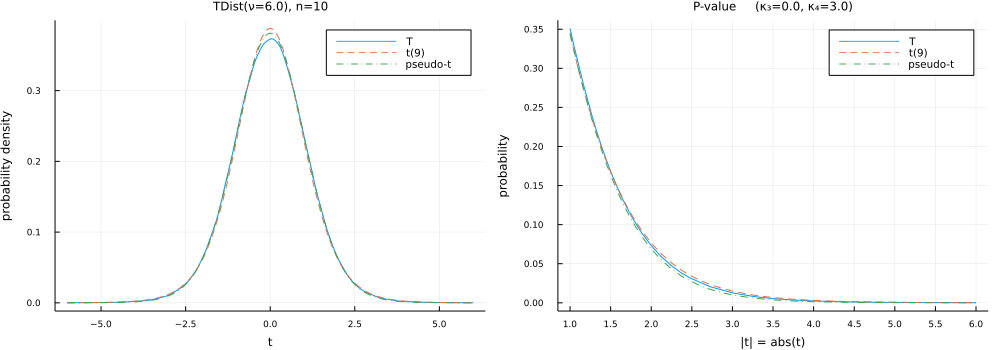

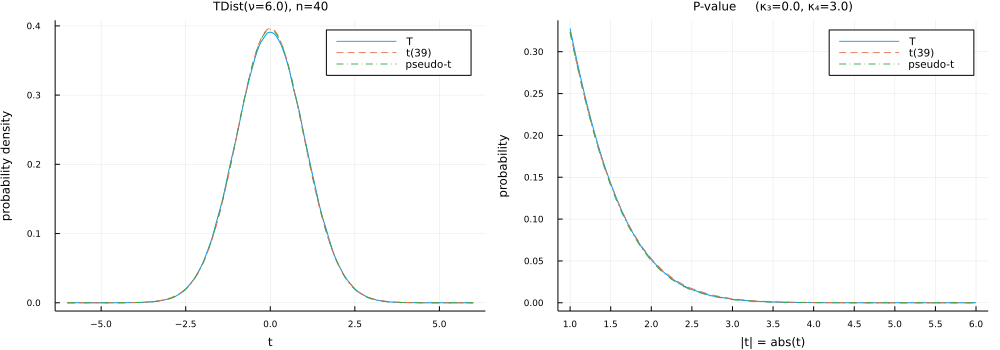

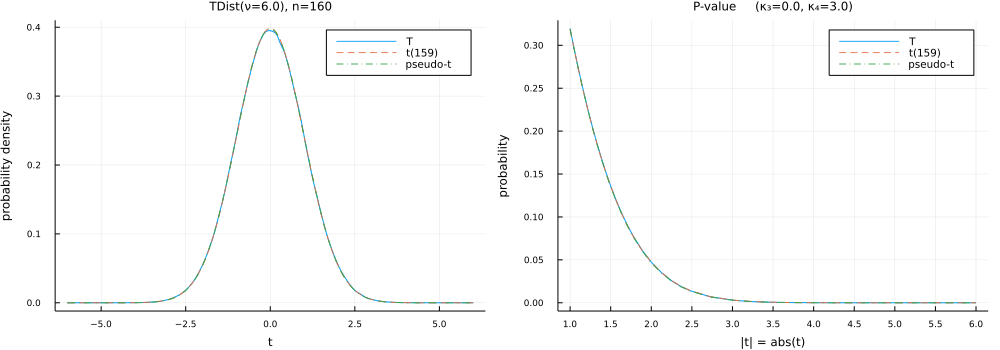

In [31]:
plotTiter(; dist = TDist(6))

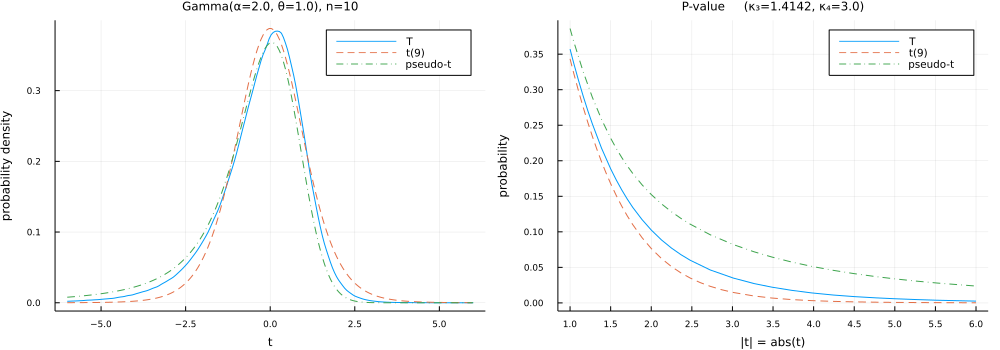

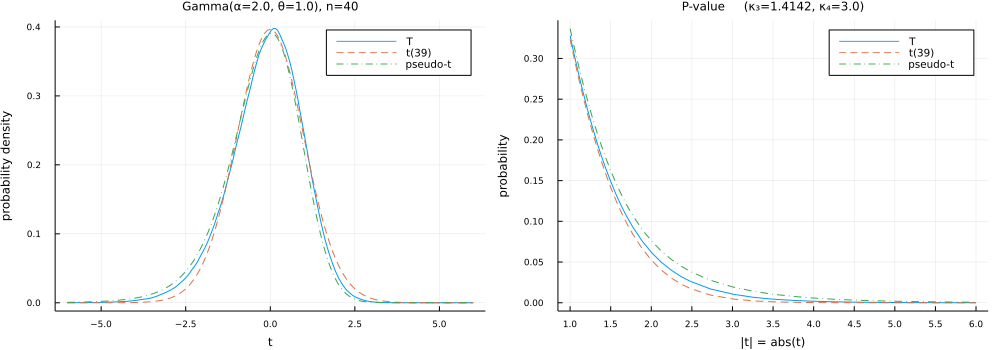

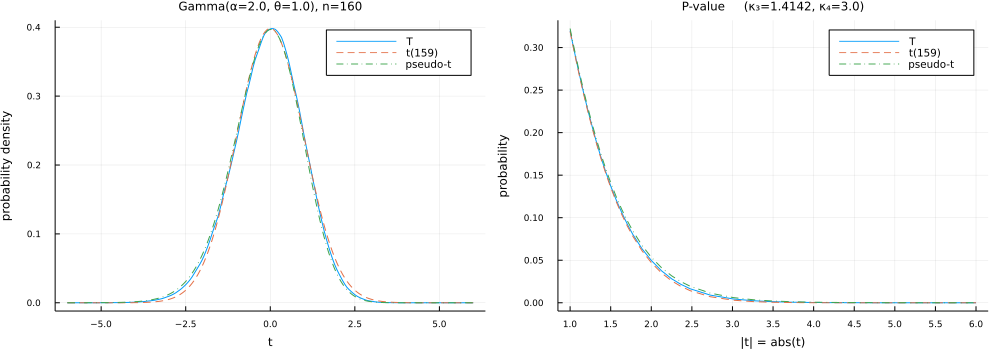

In [32]:
plotTiter(; dist = Gamma(2, 1))

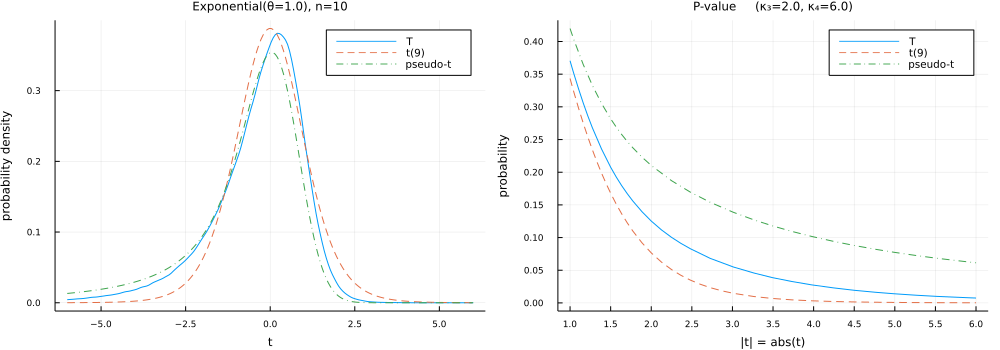

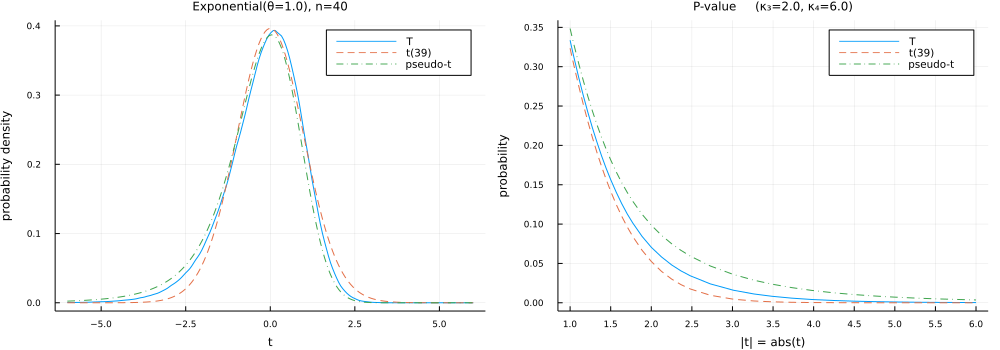

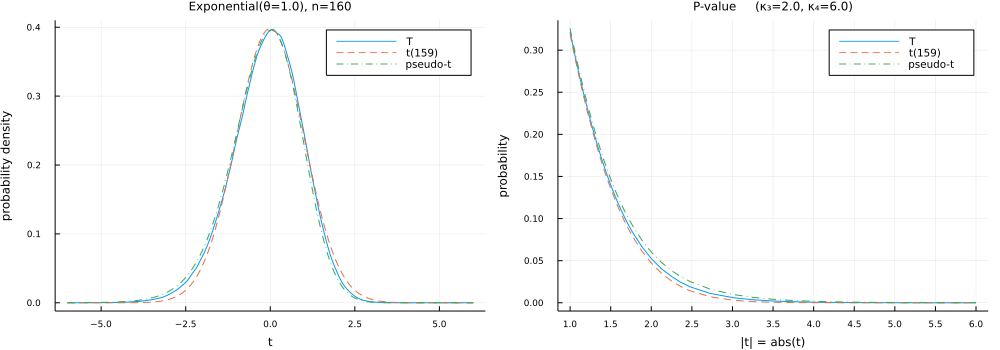

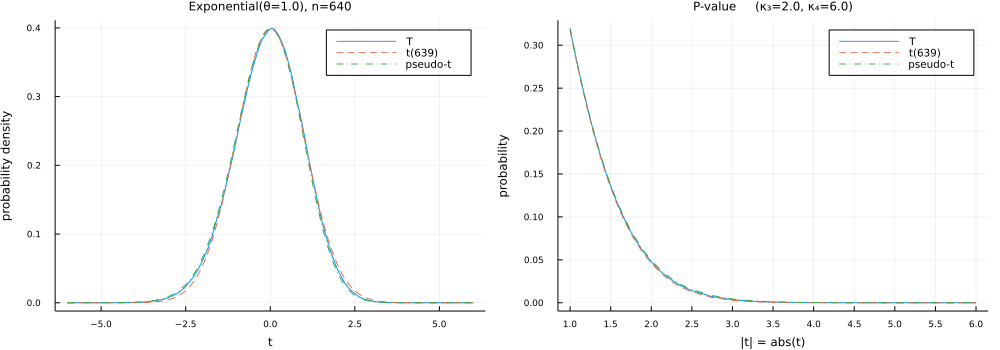

In [33]:
plotTiter(; dist = Exponential(), n = (10, 40, 160, 640))

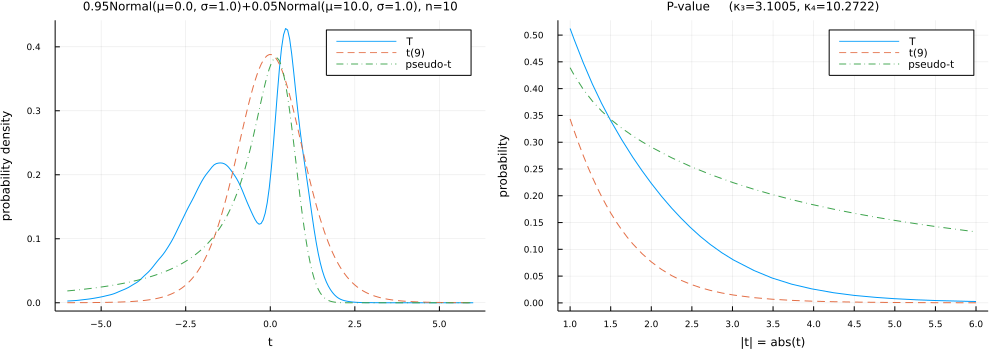

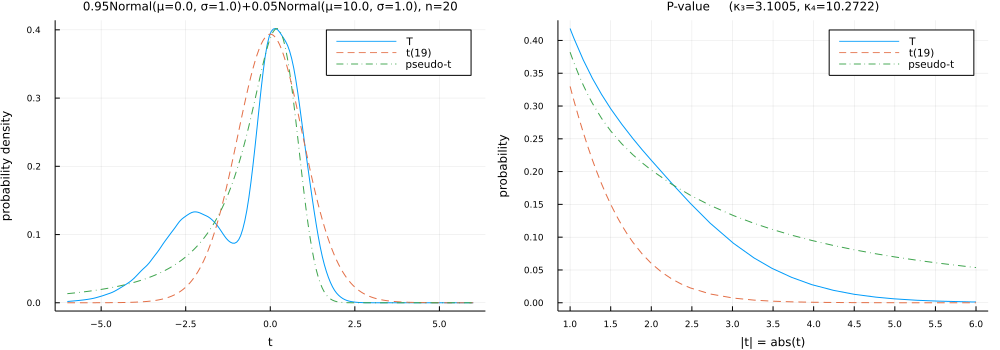

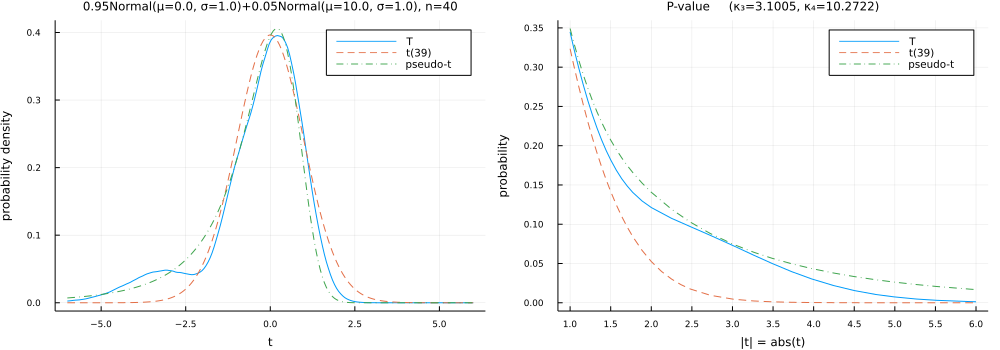

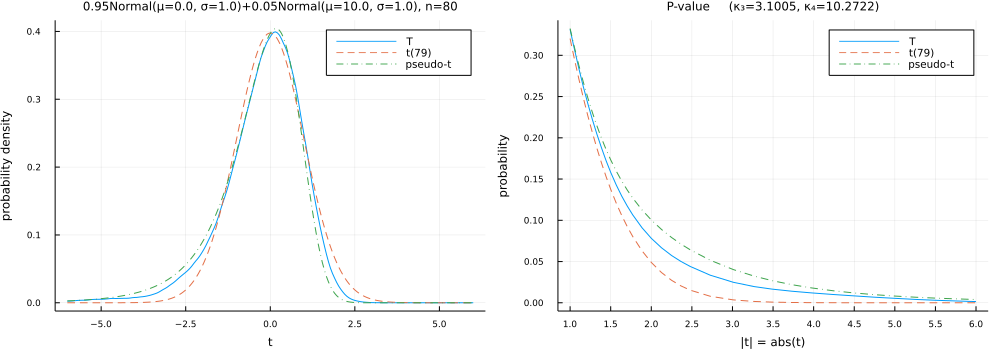

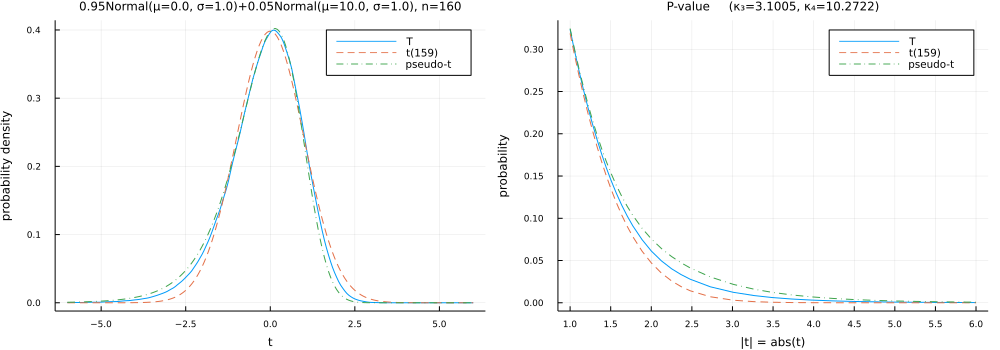

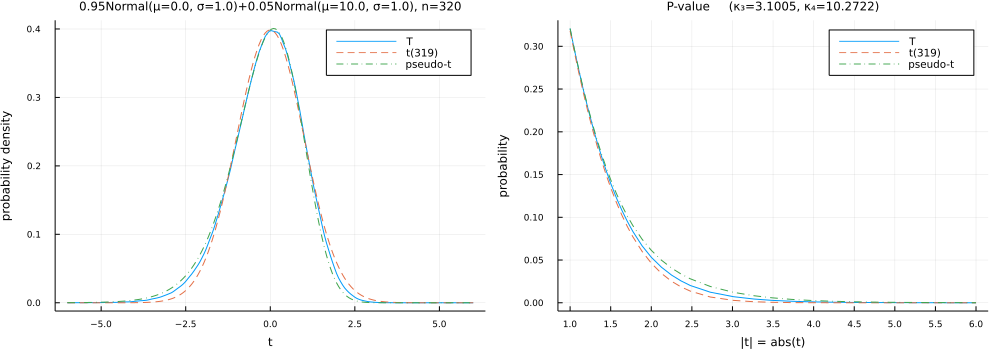

In [34]:
plotTiter(; dist = MixtureModel([Normal(), Normal(10, 1)], [0.95, 0.05]), n = (10, 20, 40, 80, 160, 320))

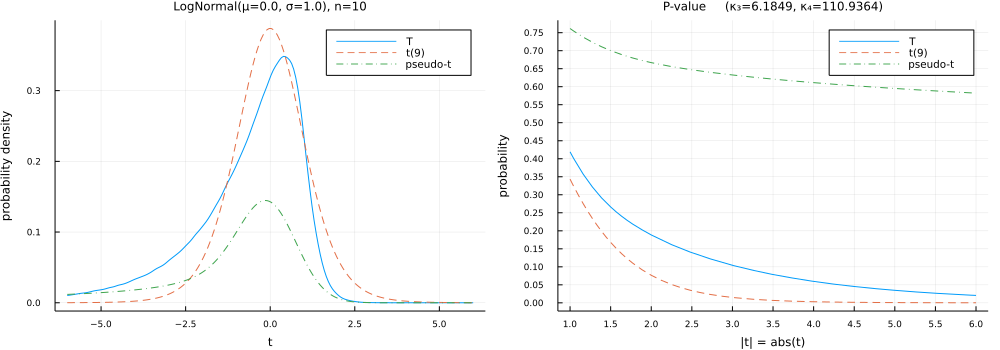

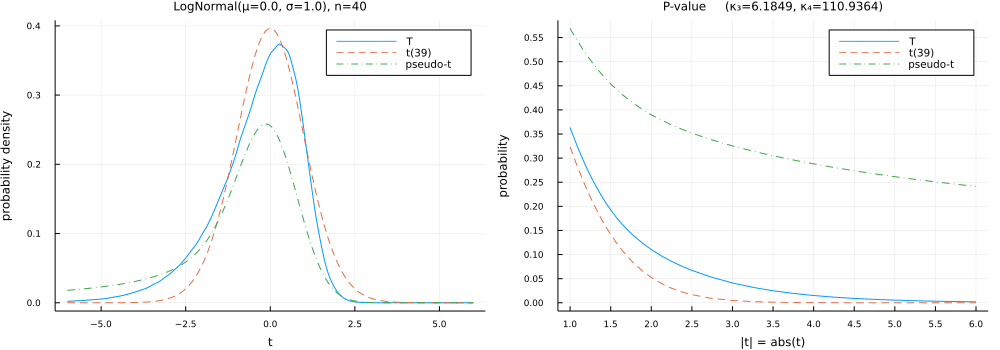

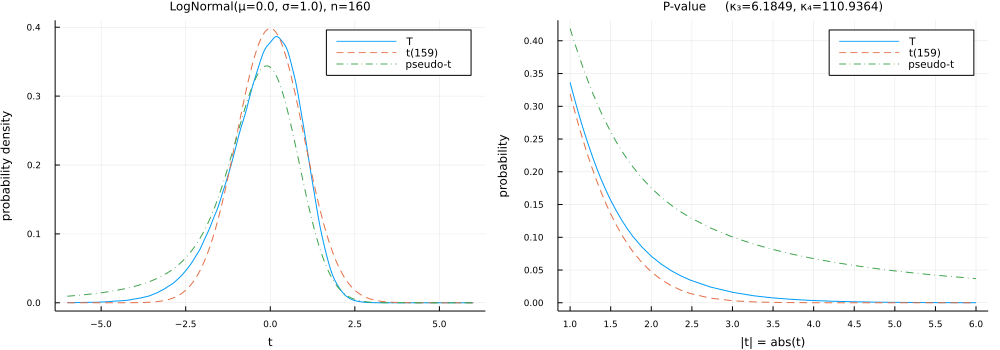

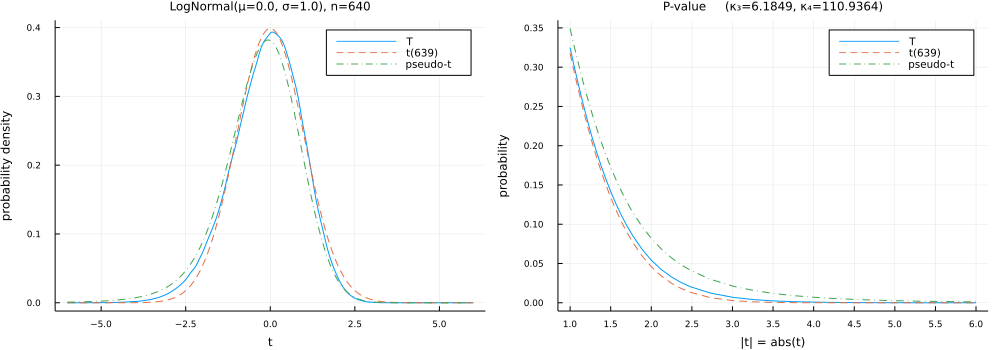

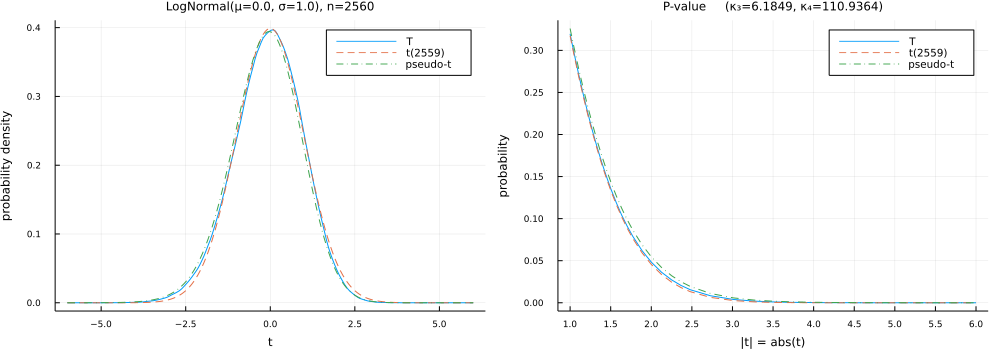

In [35]:
plotTiter(; dist = LogNormal(), n = (10, 40, 160, 640, 2560))

## まとめてプロット

In [52]:
function plotall(;
        dist = Gamma(2, 1),
        n = 160,
        L = 10^6,
        Zspan = (0.001, 0.999),
        R2span = (0.001, 0.999),
        pdfTrange = (-6, 6),
        pvalTrange = (1, 6),
        legend = false,
        scattermax = 10^5,
        kwargs...
    )
    (; dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄) = calcZR2(; dist, n, L)
    A, B = _plotZ(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, Zspan, R2span, legend, scattermax; kwargs...)
    C, D = _plotT(dist, n, Z, R², Z², T, T², μ, σ, κ₃, κ₄, pdfTrange, pvalTrange; kwargs...)
    plot(A, B, C, D; size=(1000, 700), layout=(2, 2), bottommargin=3Plots.mm, leftmargin=3Plots.mm)
    plot!(; kwargs...)
end

function plotalliter(;
        dist = Gamma(2, 1),
        n = (10, 20, 40, 80, 160),
        L = 10^6,
        Zspan = (0.001, 0.999),
        R2span = (0.002, 0.998),
        pdfTrange = (-6, 6),
        pvalTrange = (1, 6),
        legend = false,
        scattermax = 10^5,
        distxlim = nothing, 
        distylim = nothing, 
        kwargs...
    )
    println("skewness = ", myskewness(dist))
    println("kurtosis = ", mykurtosis(dist))
    flush(stdout)
    
    if isnothing(distxlim)
        plot(dist; label="", title=name(dist), ylim=distylim)
    else
        plot(x -> pdf(dist, x), distxlim...; label="", title=name(dist), xlim=distxlim, ylim=distylim)
    end
    plot!(; size=(500, 350)) |> display

    for n in n
        plotall(; dist, n, L, Zspan, R2span, pdfTrange, pvalTrange, legend, scattermax, kwargs...) |> display
    end
end

plotalliter (generic function with 1 method)

skewness = 0.0
kurtosis = 0.0


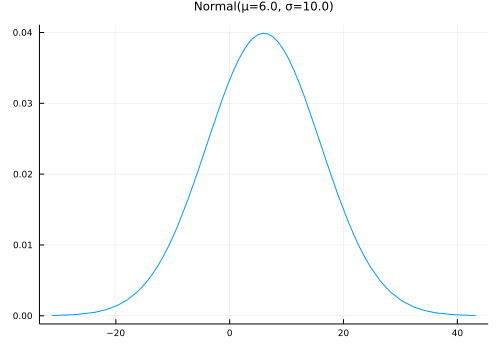

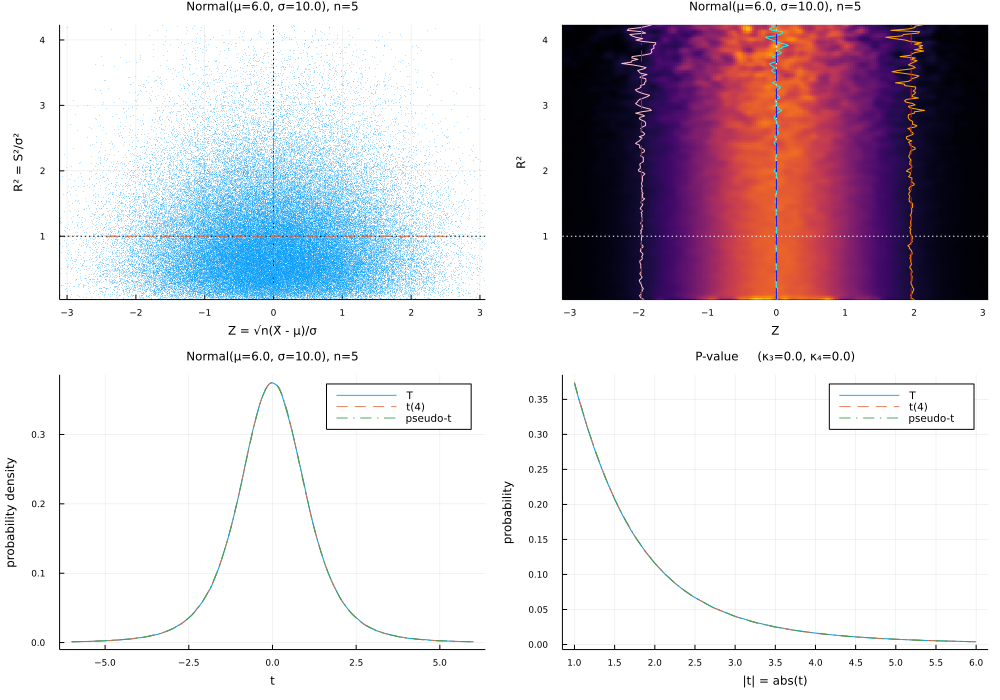

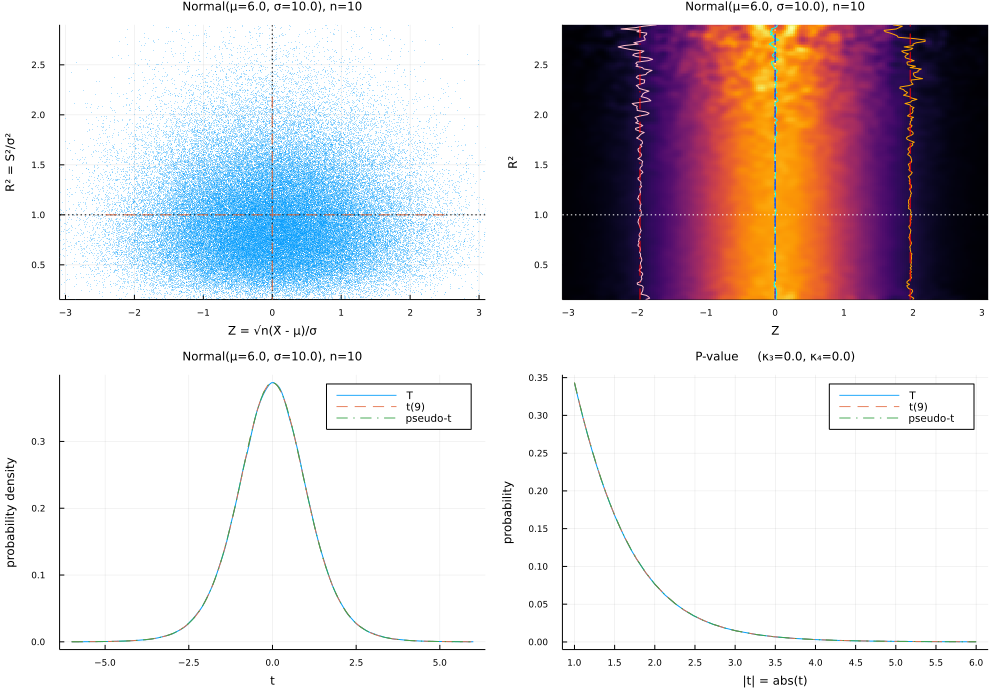

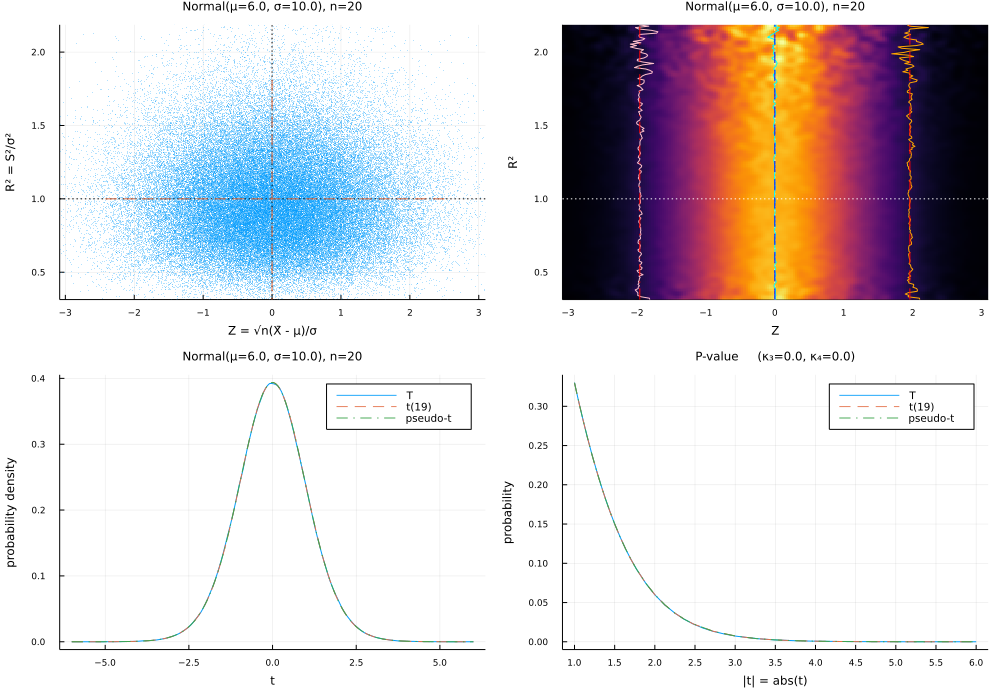

In [124]:
plotalliter(dist = Normal(6, 10), n = (5, 10, 20))

skewness = 0.0
kurtosis = -1.2


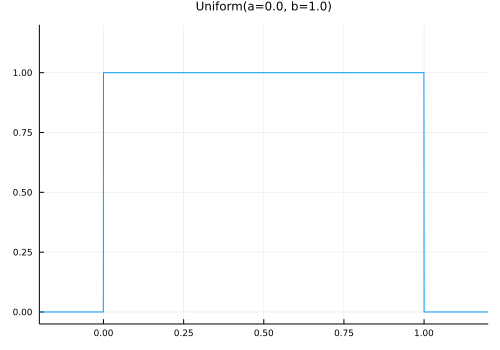

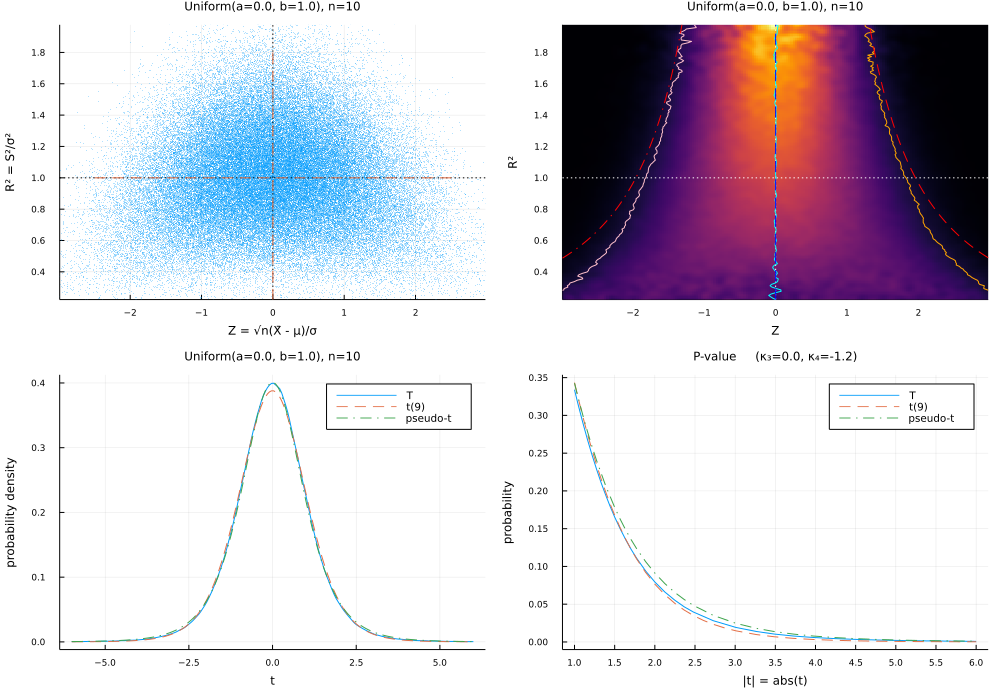

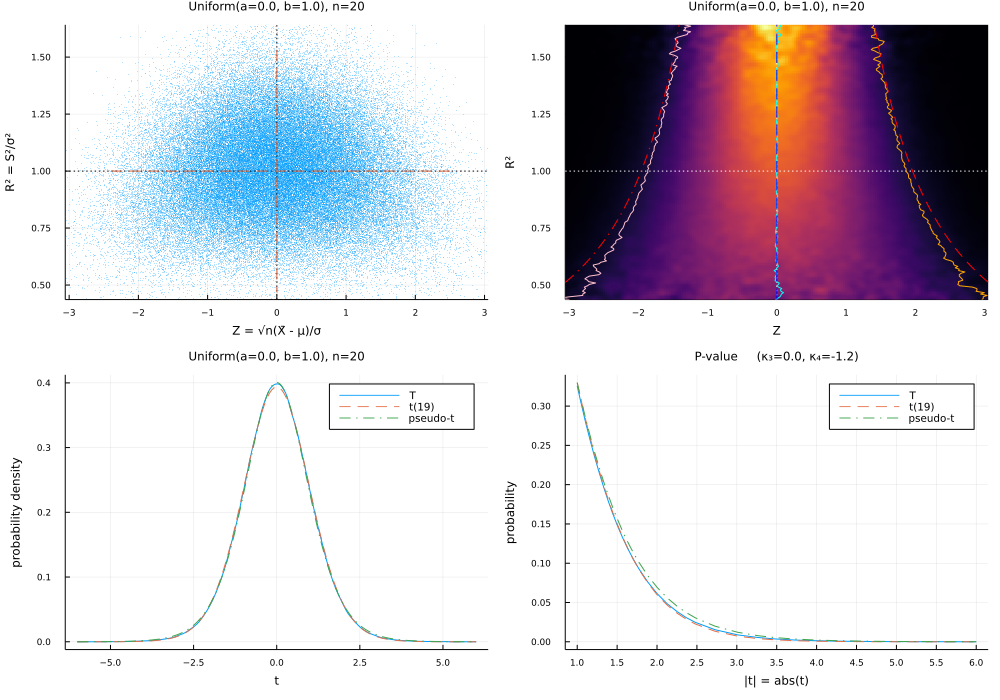

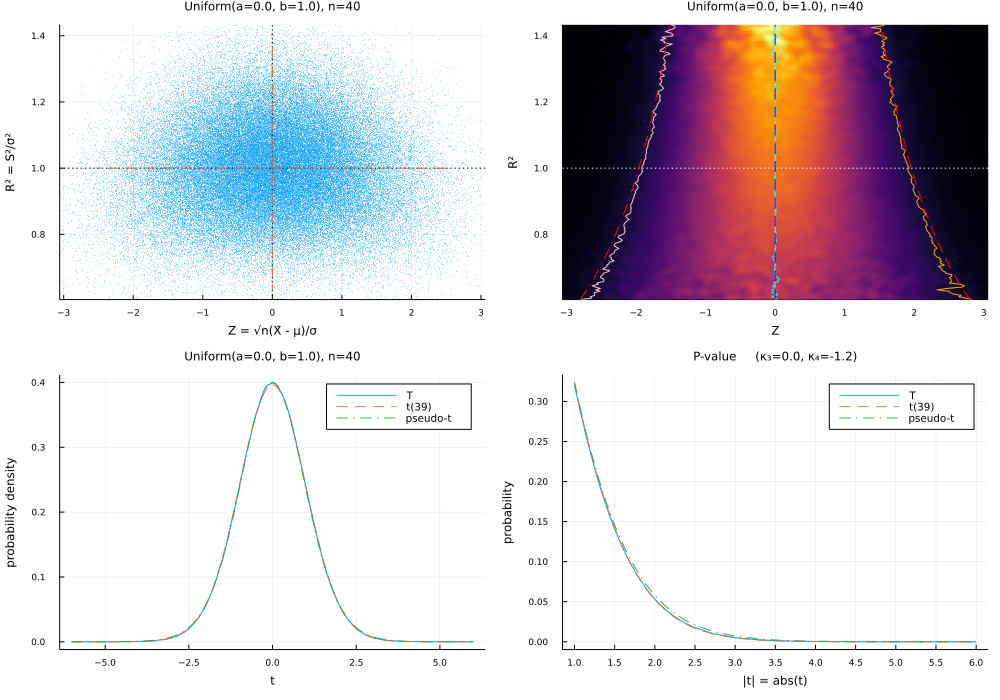

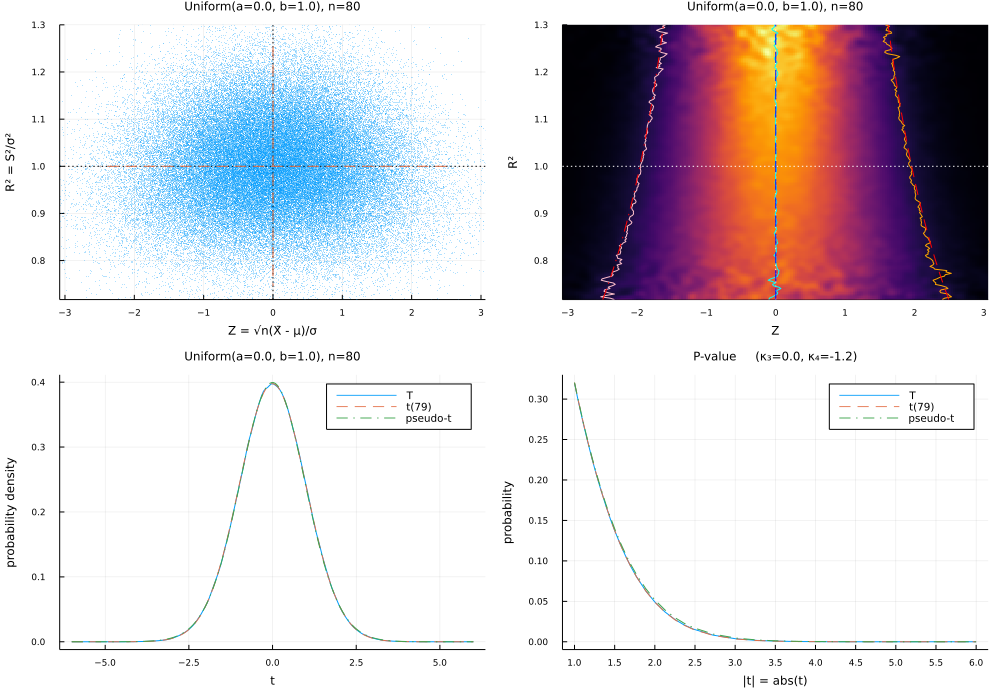

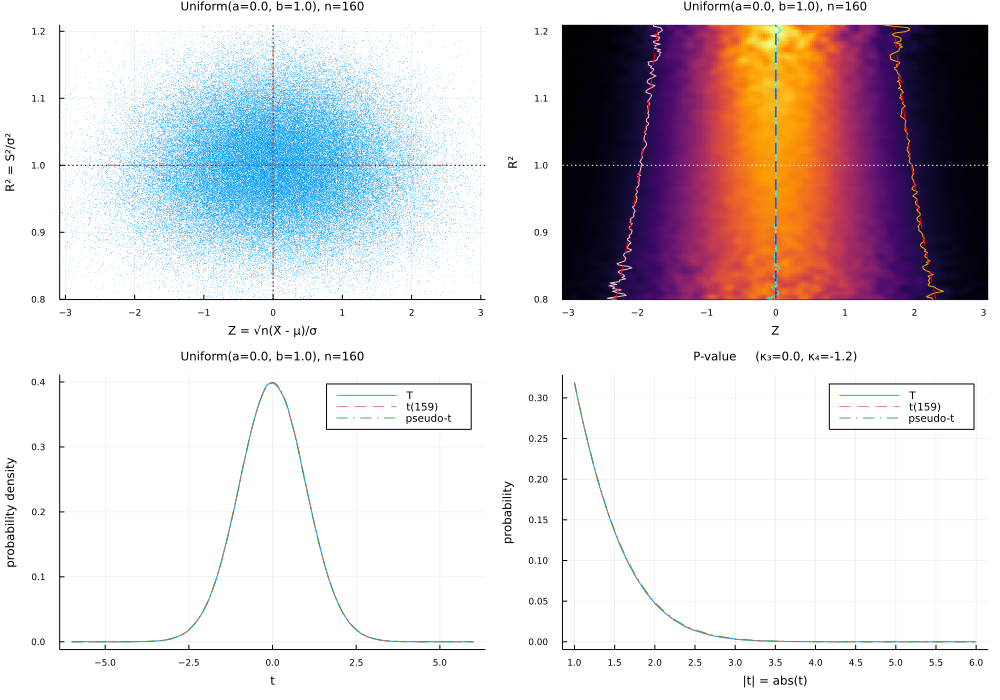

In [125]:
plotalliter(dist = Uniform(), distxlim=(-0.2, 1.2), distylim=(-0.05, 1.2))

skewness = 0.0
kurtosis = -1.7647058823529413


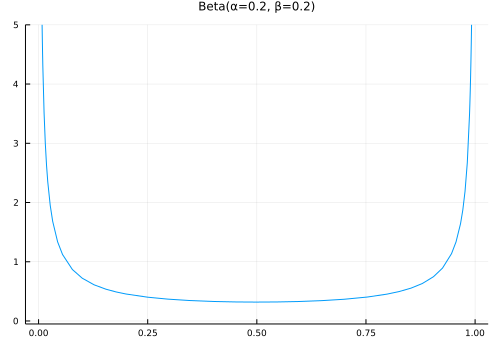

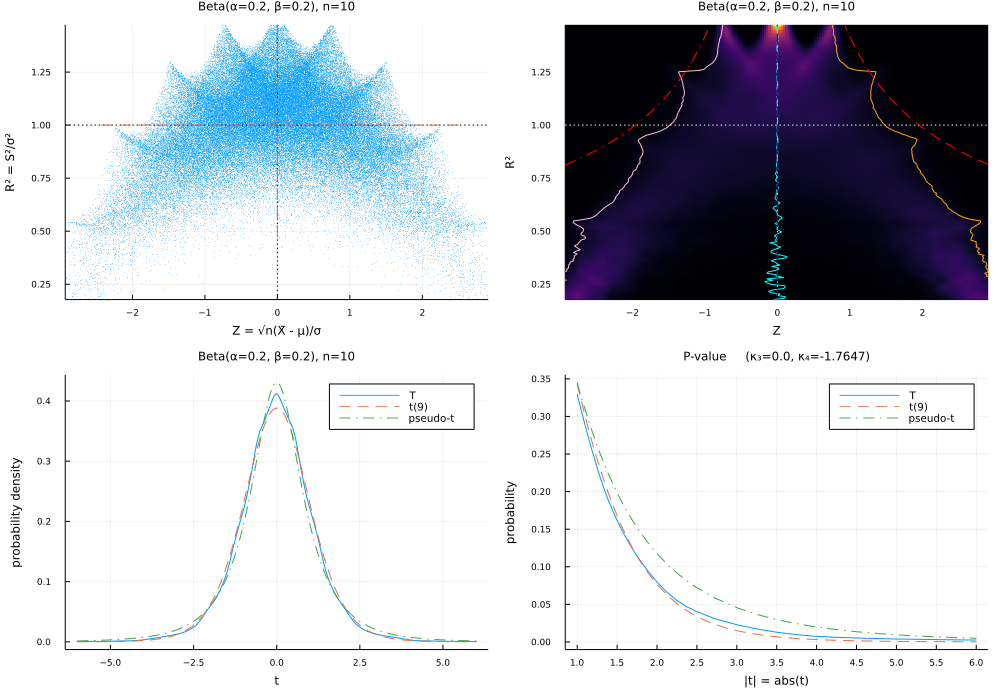

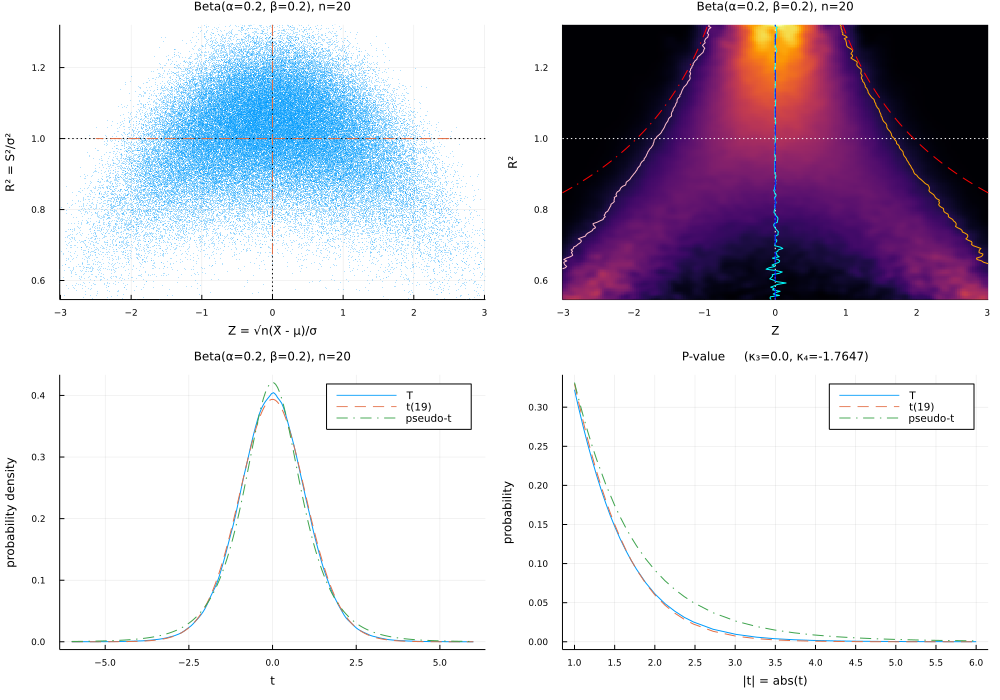

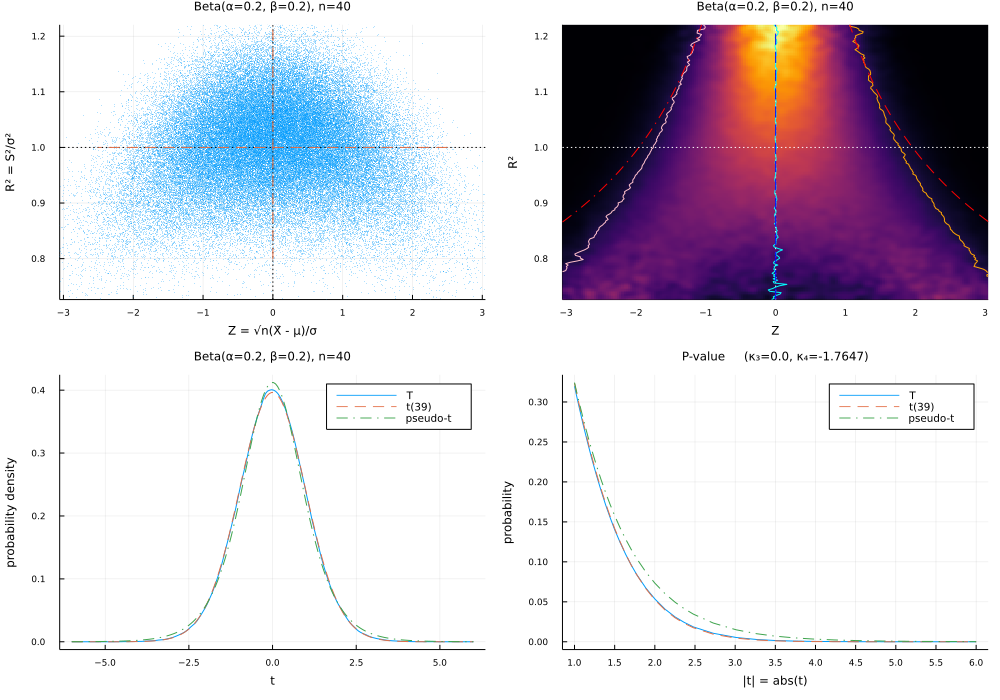

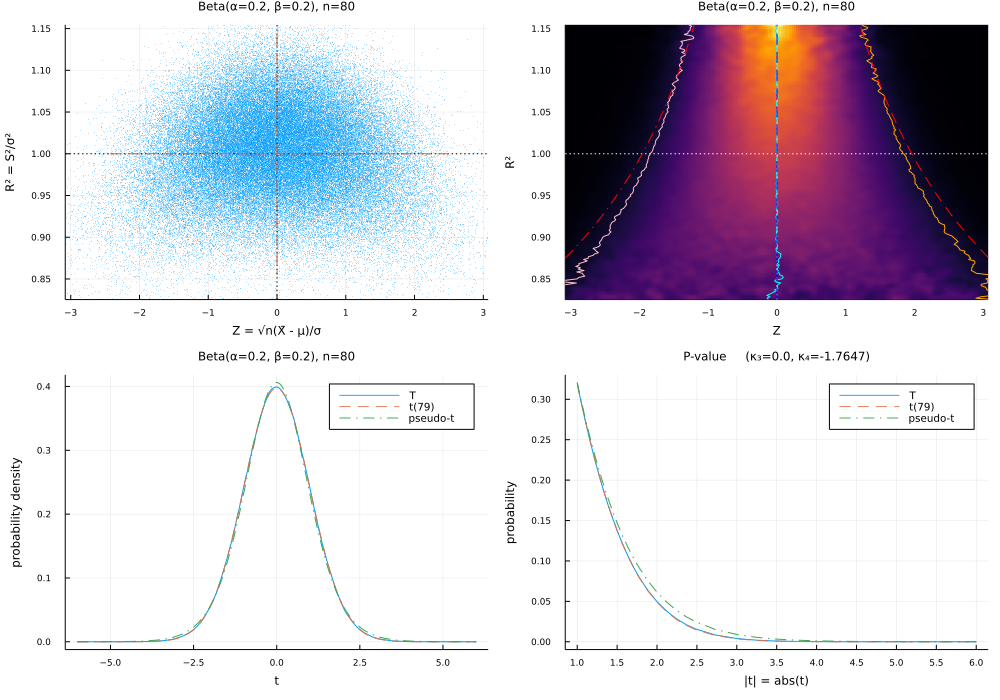

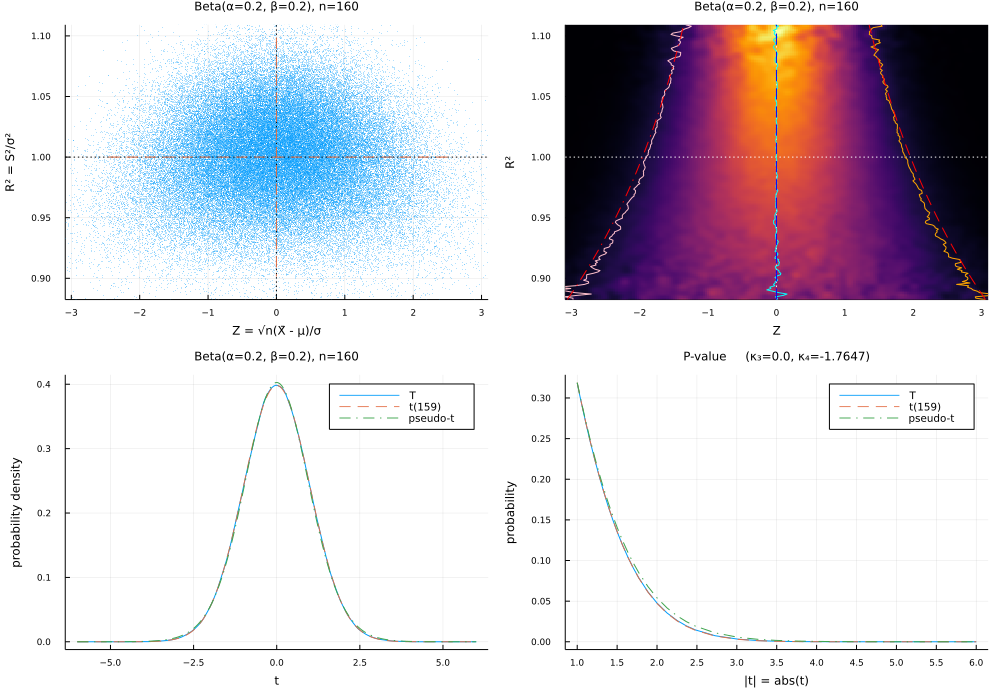

In [126]:
plotalliter(dist = Beta(0.2, 0.2), distylim=(-0.05, 5))

skewness = 0.0
kurtosis = 3.0


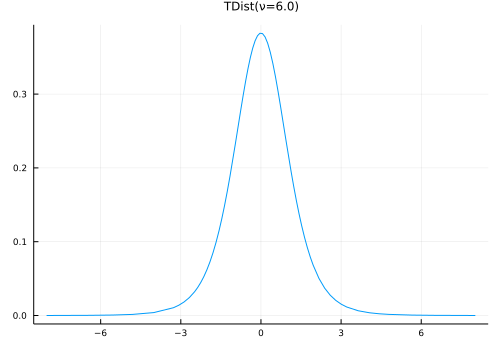

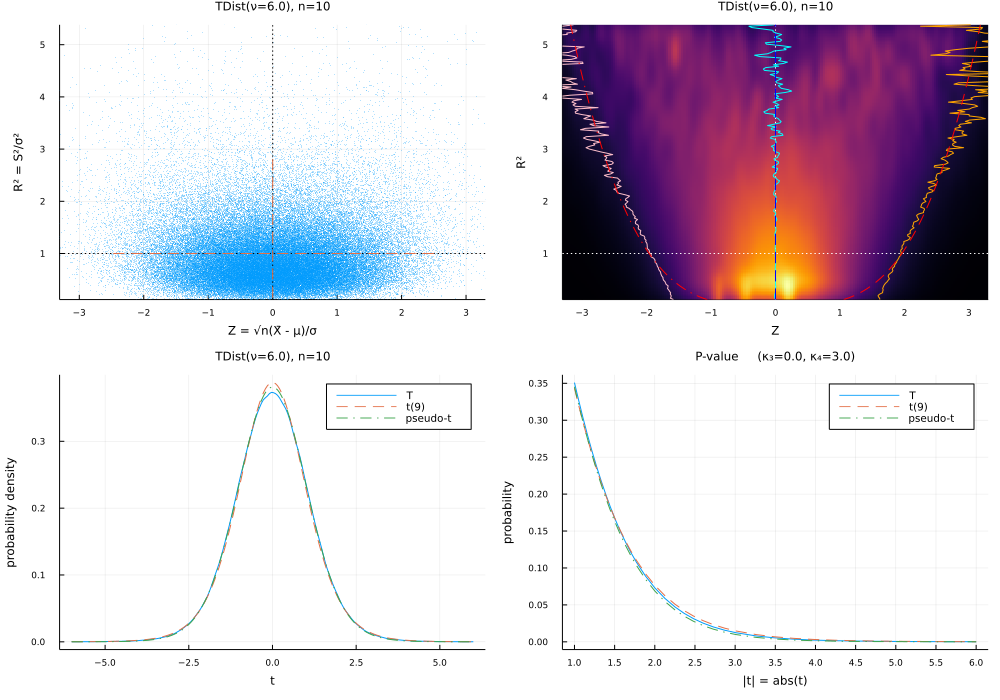

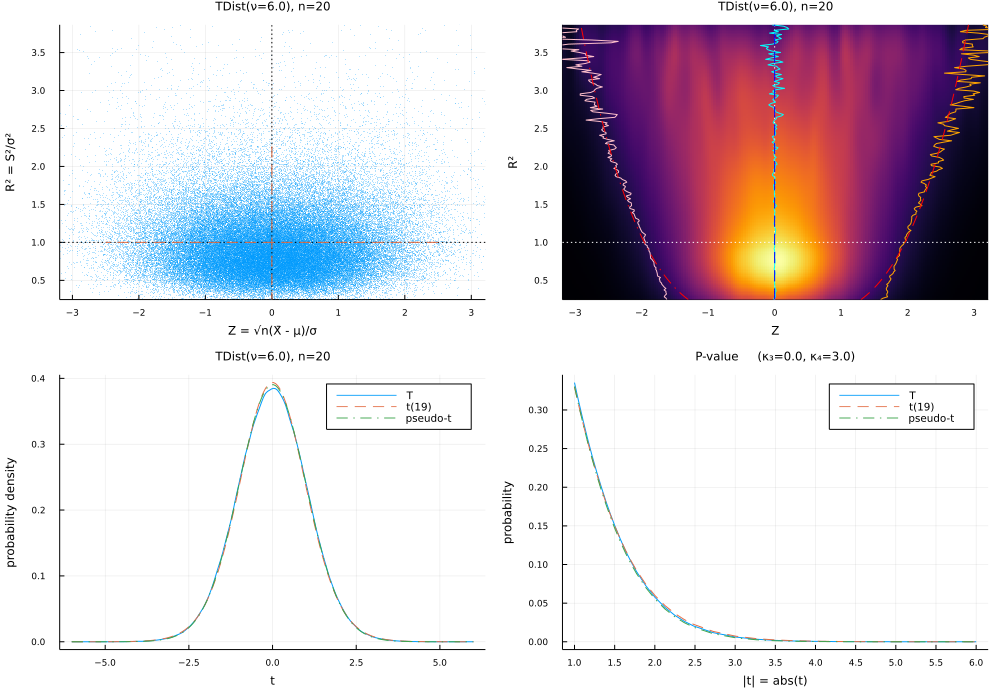

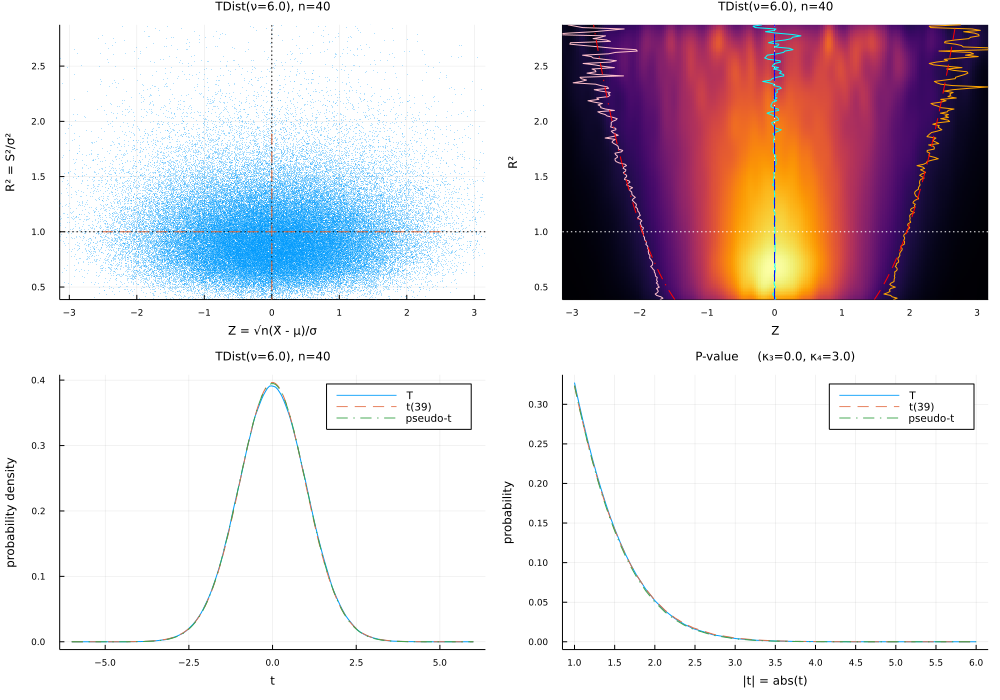

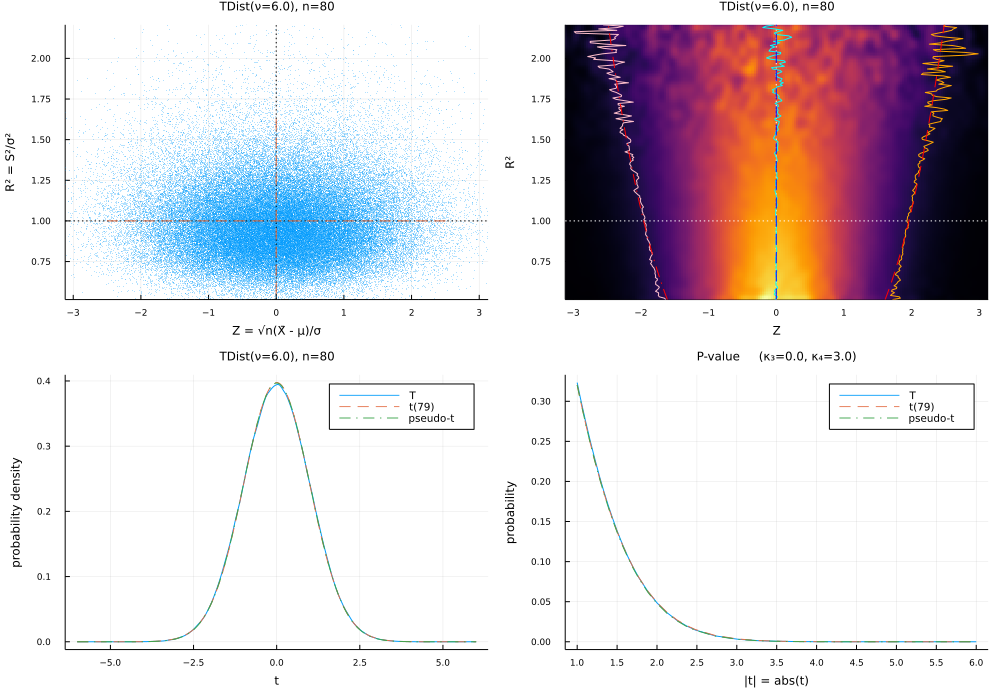

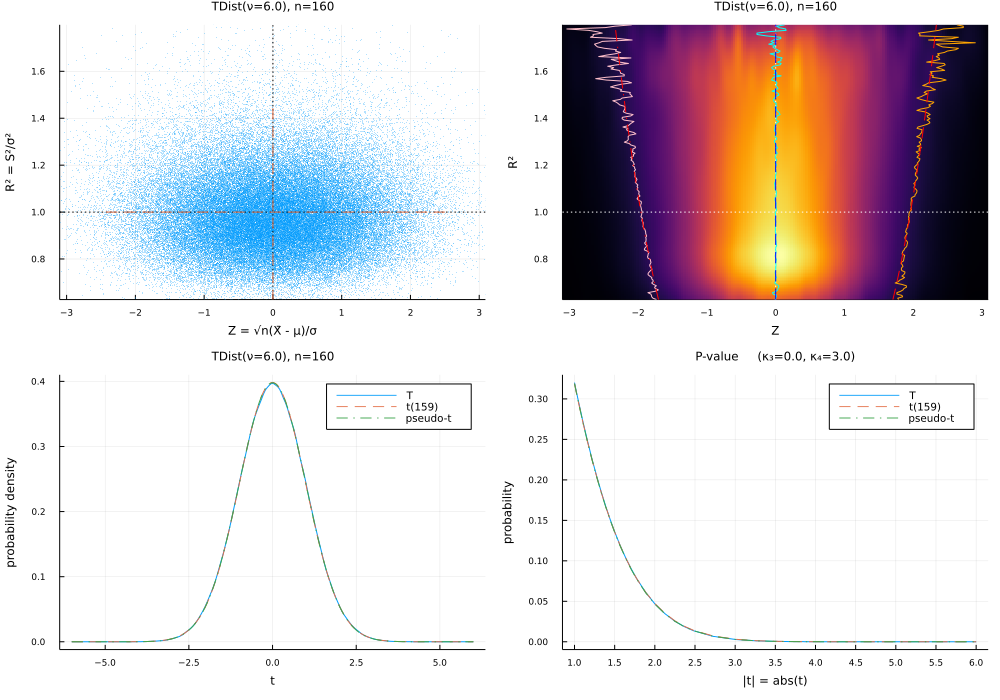

In [127]:
plotalliter(dist = TDist(6))

skewness = 1.414213562373095
kurtosis = 3.0


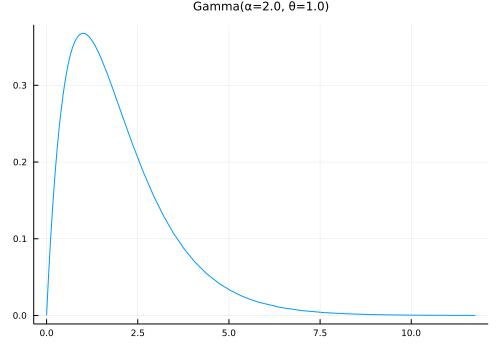

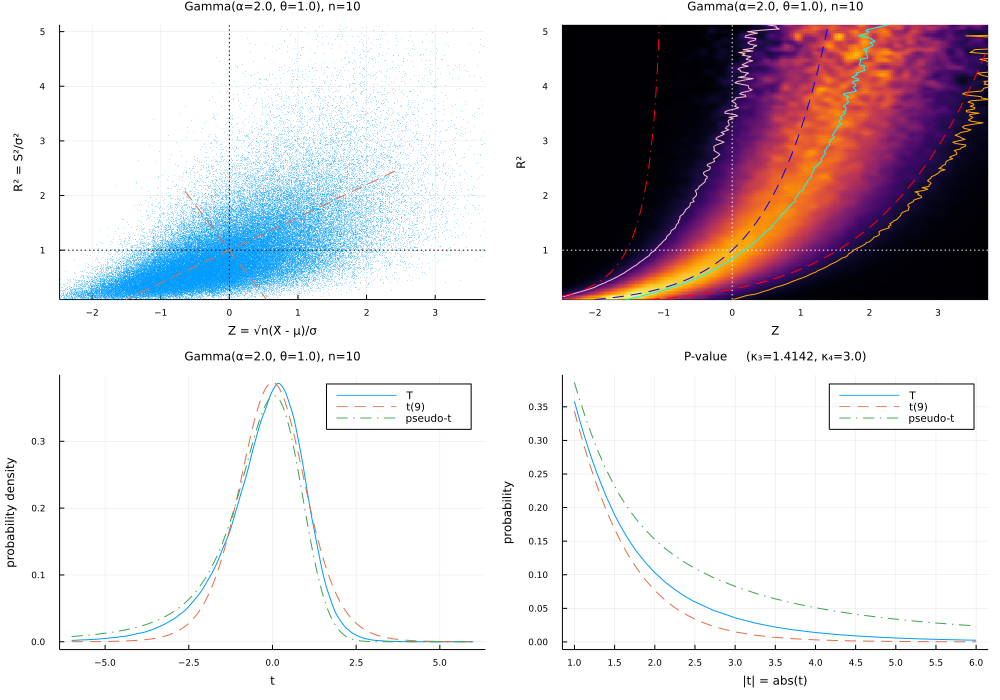

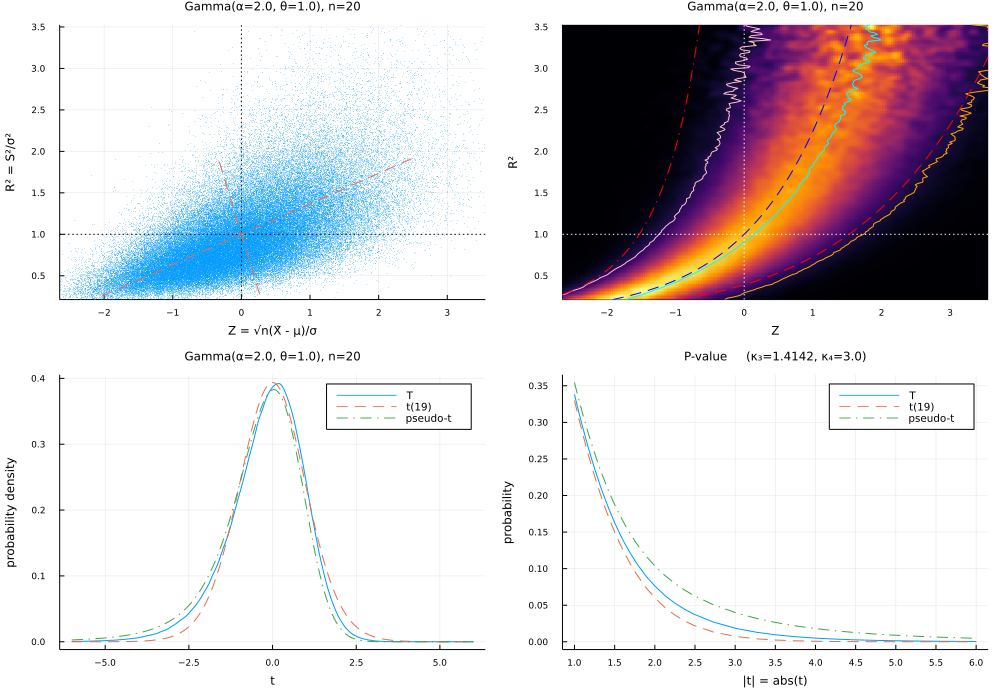

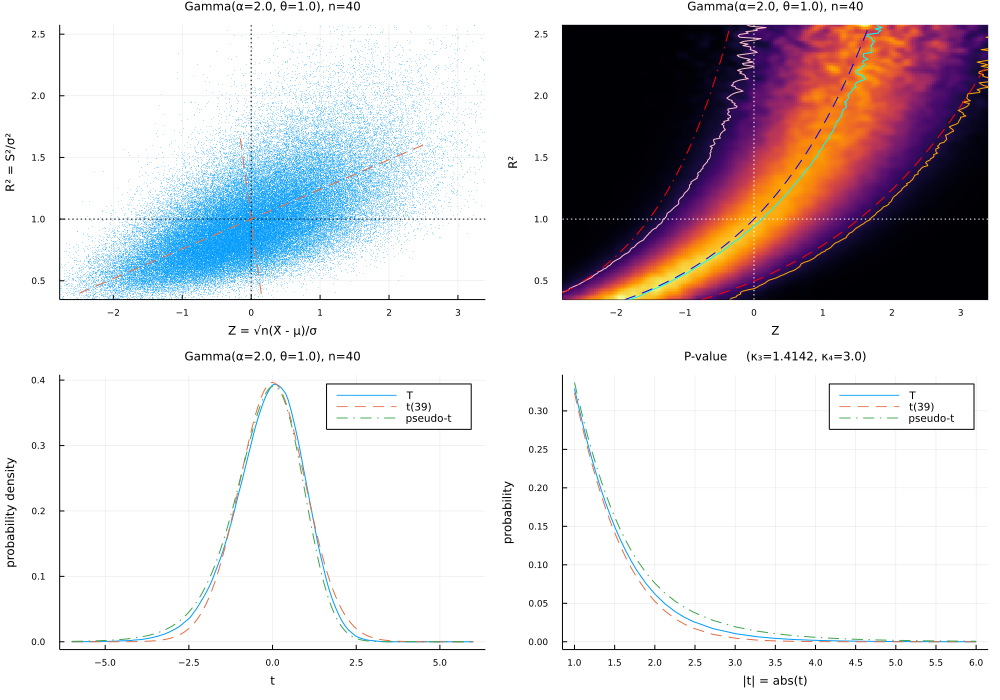

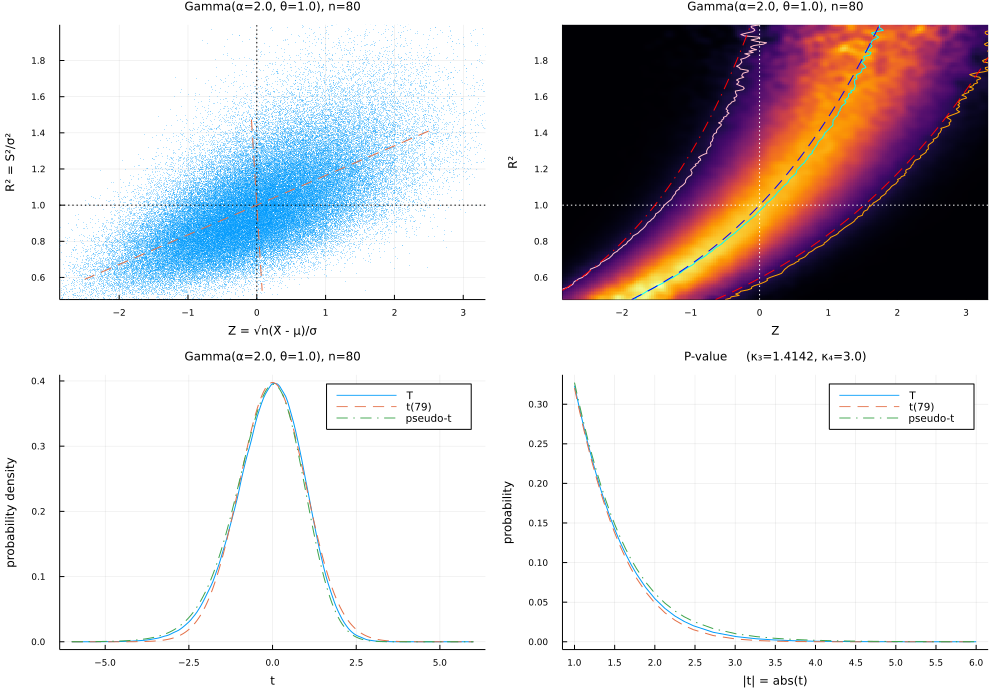

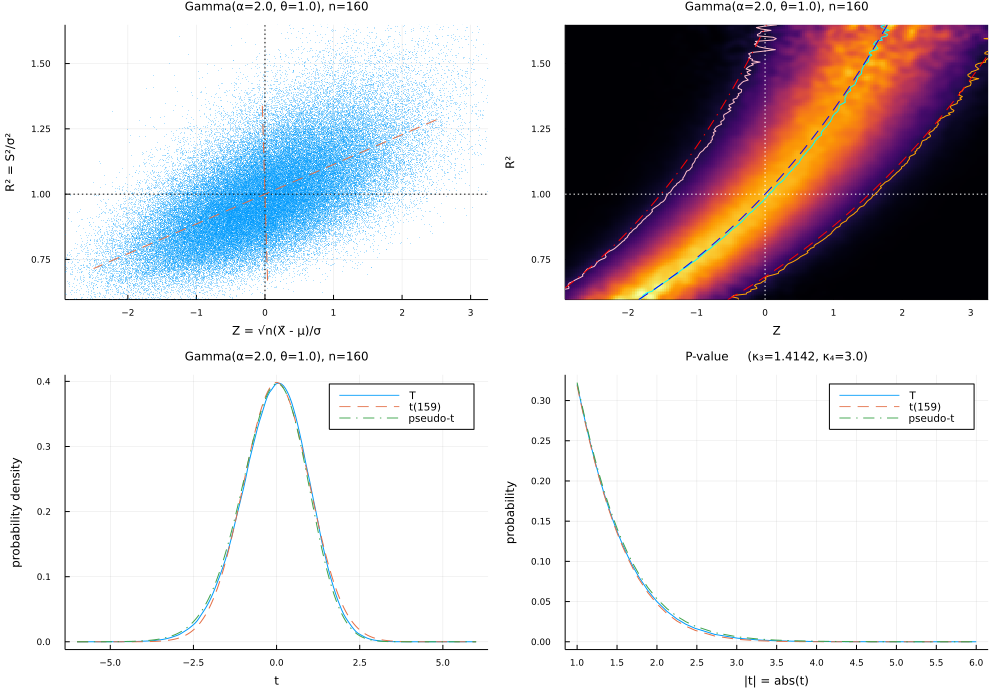

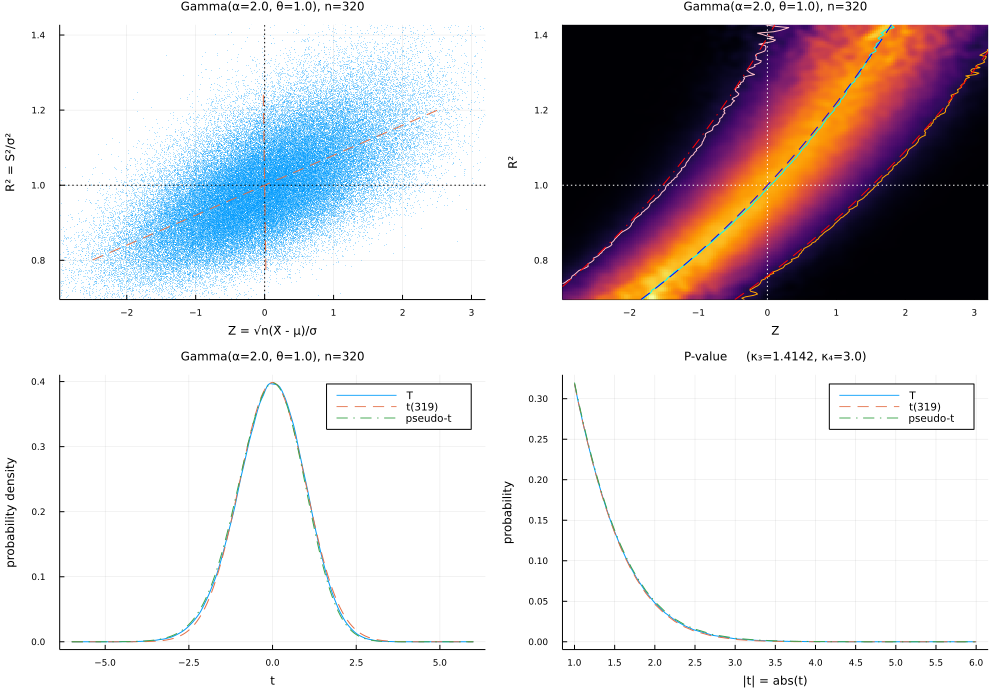

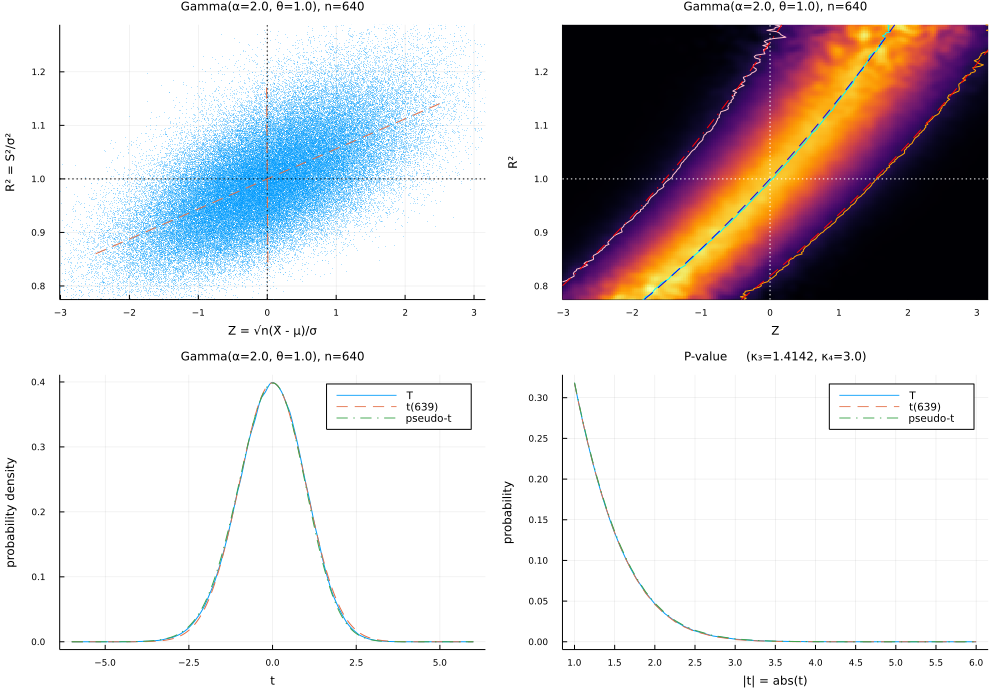

In [128]:
plotalliter(dist = Gamma(2, 1), n = (10, 20, 40, 80, 160, 320, 640))

skewness = 2.0
kurtosis = 6.0


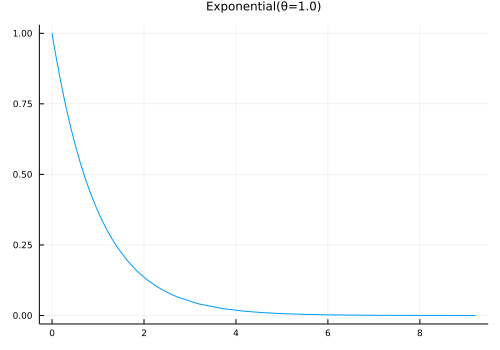

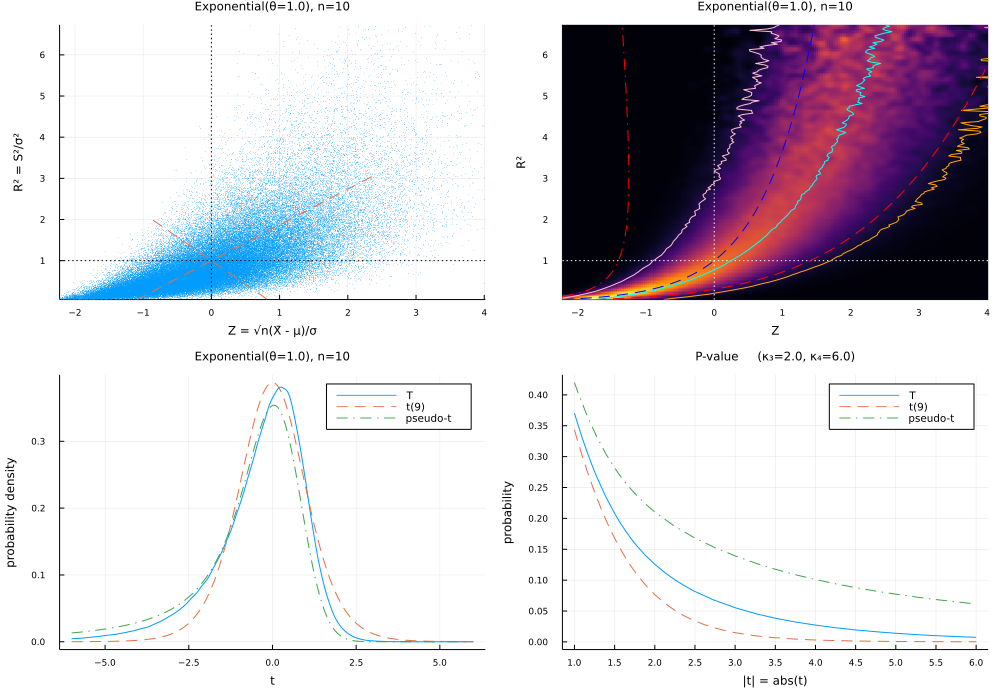

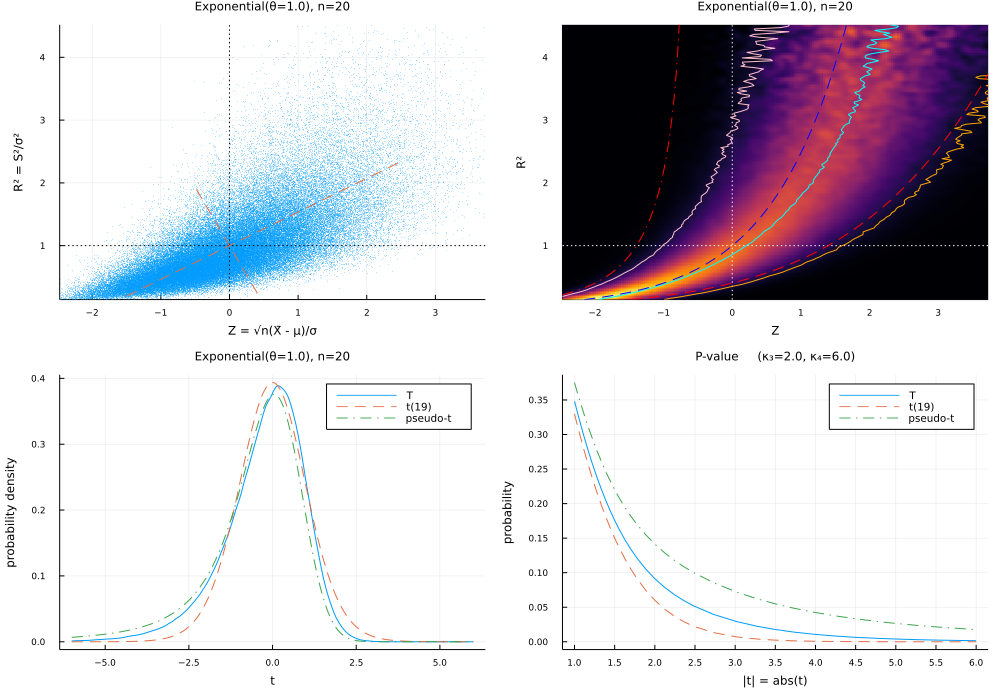

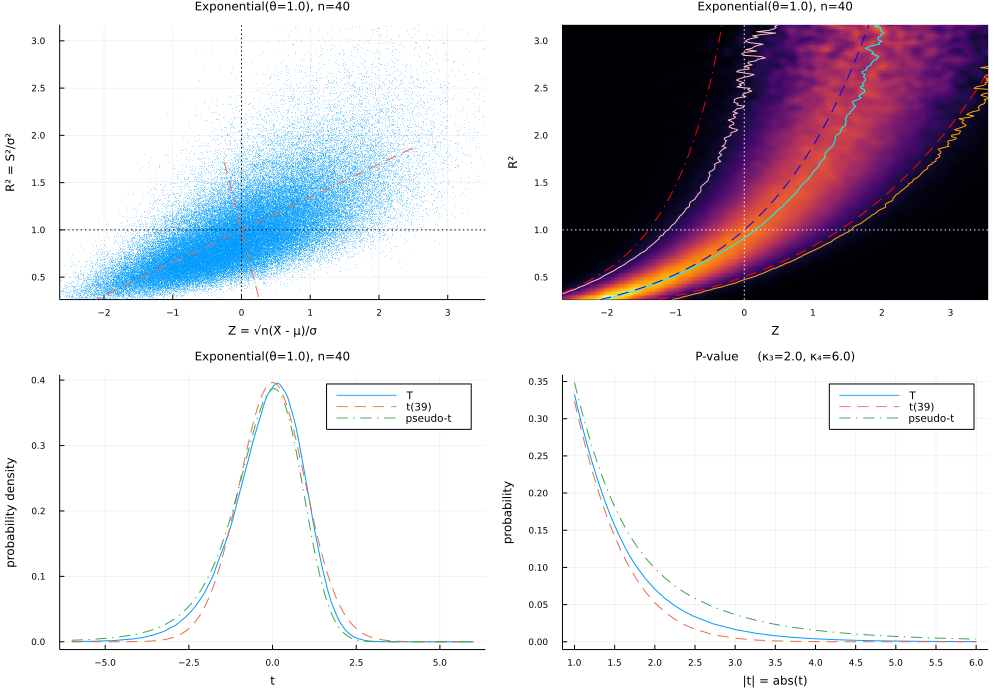

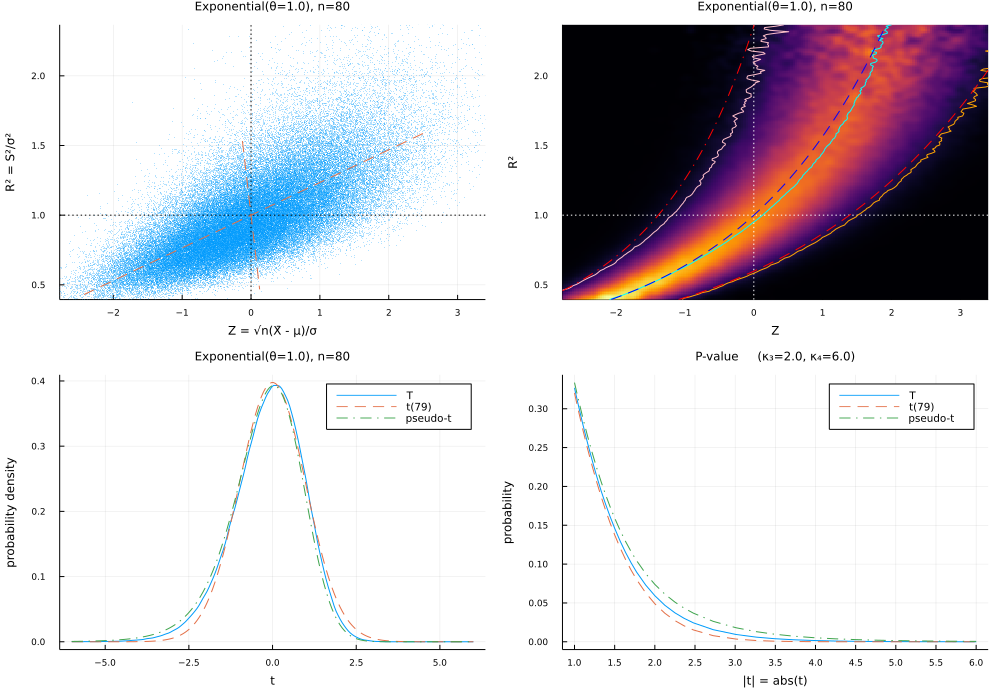

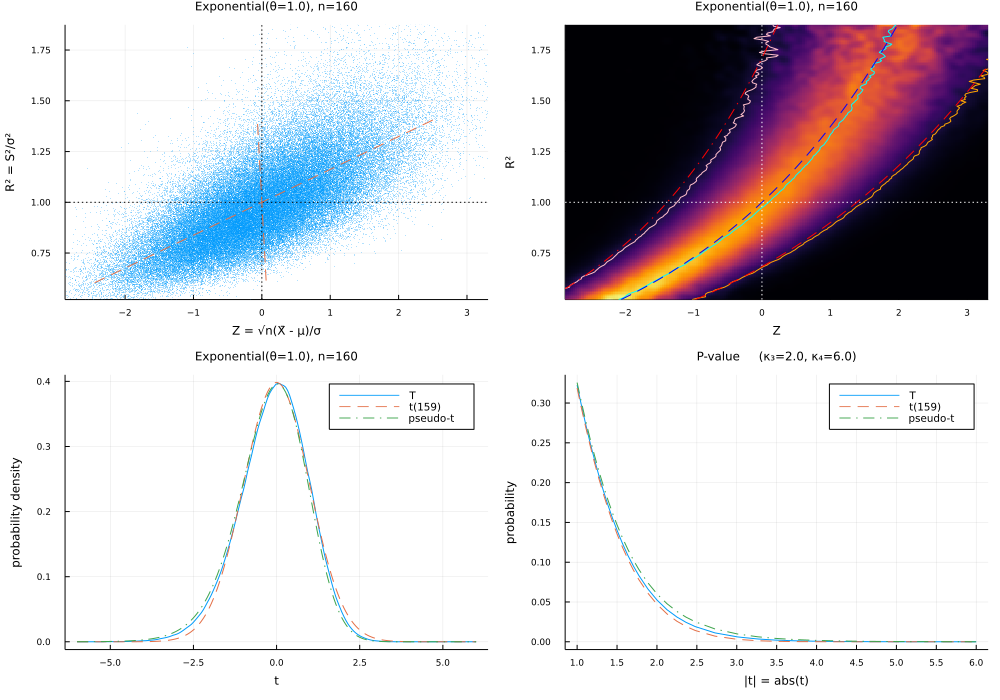

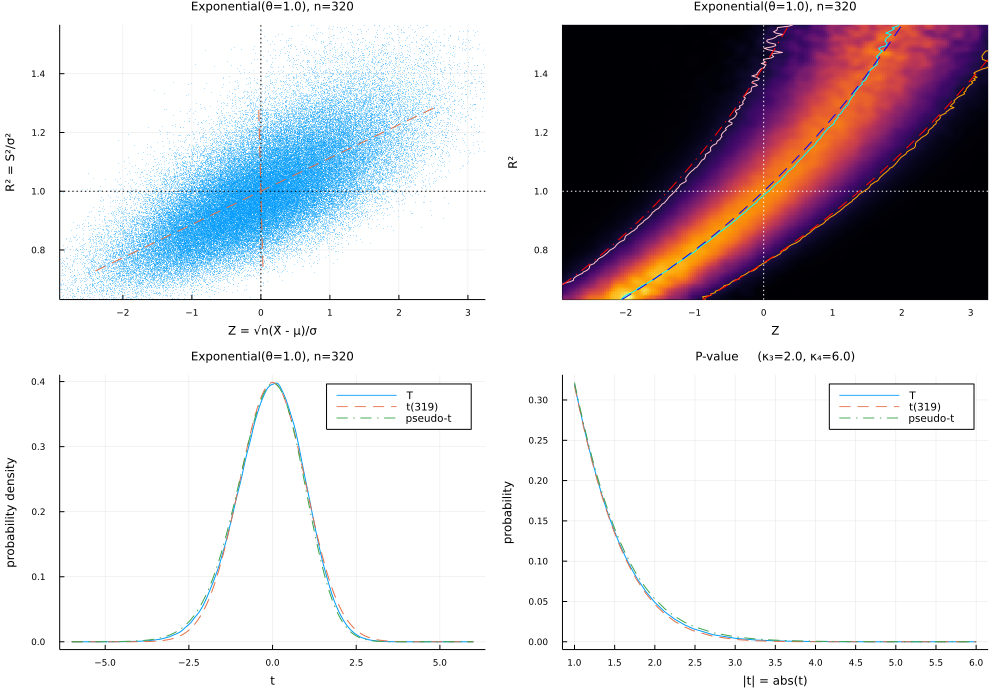

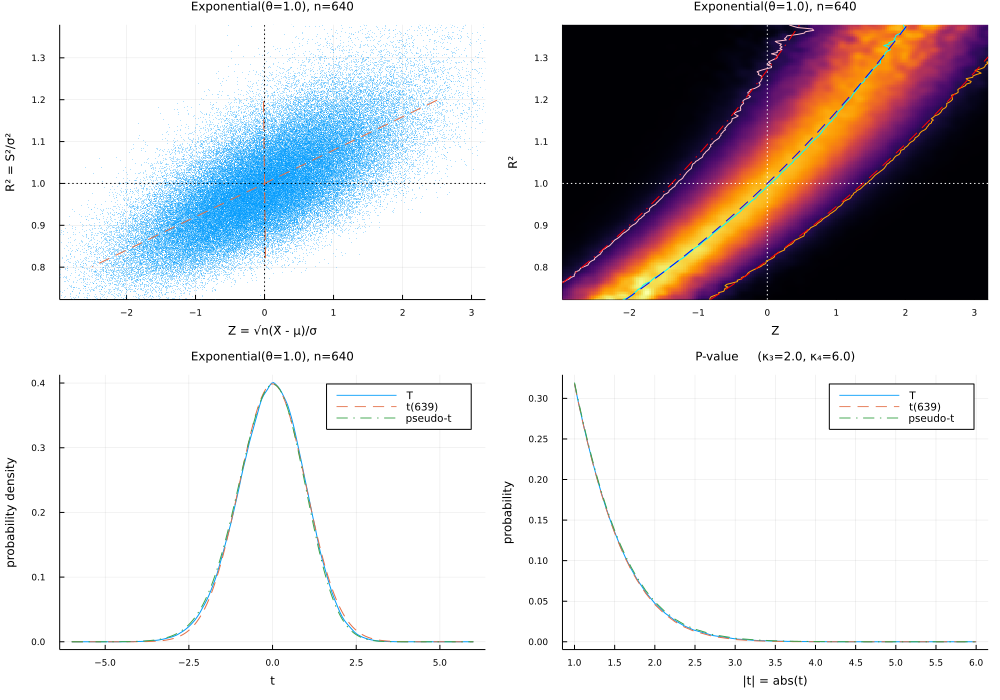

In [129]:
plotalliter(dist = Exponential(), n = (10, 20, 40, 80, 160, 320, 640))

skewness = 3.1005186785961634
kurtosis = 10.272211720261621


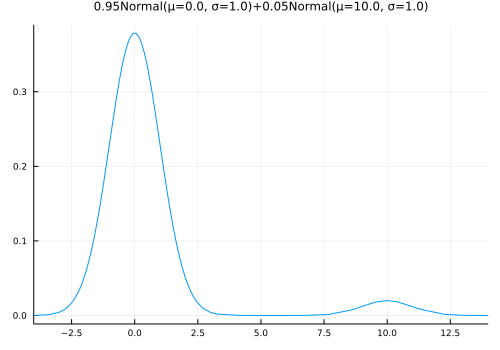

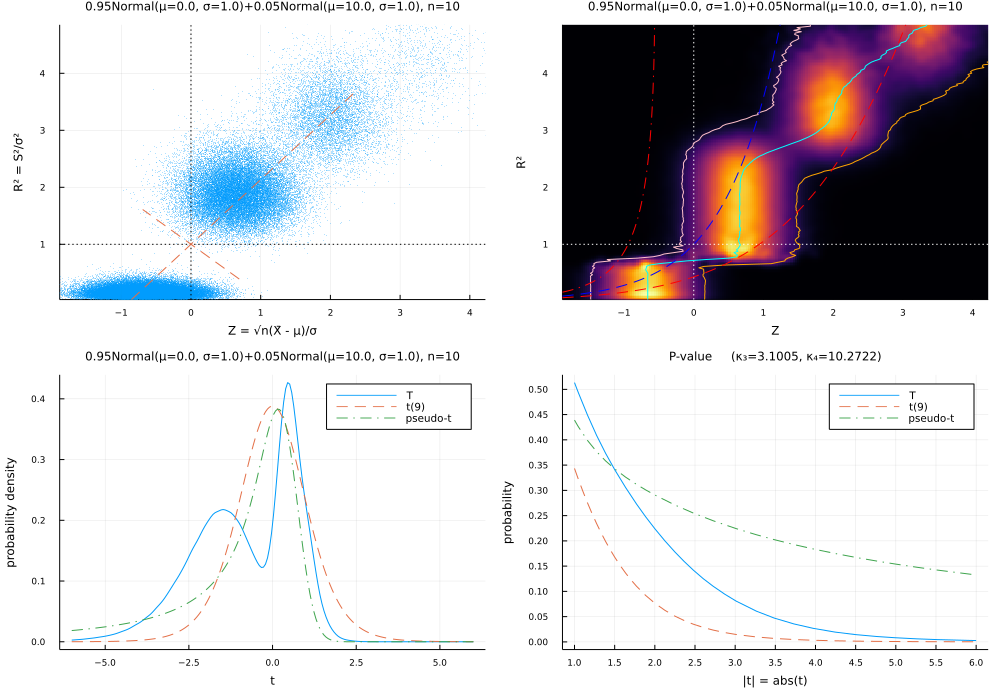

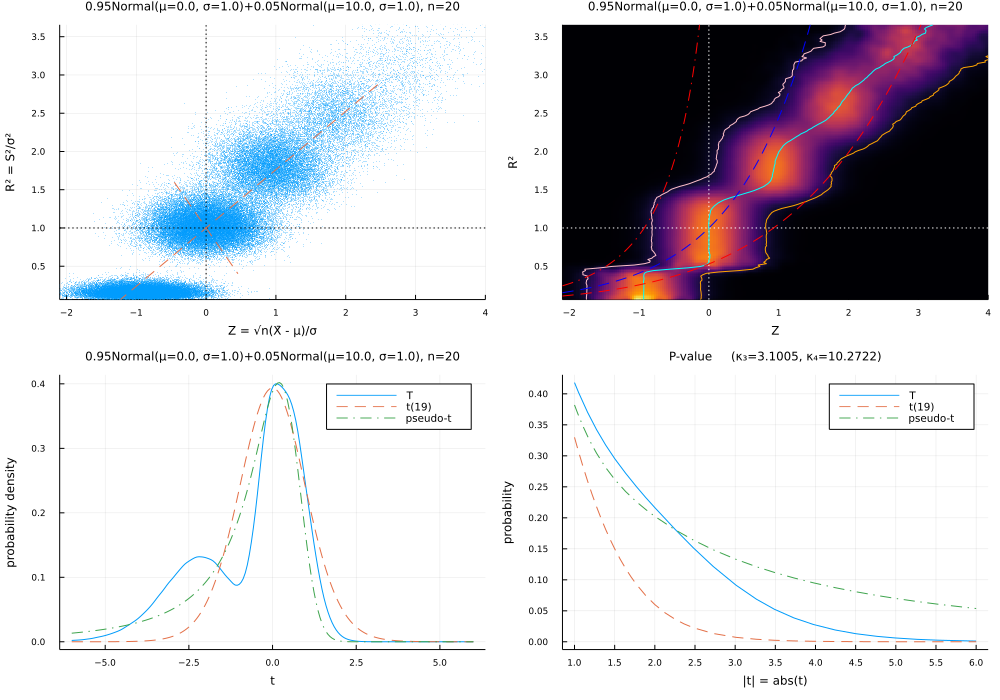

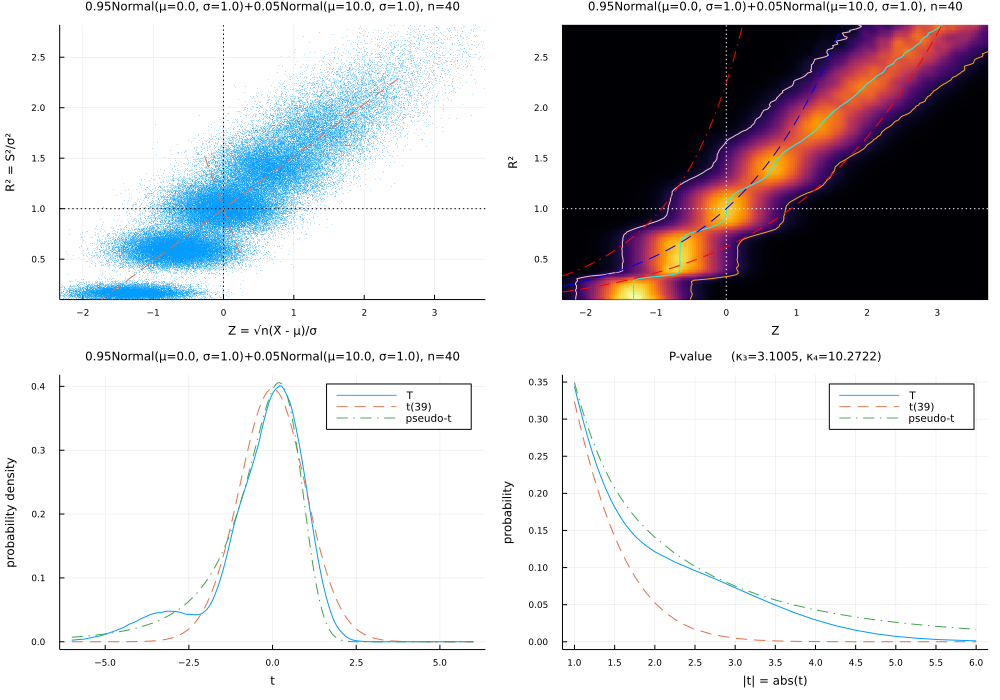

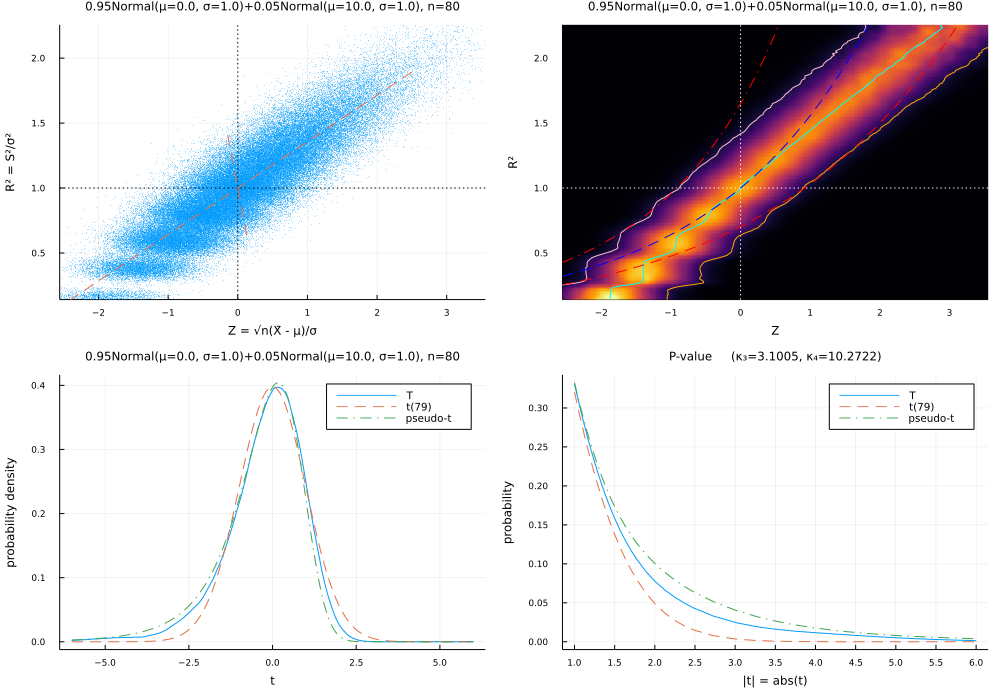

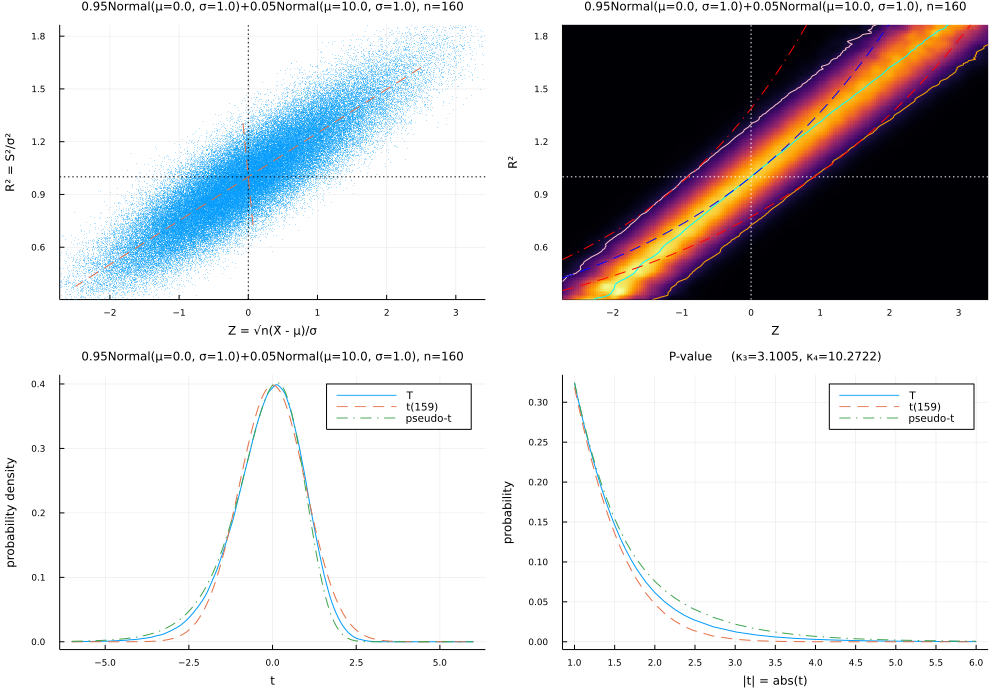

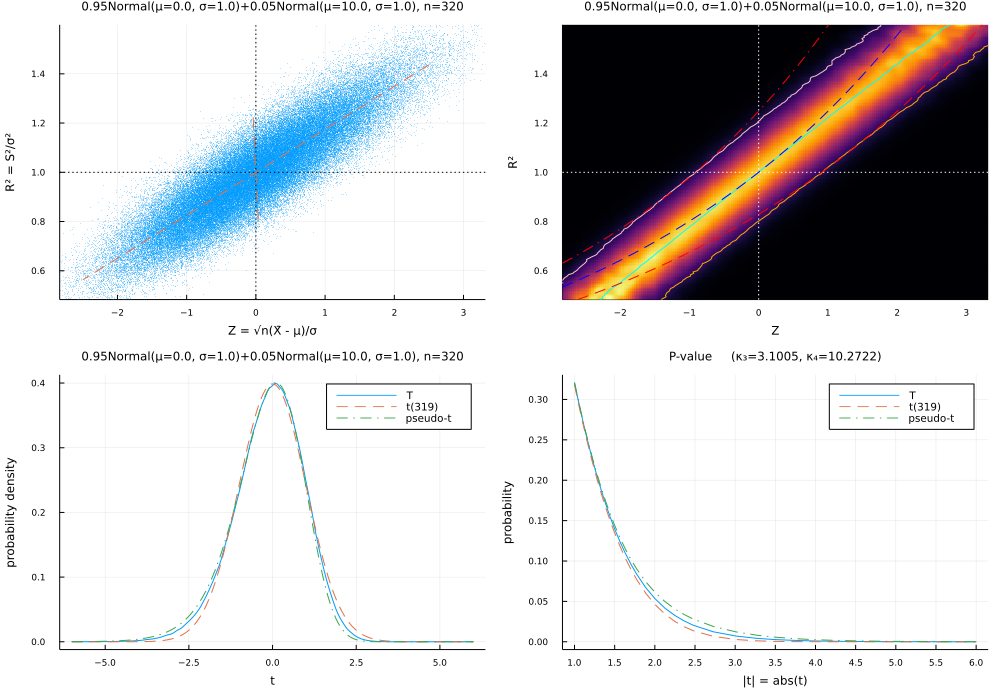

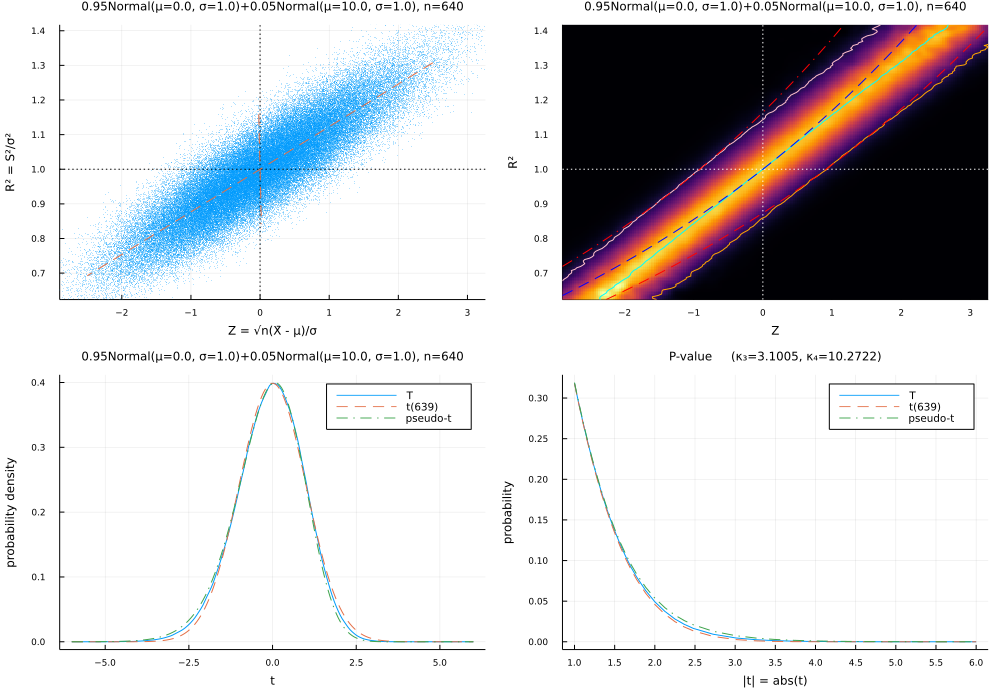

In [130]:
plotalliter(dist = MixtureModel([Normal(), Normal(10, 1)], [0.95, 0.05]), n = (10, 20, 40, 80, 160, 320, 640), distxlim=(-4, 14))

skewness = 6.184877138632554
kurtosis = 110.9363921763115


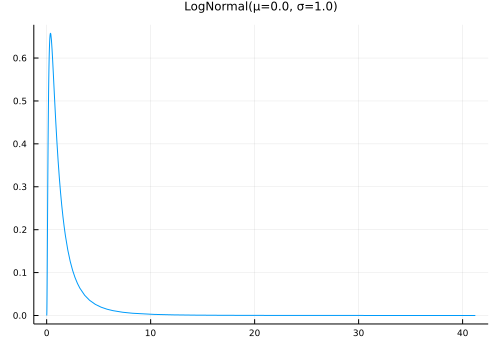

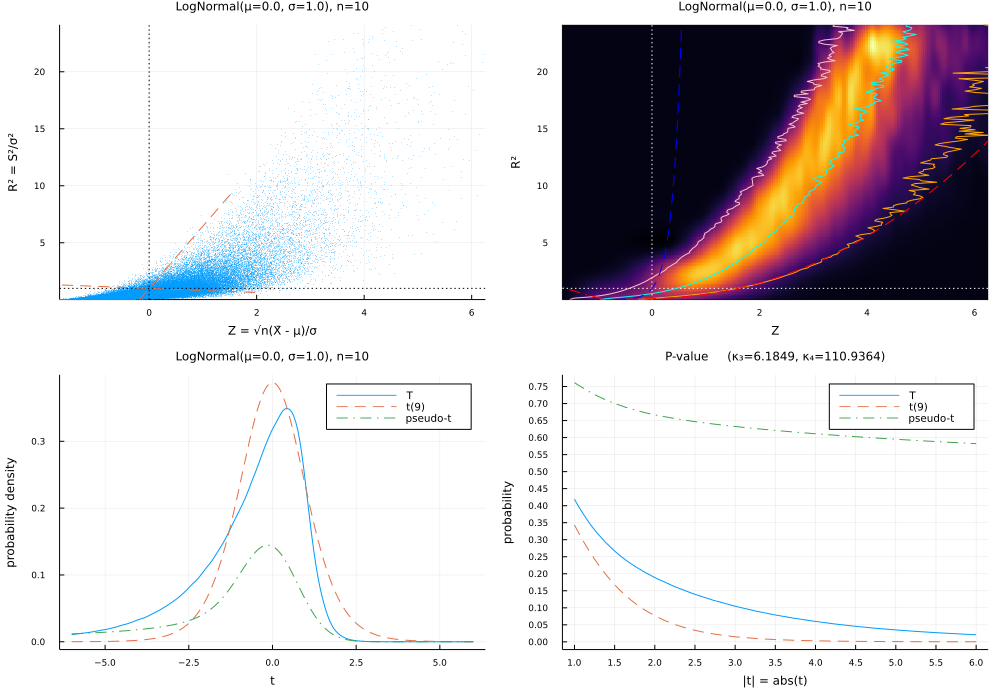

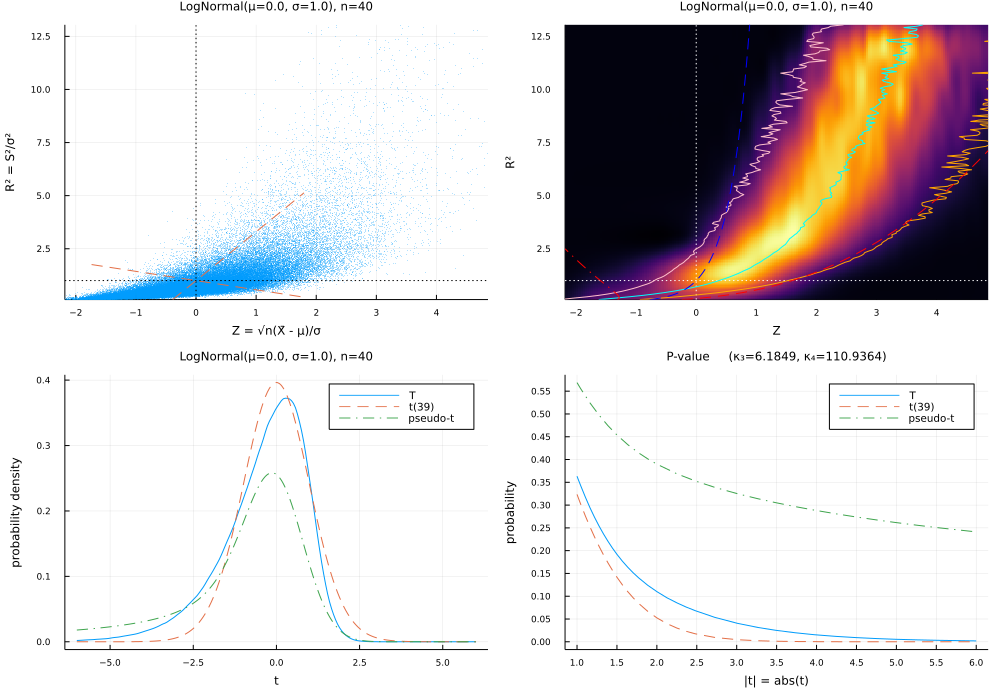

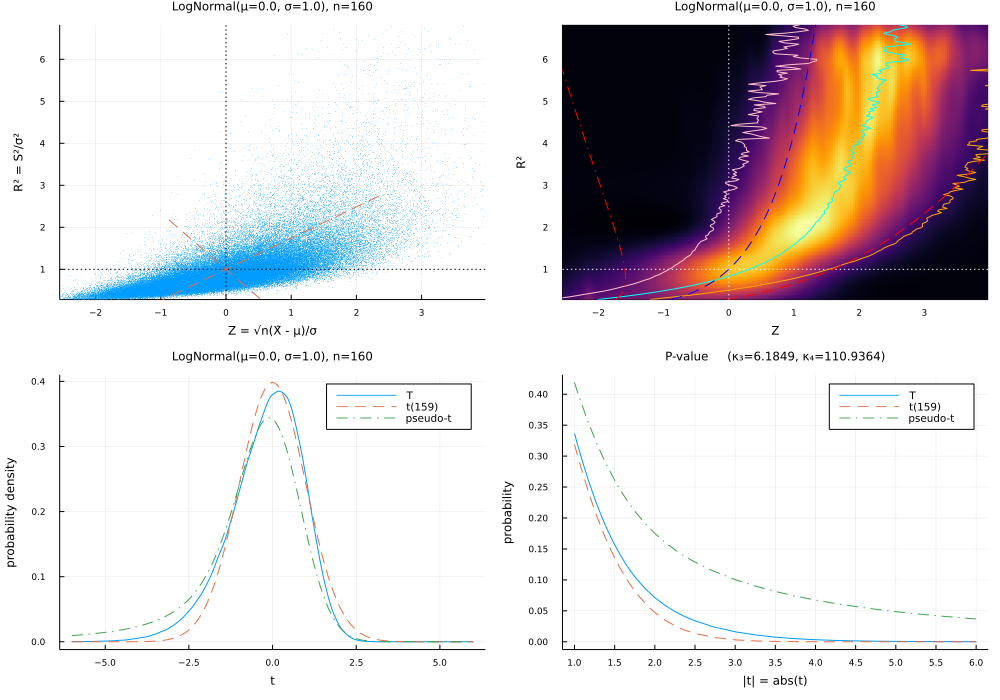

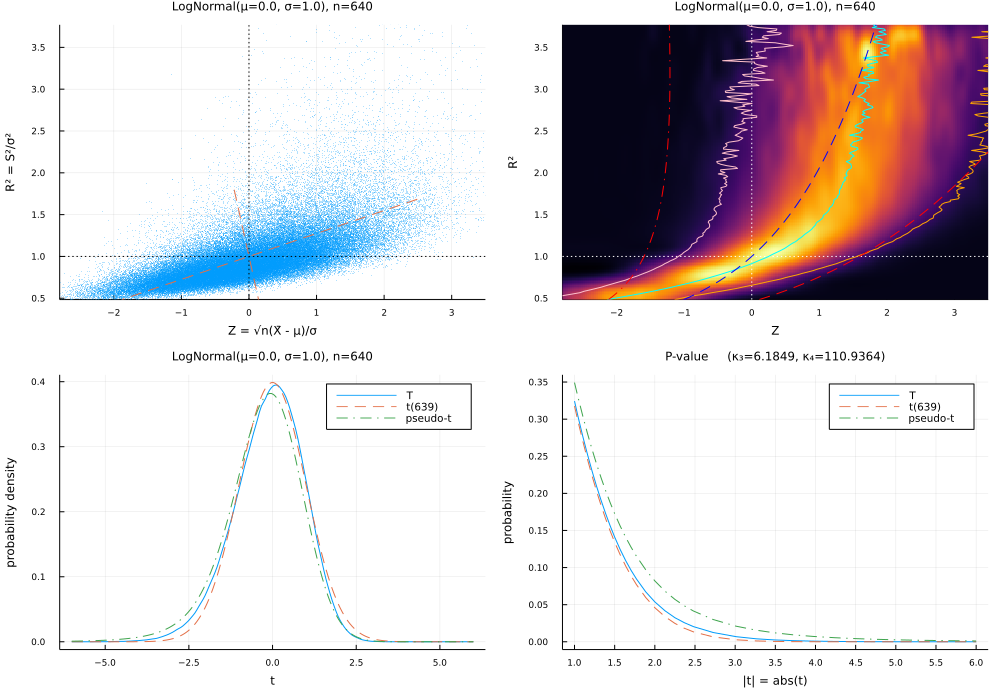

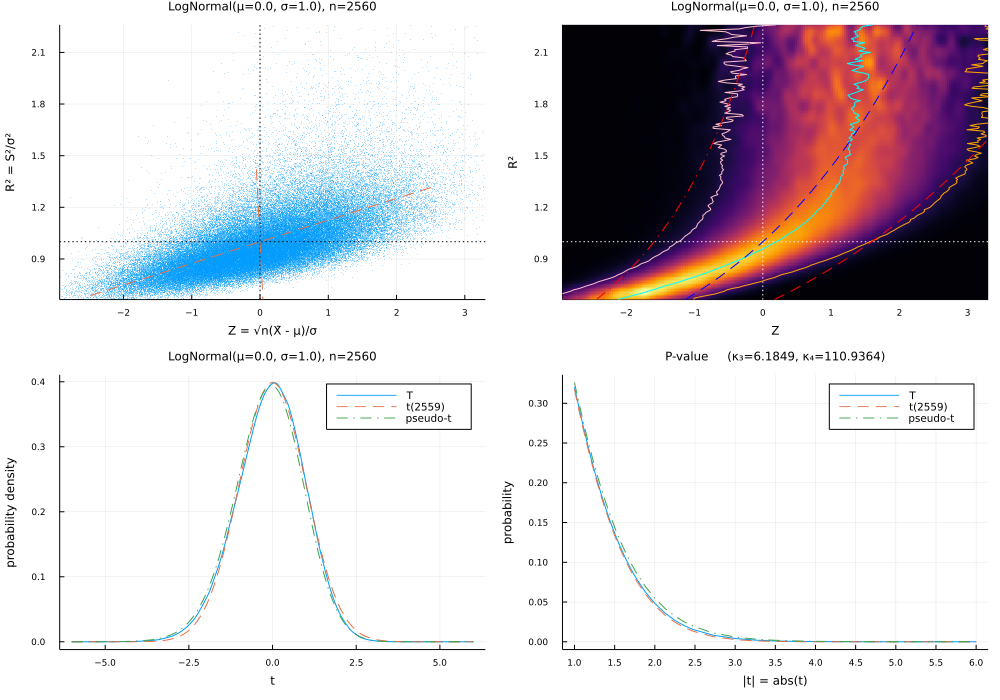

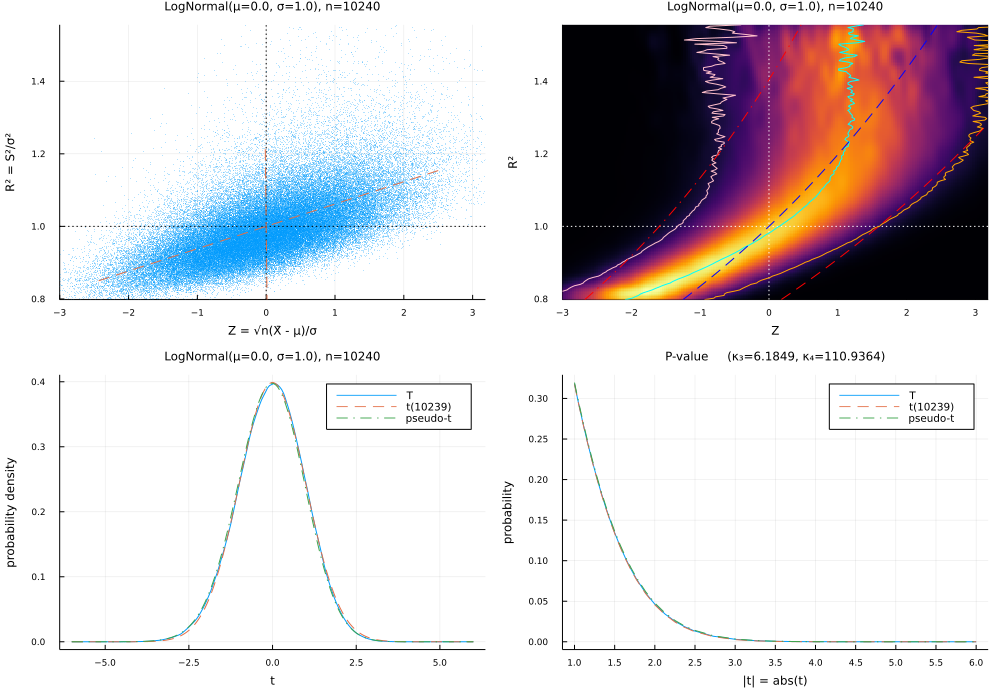

In [131]:
plotalliter(dist = LogNormal(), n = (10, 40, 160, 640, 2560, 10240))